In [1]:
from matplotlib import pyplot as plt
import numpy as np
import torch
import sys
sys.path.insert(0, '..')
from models import Classifier, WeightedMSE, FlatLoss, Disco
from utils import Metrics, find_threshold, DataSet, Logger
from utils import LegendreFitter, LegendreIntegral
from torch.autograd import gradcheck
torch.manual_seed(72)
use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if use_cuda else "cpu")
torch.cuda.ipc_collect()
#device = "cpu"

In [2]:
 def plot_stuff(model,X,y,x_biased,name='Naive DNN'):
    predictions = np.array(model(X).tolist()).flatten()
    metrics_test = Metrics(validation=True)
    metrics_test.calculate(pred=predictions, target=y,m=x_biased)
    R50 = metrics_test.R50[0]
    JSD = metrics_test.JSD[0]
    x_biased = (x_biased+1)*0.5 *250 
    
    c = find_threshold(predictions,(y==0),0.5)
    fig, [ax,ax1] = plt.subplots(2,1,figsize=(6,8),dpi=120,sharex=True)
    _,bins,_ = ax.hist(x_biased[(y==1)],bins=50,alpha=0.3,color='C1',label='Background',density=True,log=True)
    ax.hist(x_biased[(y==1)&(predictions<c)],bins=bins,alpha=0.3,color='C0',label='False Positives',density=True,log=True)
    ax.set_ylabel("Normed Counts",fontsize=20)
    ax.set_title('{} (R50:{:.2f}, 1/JSD:{:.2f})'.format(name,R50,1/JSD))
    ax.legend()

    efficiencies = np.linspace(0.1,0.9,9)
    cuts = []
    for eff in efficiencies:
        cuts.append(find_threshold(predictions,(y==0),eff))
    m_t = x_biased
    sorted_m = np.argsort(m_t)
    scores = predictions[sorted_m].reshape(-1,100)
    m_t = m_t[sorted_m]
    m = m_t.reshape(-1,100).mean(axis=1)
    F_s = []
    for s in scores.reshape(50,-1):
        density = np.histogram(s,bins=20,range=(0,1))[0]
        F_s.append(np.cumsum(density)/density.sum())
    F_s = np.array(F_s).T
    for j,cut in enumerate(cuts):
        c = f"C{j}" #if j!= 6 else f"C11"
        passed = (scores<cut).sum(axis=1)/scores.shape[1]
        ax1.plot(m,passed,label="{:0.1f} ({:0.2f})".format(efficiencies[j],cut),alpha=0.9,c=c,lw=1)
    ax1.set_ylabel(r"$\mathrm{passing\, events}/\mathrm{events\,in\, bin}$",fontsize=14)
    ax1.set_ylim([-0.02,1.02])
    ax1.legend(loc='upper right', bbox_to_anchor=(1,1) ,markerscale=5,title="SE (Cut)",ncol=1)
    ax1.set_xlabel(r"$m$",fontsize=14)
    fig.tight_layout(pad=0)
    plt.show()
    return (1/JSD,R50)

In [3]:
# mbins = 10
# mcontent = 4
# li = LegendreIntegral.apply
# fitter = LegendreFitter(mbins=mbins,power=2)
# inputTensor = torch.DoubleTensor(np.random.rand(mbins,mcontent)).sort(axis=1)[0]
# inputTensor.requires_grad_(True)
# sbins = 1000
# integral = li(inputTensor,fitter,sbins
#              )
# integral
# gradcheck(li,(inputTensor,fitter,sbins
#              ),eps=0.01,atol=0.01)

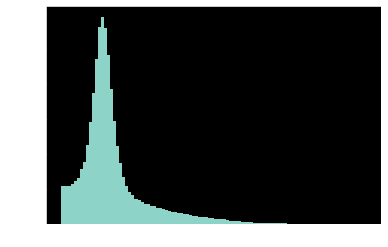

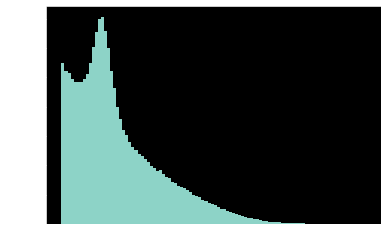

device: cuda:0


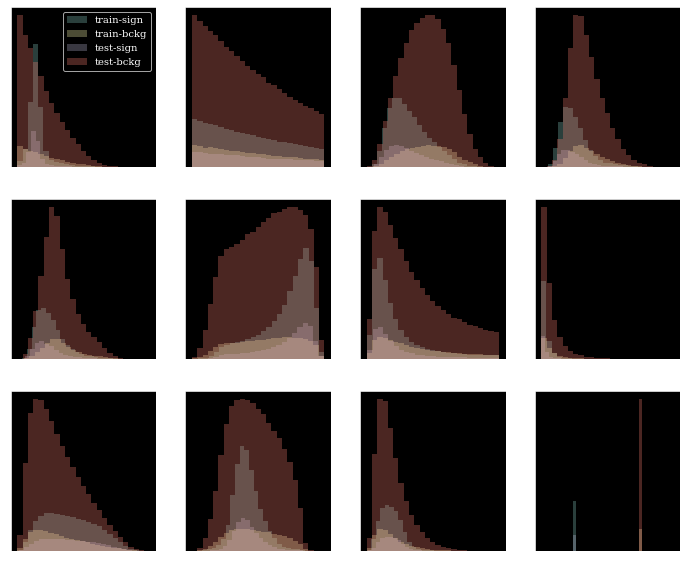

In [4]:
#dataset 
files = np.load("data/W_FCN_v0.npz")
train = files["train"].astype('float32')
val = files["val"].astype('float32')

train_labels = train[::,-1]
val_labels   = val[::,-1]

maxdata = train.max(axis=0)
mindata = train.min(axis=0)
train = (train-mindata)/(maxdata-mindata)
train[::,0] = 2*train[::,0]-1
#train[::,0][train_labels==1] = 2*(np.argsort(train[::,0][train_labels==1]))/(train_labels==1).sum()-1

plt.hist(train[::,0],bins=100)
plt.show()

maxdata = val.max(axis=0)
mindata = val.min(axis=0)
val = (val-mindata)/(maxdata-mindata)
val[::,0] = 2*val[::,0]-1
plt.hist(val[::,0],bins=100)
plt.show()

traindataset = DataSet(samples=train[::,1:-1],
                       labels=train_labels,
                       m = train[::,0])
valdataset = DataSet(samples=val[:,1:-1],
                     labels=val_labels,
                    m = val[::,0])
test = files["test"]
test_labels=test[::,-1]
maxdata = test.max(axis=0)
mindata = test.min(axis=0)
test = (test-mindata)/(maxdata-mindata)
test[::,0] = 2*test[::,0]-1
X = torch.from_numpy(test[:,1:11]).float().to(device)

print('device:', device)



# maxdata = val.max(axis=0)
# mindata = val.min(axis=0)
# val = (val-mindata)/(maxdata-mindata)

# m,dm = np.histogram(train[::,0],bins=train.shape[0],density=True)
# train[::,0] = np.cumsum(m*(dm[1]-dm[0]))
# m,dm = np.histogram(val[::,0],bins=val.shape[0],density=True)
# val[::,0] = np.cumsum(m*(dm[1]-dm[0]))
# m = train[::,0].argsort()
# m = m/m.size
#train[::,0] = 2*train[::,0]-1
# m = val[::,0].argsort()
# m = m/m.size
# val[::,0] = 2*m-1
fig, axes = plt.subplots(3,4,figsize=(12,10))
for i,ax in enumerate(axes.flatten()):
    ax.hist(train[:,i][train[:,-1]==0],bins=25,alpha=0.3,label='train-sign')
    ax.hist(train[:,i][train[:,-1]==1],bins=25,alpha=0.3,label='train-bckg')
    ax.hist(test[:,i][test[:,-1]==0],bins=25,alpha=0.3,label='test-sign')
    ax.hist(test[:,i][test[:,-1]==1],bins=25,alpha=0.3,label='test-bckg')
    ax.set_yticks([])
    if i==0: ax.legend()
    

In [7]:
params = {'epochs'     : 200,
          'interval'   : 100,
          'batch_size' : 4096*8,
          'shuffle'    : True,
          'num_workers': 6,
          'drop_last'  :True,
          'device'     : device,
          'pass_x_biased':True,
         }

# As a function of strength

strength 0
Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (188.7s)
 Train: loss:0.2072, acc:77% || Val: loss: 0.0576, acc:79%, R50: 19.4679, 1/JSD: 4.8387
Epoch:0200/0200  (372.5s)
 Train: loss:0.2018, acc:81% || Val: loss: 0.0590, acc:84%, R50: 19.5985, 1/JSD: 5.3999


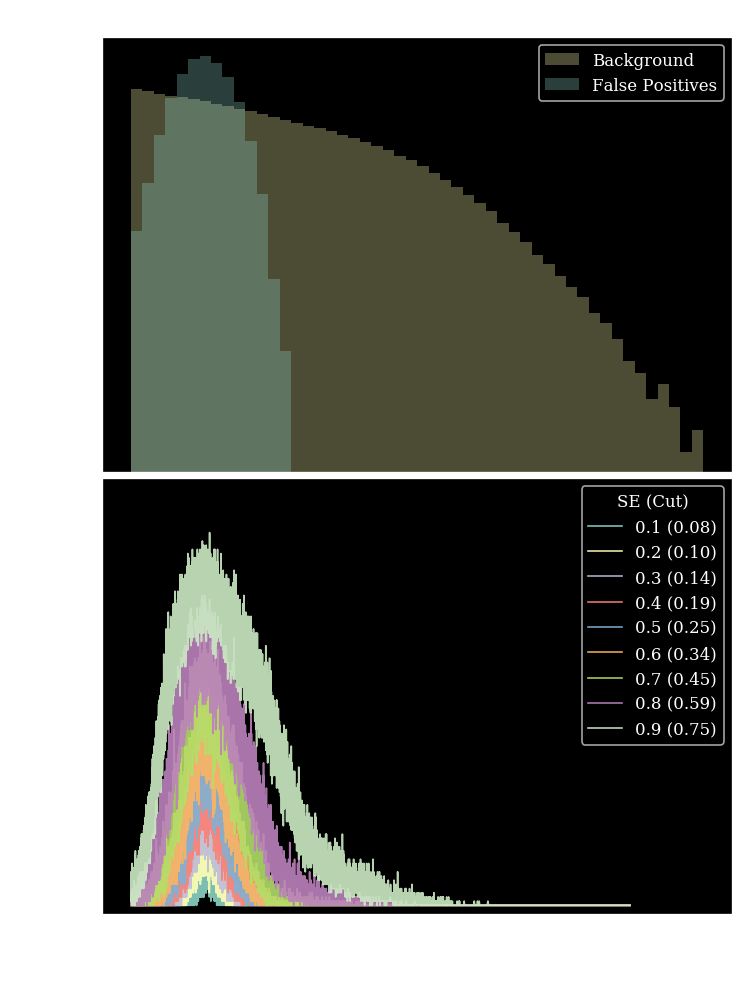

In [15]:
for i,frac in enumerate([0]):
    print("strength",frac)
    metrics_train_L = Metrics()
    metrics_val_L = Metrics(validation=True)

    torch.manual_seed(777)
    model_L = Classifier().to(device)
    optimizer = torch.optim.SGD(model_L.parameters(),lr=1,momentum=0.)
    loss =  FlatLoss(labels=traindataset.labels,frac=frac,sbins=128,bins=135)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=200, gamma=0.9)
    log=Logger("./logs/logWFCNFlatLossBintest.txt",overwrite=False)
    model_L.fit(traindataset=traindataset,
                valdataset=valdataset,
                optimizer=optimizer,
                loss=loss,
                **params,
                log=log,
              #scheduler=scheduler,
              metrics=[metrics_train_L,metrics_val_L])
    model_L.train(False)
    out=plot_stuff(model=model_L,name=f"Flat DNN str:{frac}",X=X,y=test_labels,x_biased=test[:,0])

strength 0.1
Entering Training...
Epoch:0001/0200  (8.0  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (191.6s)
 Train: loss:0.2208, acc:73% || Val: loss: 0.0590, acc:75%, R50: 18.6125, 1/JSD: 4.3730
Epoch:0200/0200  (359.3s)
 Train: loss:0.2016, acc:81% || Val: loss: 0.0574, acc:83%, R50: 20.3014, 1/JSD: 5.3776


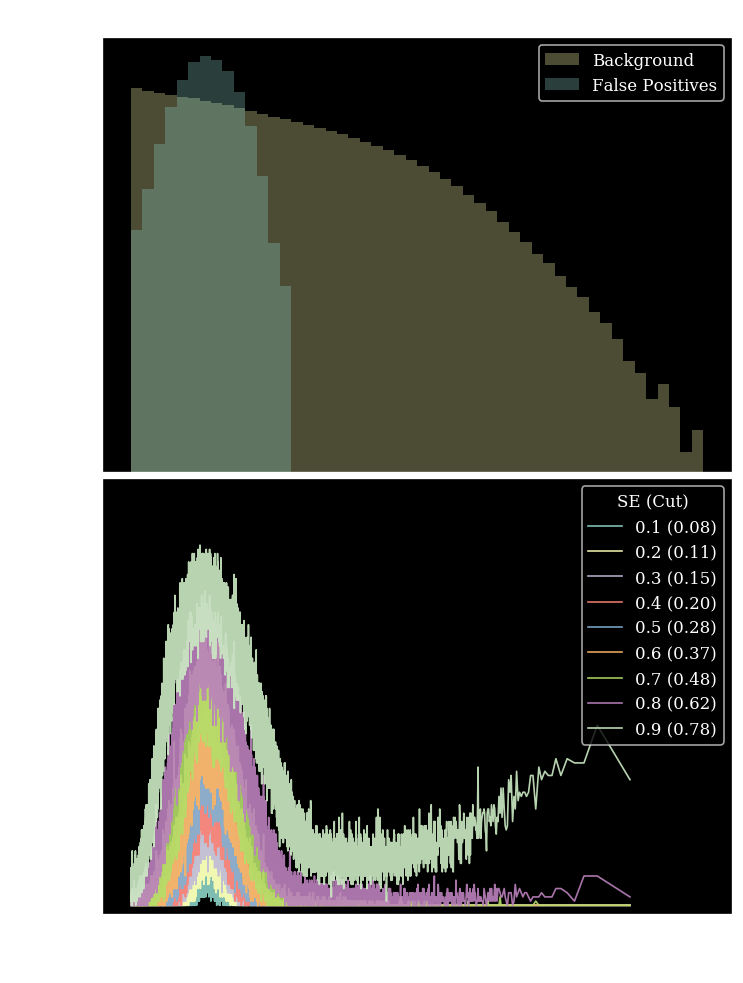

strength 1
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (182.6s)
 Train: loss:0.2272, acc:79% || Val: loss: 0.0614, acc:83%, R50: 17.7429, 1/JSD: 5.4876
Epoch:0200/0200  (351.2s)
 Train: loss:0.2213, acc:81% || Val: loss: 0.0626, acc:85%, R50: 20.7599, 1/JSD: 4.4683


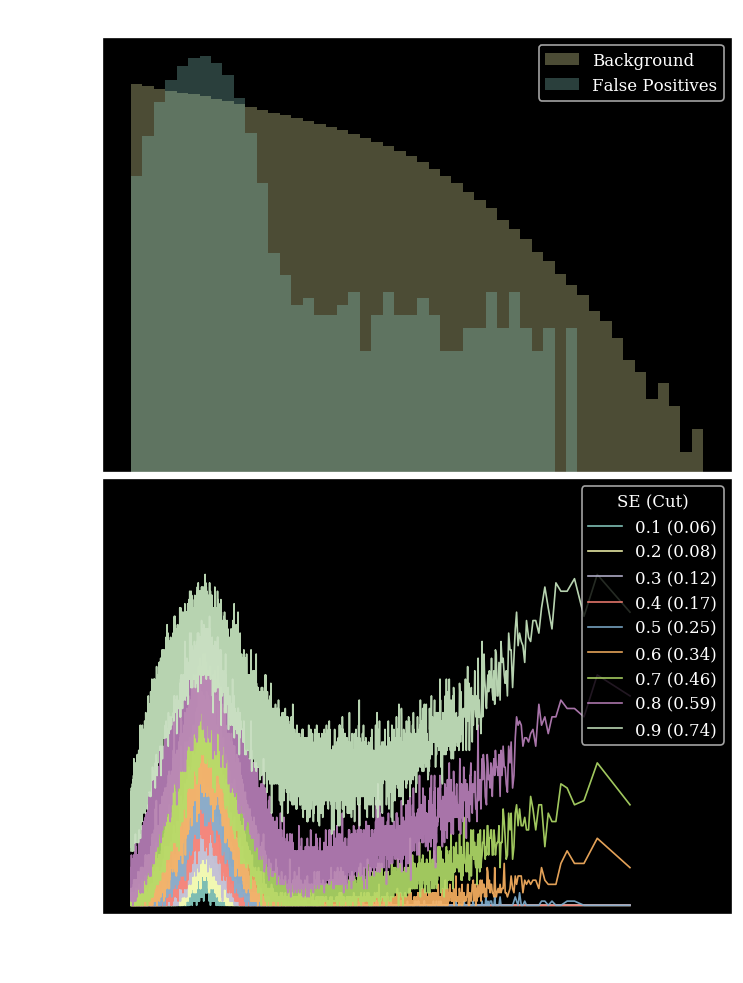

strength 10
Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (190.7s)
 Train: loss:0.2884, acc:73% || Val: loss: 0.0715, acc:80%, R50: 10.3633, 1/JSD: 56.1481
Epoch:0200/0200  (374.2s)
 Train: loss:0.2725, acc:76% || Val: loss: 0.0704, acc:82%, R50: 12.6379, 1/JSD: 50.1578


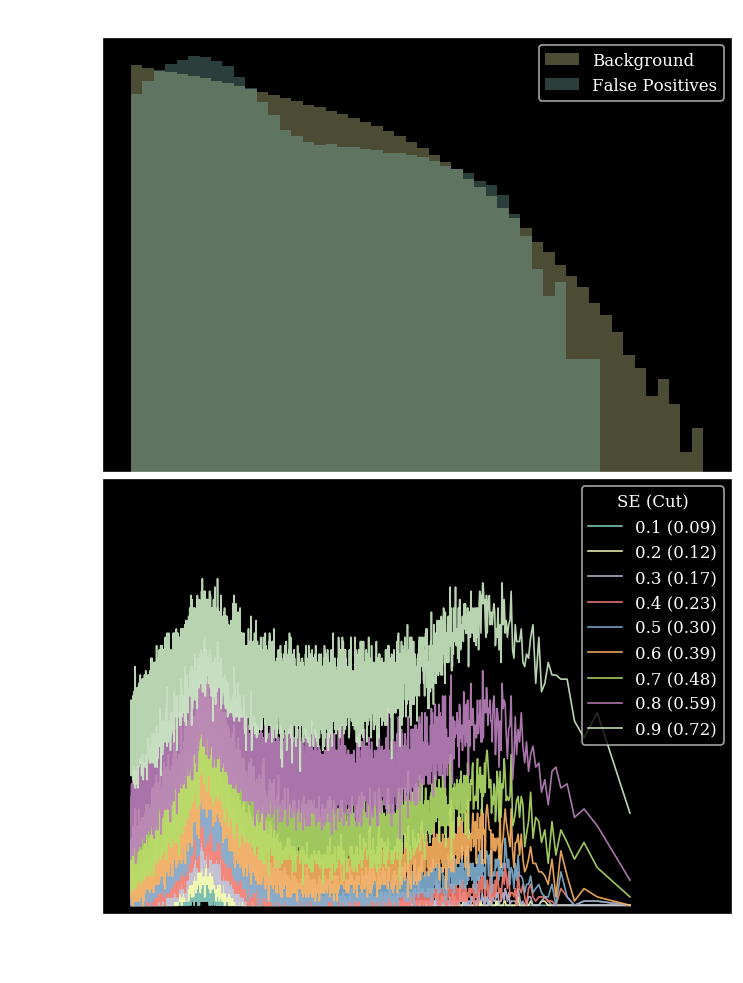

strength 20
Entering Training...
Epoch:0001/0200  (8.1  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (176.9s)
 Train: loss:0.3206, acc:70% || Val: loss: 0.0744, acc:79%, R50: 8.6915, 1/JSD: 282.7333
Epoch:0200/0200  (358.2s)
 Train: loss:0.3170, acc:71% || Val: loss: 0.0737, acc:82%, R50: 10.0779, 1/JSD: 187.9300


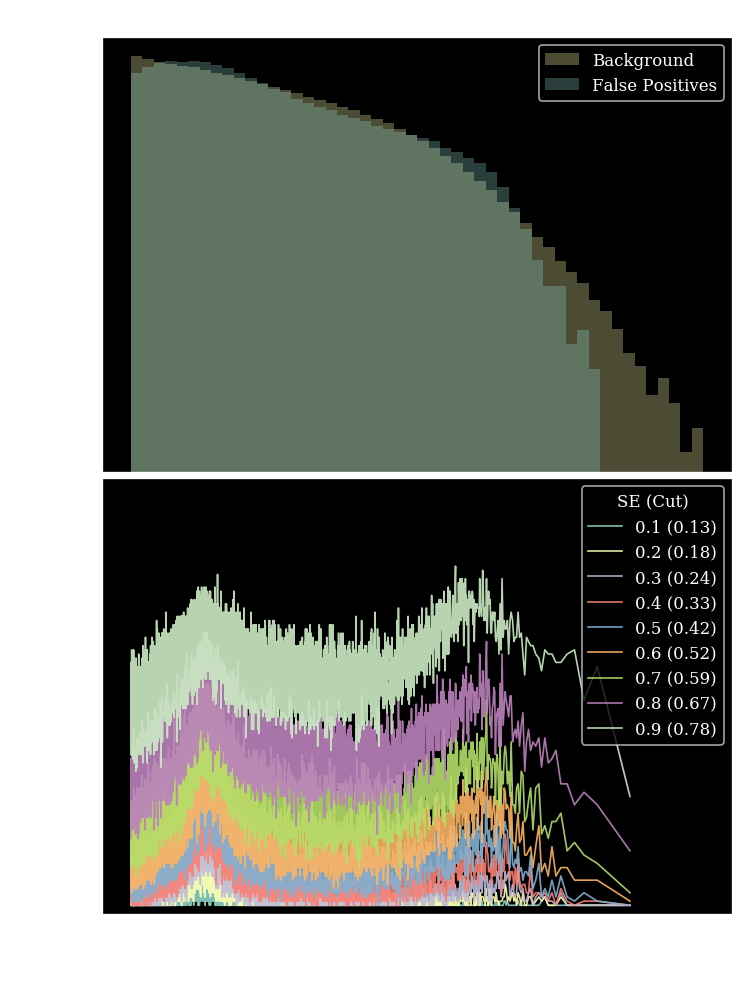

strength 32
Entering Training...
Epoch:0001/0200  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (182.7s)
 Train: loss:0.3579, acc:67% || Val: loss: 0.0772, acc:80%, R50: 7.9830, 1/JSD: 320.0453
Epoch:0200/0200  (350.1s)
 Train: loss:0.3674, acc:67% || Val: loss: 0.0784, acc:81%, R50: 8.6808, 1/JSD: 430.5282


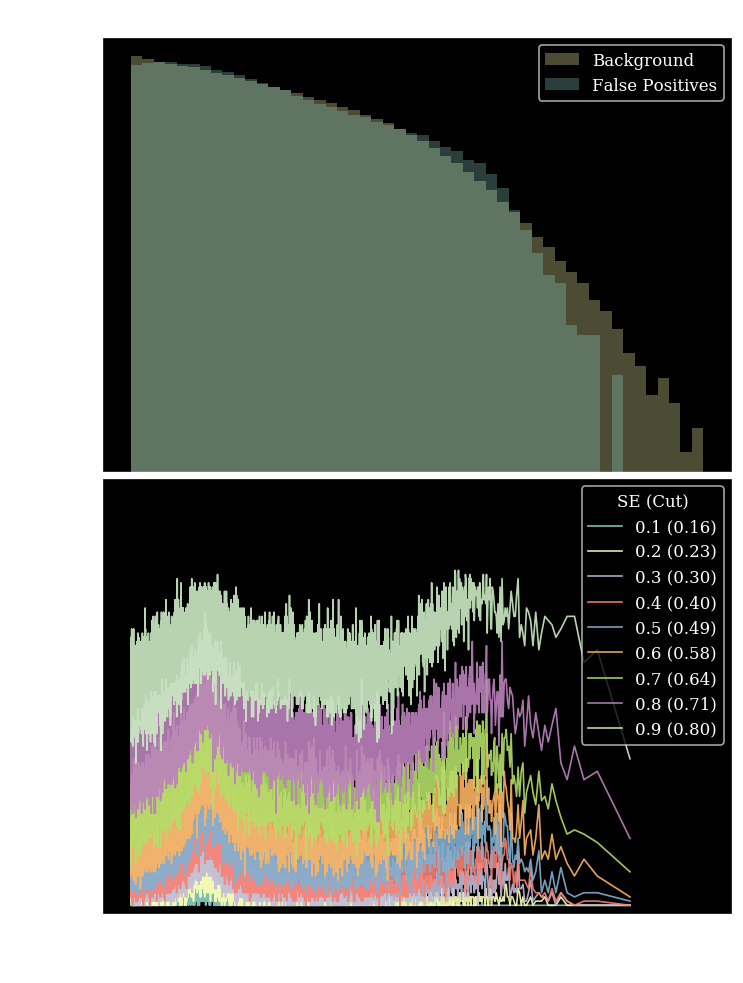

strength 64
Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0200/0200  (374.8s)
 Train: loss:0.6953, acc:30% || Val: loss: 0.1951, acc:80%, R50: 2.7399, 1/JSD: 97.2572


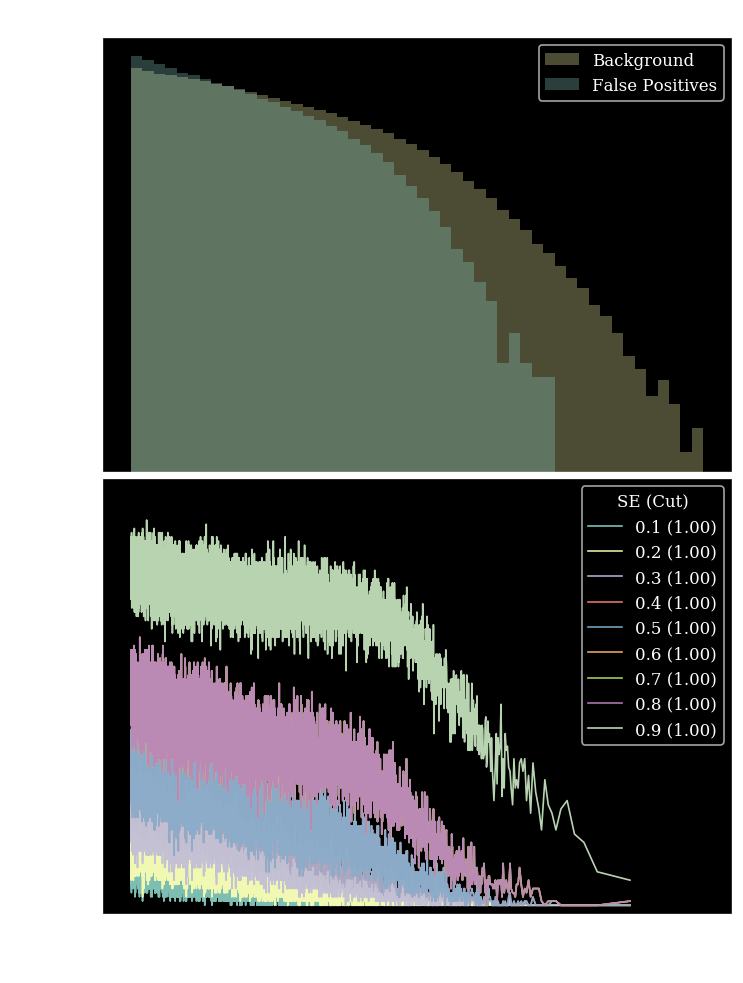

strength 128
Entering Training...
Epoch:0001/0200  (8.0  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (175.3s)
 Train: loss:0.6978, acc:30% || Val: loss: 0.1951, acc:80%, R50: 4.2066, 1/JSD: 5.5149
Epoch:0200/0200  (358.7s)
 Train: loss:0.6953, acc:30% || Val: loss: 0.1951, acc:80%, R50: 3.1442, 1/JSD: 6.3800


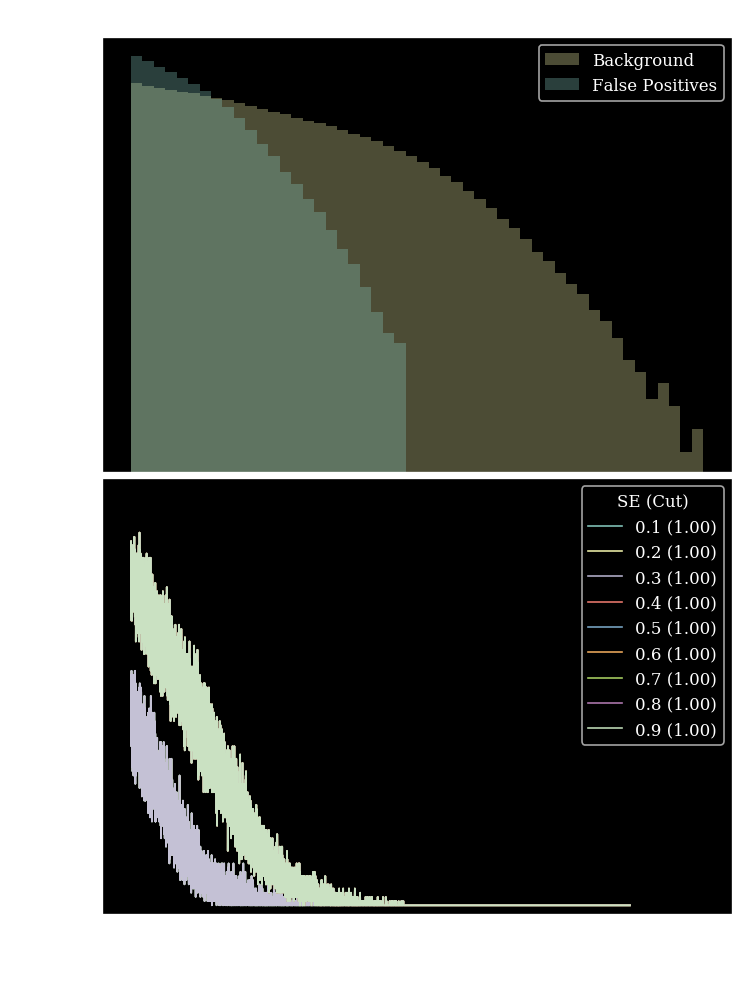

strength 135
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (188.9s)
 Train: loss:0.6978, acc:30% || Val: loss: 0.1951, acc:80%, R50: 4.3219, 1/JSD: 5.8110
Epoch:0200/0200  (357.2s)
 Train: loss:0.6953, acc:30% || Val: loss: 0.1951, acc:80%, R50: 3.2283, 1/JSD: 6.1887


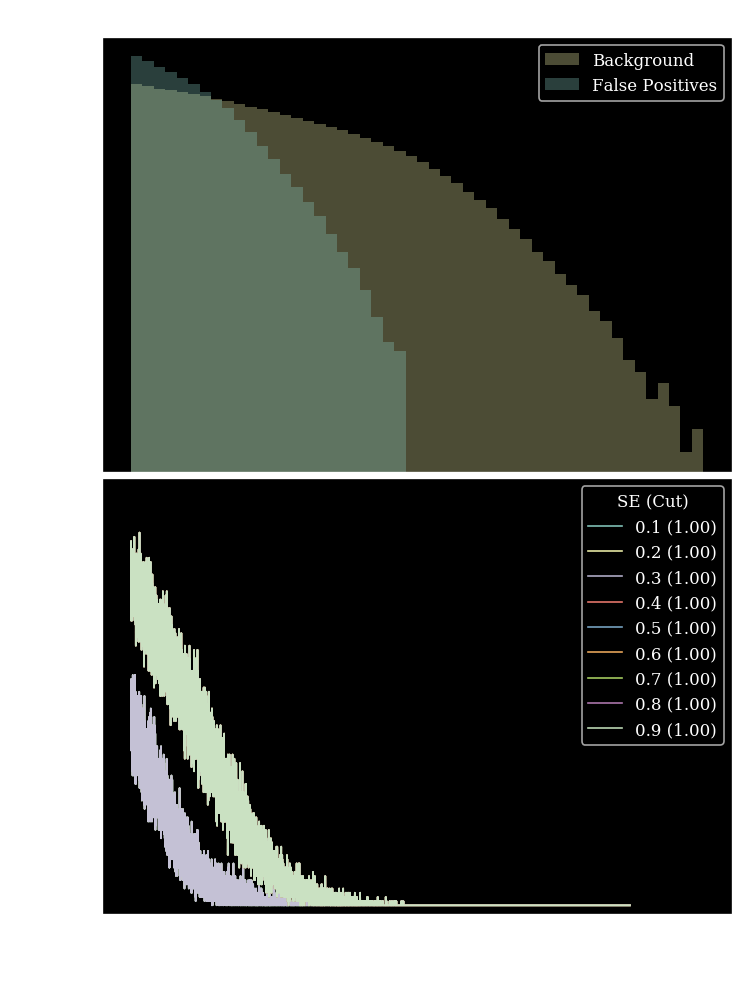

strength 140
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (190.1s)
 Train: loss:0.6978, acc:30% || Val: loss: 0.1951, acc:80%, R50: 4.4270, 1/JSD: 5.7204
Epoch:0200/0200  (377.0s)
 Train: loss:0.6953, acc:30% || Val: loss: 0.1951, acc:80%, R50: 3.2841, 1/JSD: 6.1104


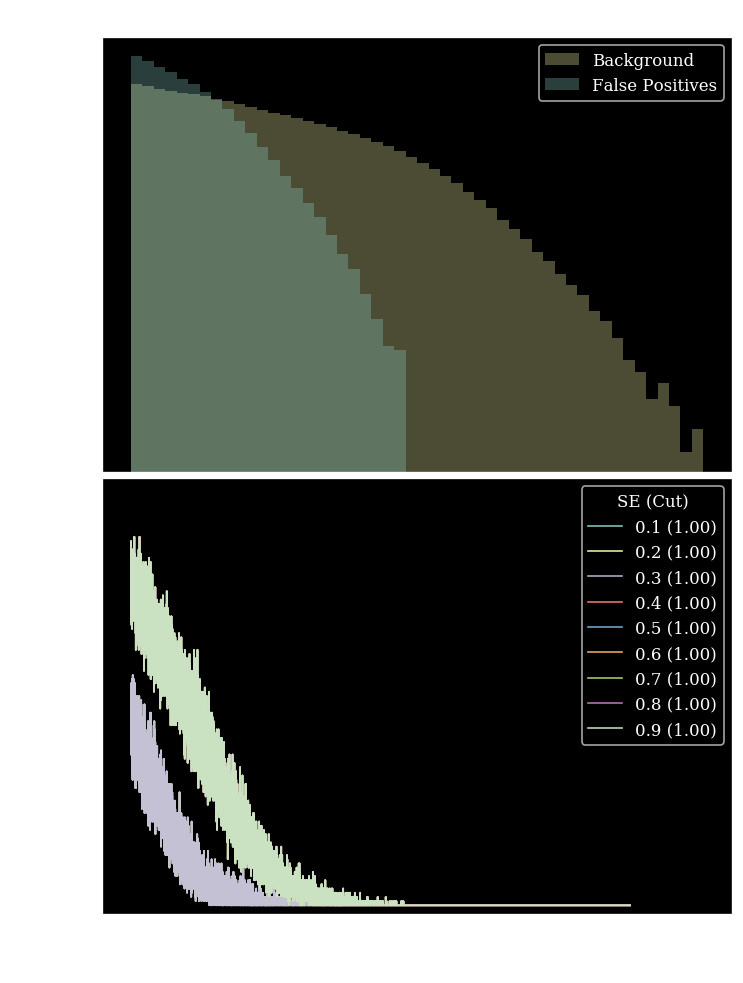

strength 246
Entering Training...
Epoch:0001/0200  (8.4  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (181.2s)
 Train: loss:0.6978, acc:30% || Val: loss: 0.1951, acc:80%, R50: 4.2767, 1/JSD: 199.4176
Epoch:0200/0200  (368.7s)
 Train: loss:0.6953, acc:30% || Val: loss: 0.1951, acc:80%, R50: 4.2063, 1/JSD: 230.8365


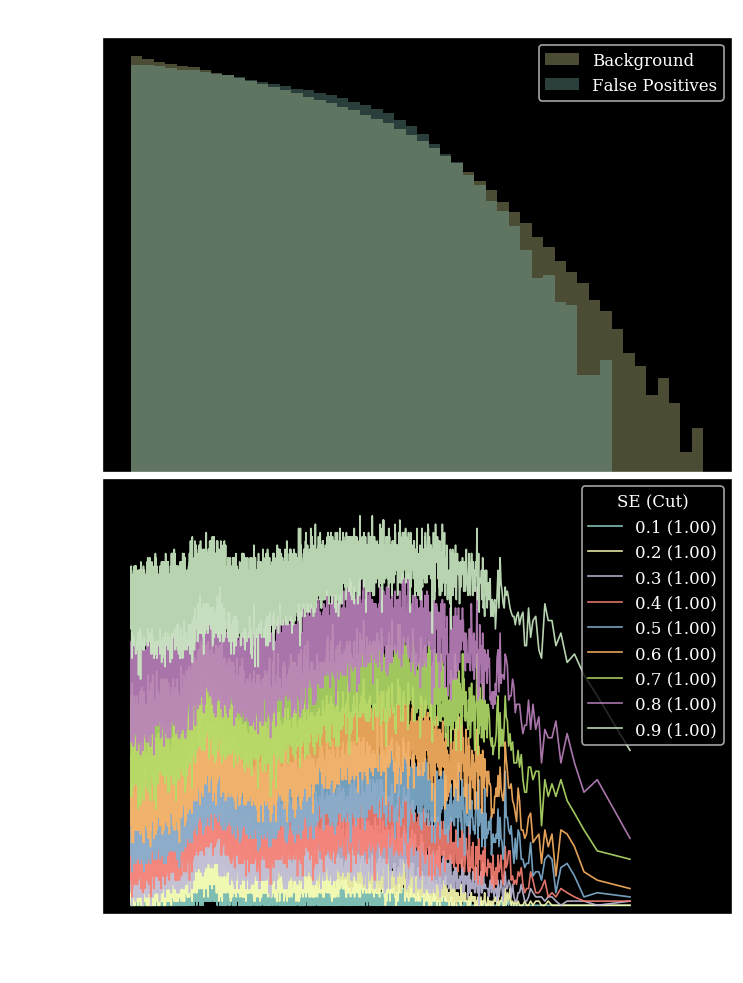

strength 300
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (182.0s)
 Train: loss:0.6978, acc:30% || Val: loss: 0.1951, acc:80%, R50: 3.6262, 1/JSD: 601.1087
Epoch:0200/0200  (350.6s)
 Train: loss:0.6953, acc:30% || Val: loss: 0.1951, acc:80%, R50: 3.6816, 1/JSD: 594.8400


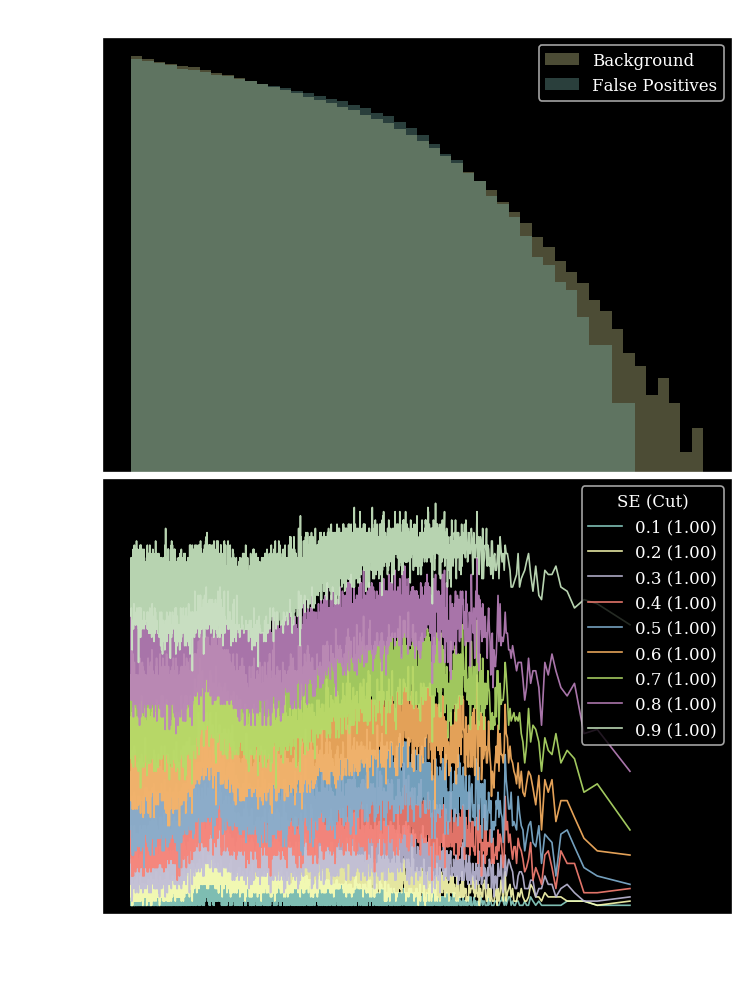

strength 500
Entering Training...
Epoch:0001/0200  (8.0  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (191.7s)
 Train: loss:0.6978, acc:30% || Val: loss: 0.1951, acc:80%, R50: 3.9452, 1/JSD: 177.6439
Epoch:0200/0200  (375.3s)
 Train: loss:0.6953, acc:30% || Val: loss: 0.1951, acc:80%, R50: 4.3274, 1/JSD: 252.4518


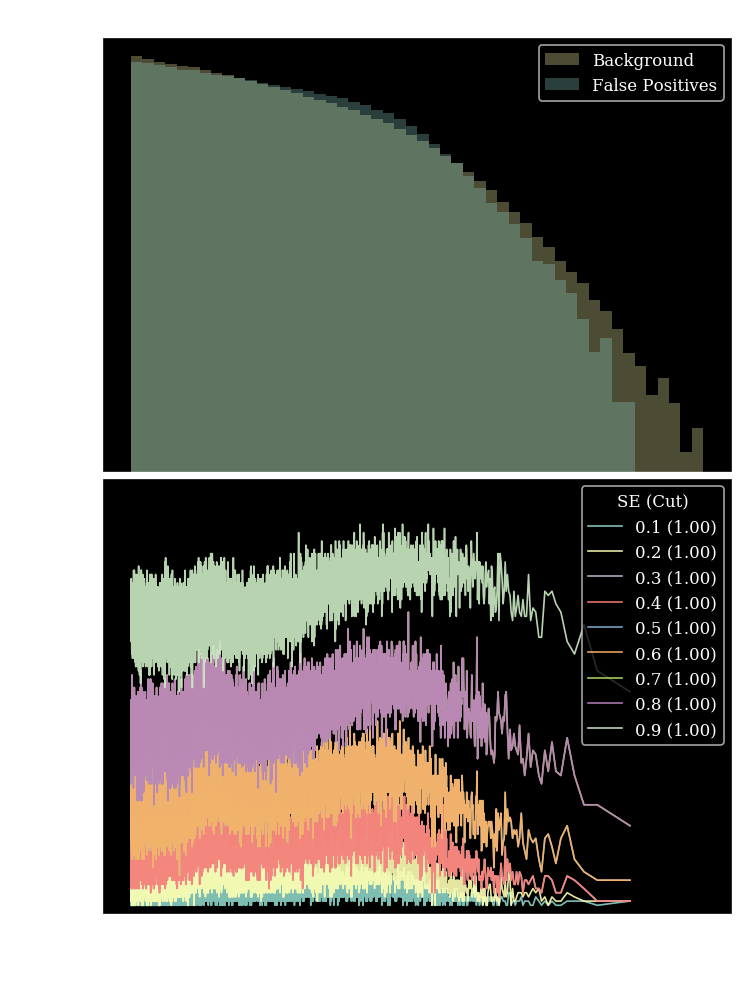

strength 600
Entering Training...
Epoch:0001/0200  (8.1  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (190.6s)
 Train: loss:0.6978, acc:30% || Val: loss: 0.1951, acc:80%, R50: 83.3754, 1/JSD: 3.7421
Epoch:0200/0200  (359.2s)
 Train: loss:0.6953, acc:30% || Val: loss: 0.1951, acc:80%, R50: 86.7736, 1/JSD: 3.6880


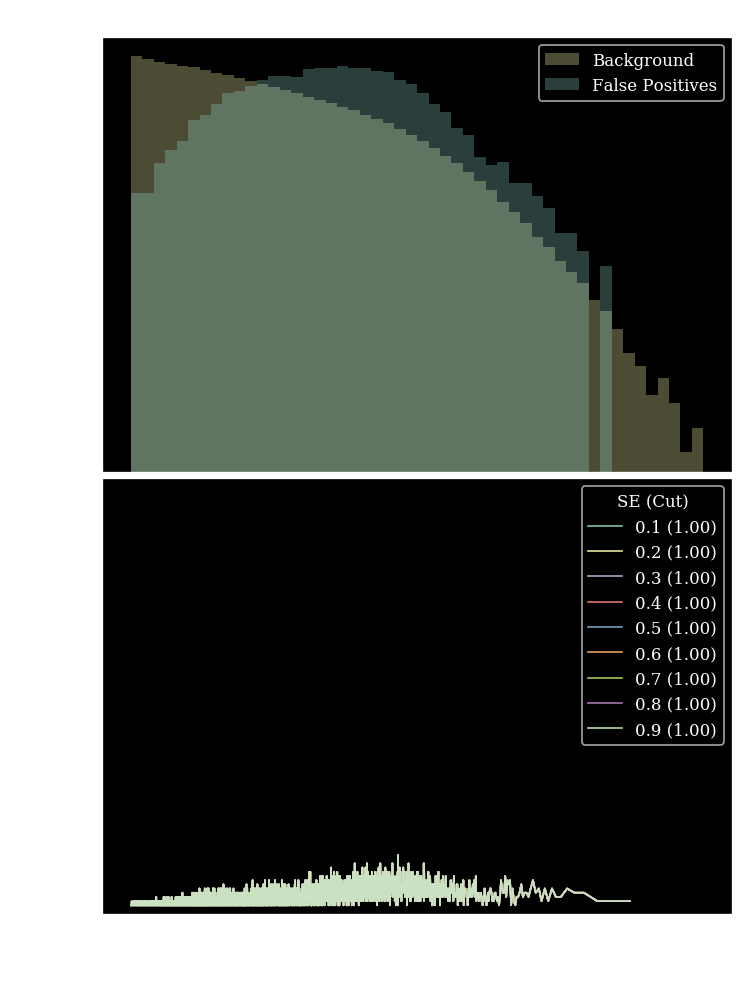

strength 1000
Entering Training...
Epoch:0001/0200  (8.2  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (137.6s)
 Train: loss:0.6978, acc:30% || Val: loss: 0.1951, acc:80%, R50: inf, 1/JSD: nan


../utils.py:261: RuntimeWarning: divide by zero encountered in double_scalars
  R50 = 1/((preds[targets==1]<c).sum()/(targets==1).sum())
/home/kitouni/anaconda3/envs/root3.7/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


Epoch:0200/0200  (258.6s)
 Train: loss:0.6953, acc:30% || Val: loss: 0.1951, acc:80%, R50: inf, 1/JSD: nan


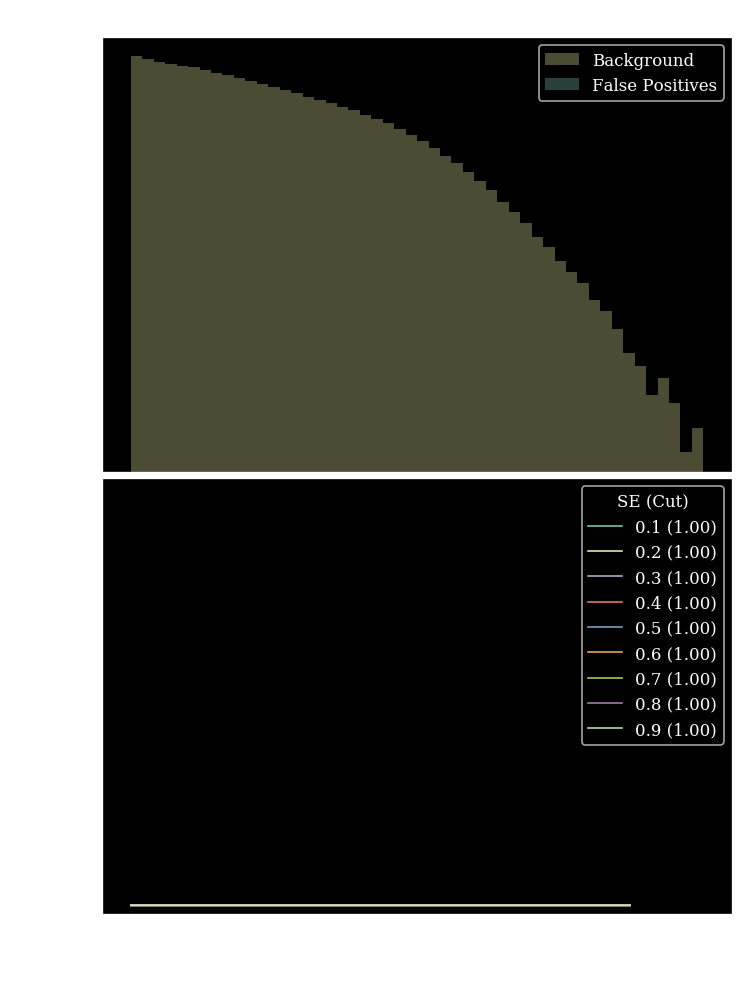

In [16]:
#as a function of bins
jsd_r50str2 = list()
for i,frac in enumerate([1e-1,1,10,20,32,64,128,135,140,246,300,500,600,1000]):
    print("strength",frac)
    metrics_train_L = Metrics()
    metrics_val_L = Metrics(validation=True)

    torch.manual_seed(777)
    model_L = Classifier().to(device)
    optimizer = torch.optim.SGD(model_L.parameters(),lr=1.5,momentum=0.)
    loss =  FlatLoss(labels=traindataset.labels,frac=frac,sbins=128,bins=135)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=200, gamma=0.9)
    log=Logger("./logs/logWFCNFlatLossBintest.txt",overwrite=False)
    model_L.fit(traindataset=traindataset,
                valdataset=valdataset,
                optimizer=optimizer,
                loss=loss,
                **params,
                log=log,
              #scheduler=scheduler,
              metrics=[metrics_train_L,metrics_val_L])
    model_L.train(False)
    out=plot_stuff(model=model_L,name=f"Flat DNN str:{frac}",X=X,y=test_labels,x_biased=test[:,0])
    jsd_r50str2.append(out)

strength 0.1
Entering Training...
Epoch:0001/0200  (8.1  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (195.5s)
 Train: loss:0.2691, acc:71% || Val: loss: 0.0748, acc:73%, R50: 8.9975, 1/JSD: 45.7806
Epoch:0200/0200  (362.7s)
 Train: loss:0.2481, acc:74% || Val: loss: 0.0690, acc:77%, R50: 11.4883, 1/JSD: 10.5292


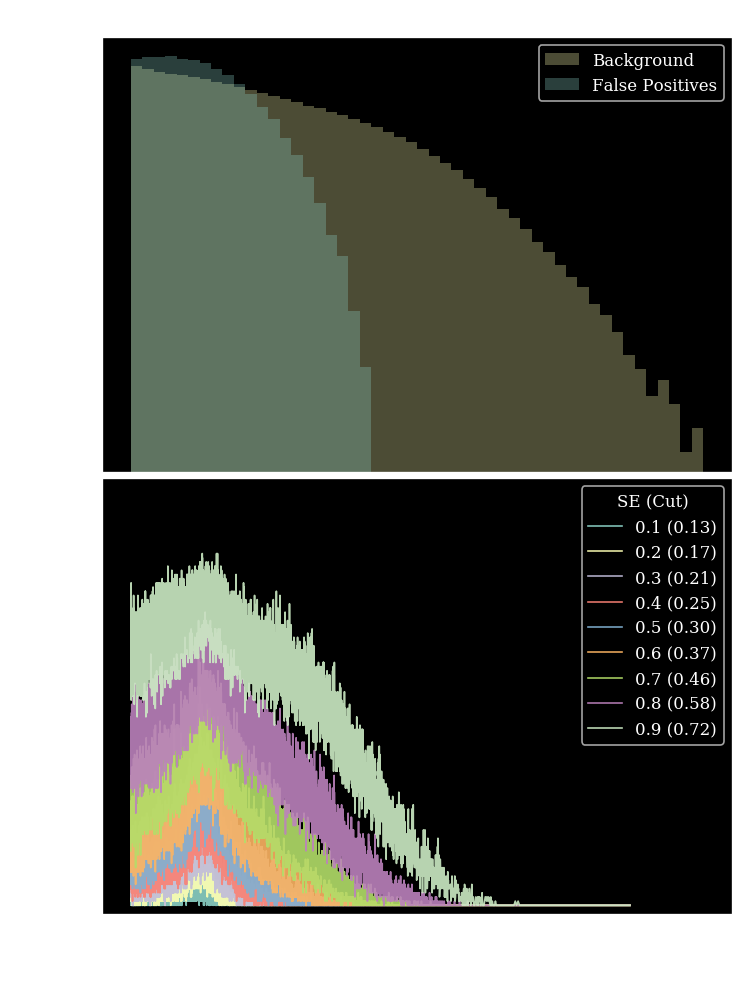

strength 1
Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (181.5s)
 Train: loss:0.2791, acc:70% || Val: loss: 0.0762, acc:72%, R50: 7.9199, 1/JSD: 143.5974
Epoch:0200/0200  (349.1s)
 Train: loss:0.2644, acc:72% || Val: loss: 0.0719, acc:76%, R50: 10.5364, 1/JSD: 20.2677


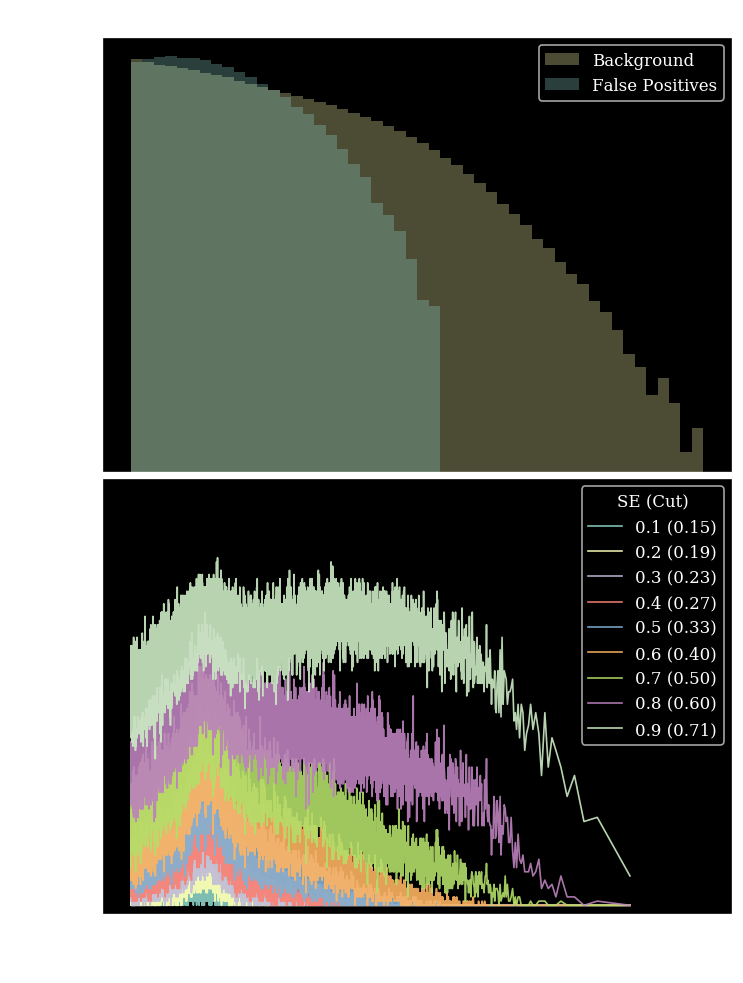

strength 10
Entering Training...
Epoch:0001/0200  (8.1  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (189.5s)
 Train: loss:0.3107, acc:69% || Val: loss: 0.0769, acc:73%, R50: 7.4081, 1/JSD: 412.2557
Epoch:0200/0200  (375.1s)
 Train: loss:0.3084, acc:72% || Val: loss: 0.0741, acc:76%, R50: 9.0847, 1/JSD: 130.4148


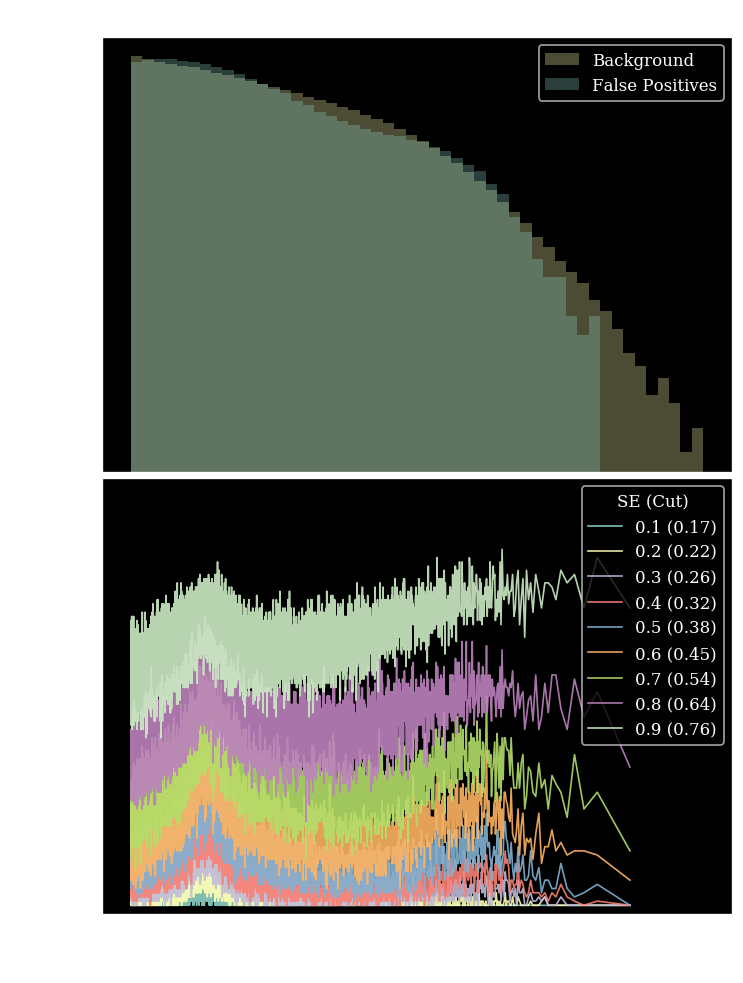

strength 20
Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (188.6s)
 Train: loss:0.3466, acc:67% || Val: loss: 0.0782, acc:75%, R50: 7.1319, 1/JSD: 677.4814
Epoch:0200/0200  (355.6s)
 Train: loss:0.3552, acc:70% || Val: loss: 0.0768, acc:77%, R50: 8.4145, 1/JSD: 378.1443


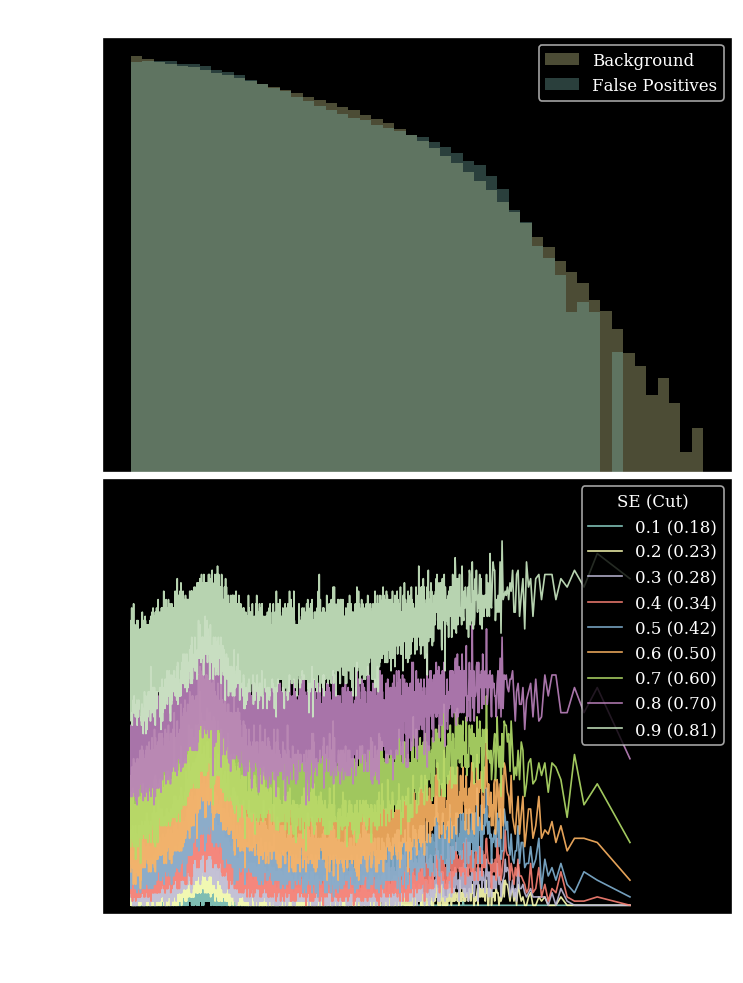

strength 30
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (187.0s)
 Train: loss:0.3787, acc:65% || Val: loss: 0.0803, acc:76%, R50: 6.8899, 1/JSD: 879.3715
Epoch:0200/0200  (364.7s)
 Train: loss:0.3889, acc:68% || Val: loss: 0.0790, acc:78%, R50: 8.0997, 1/JSD: 543.1349


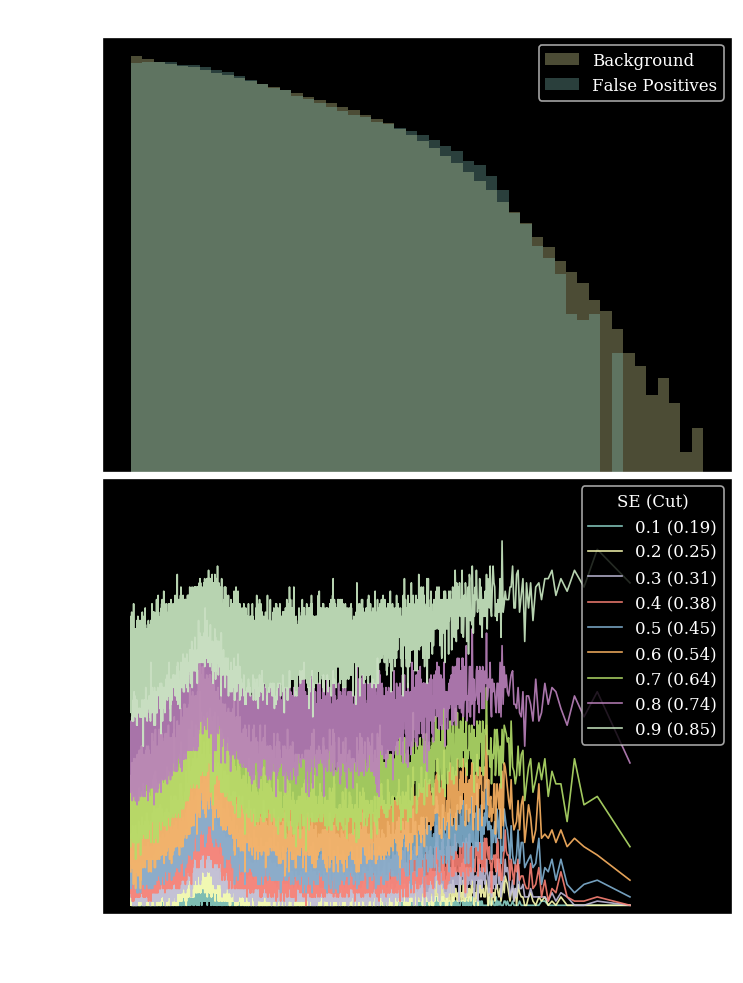

strength 50
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (173.6s)
 Train: loss:0.4382, acc:59% || Val: loss: 0.0865, acc:79%, R50: 6.5845, 1/JSD: 968.6078
Epoch:0200/0200  (349.2s)
 Train: loss:0.4388, acc:62% || Val: loss: 0.0849, acc:80%, R50: 7.7981, 1/JSD: 580.3798


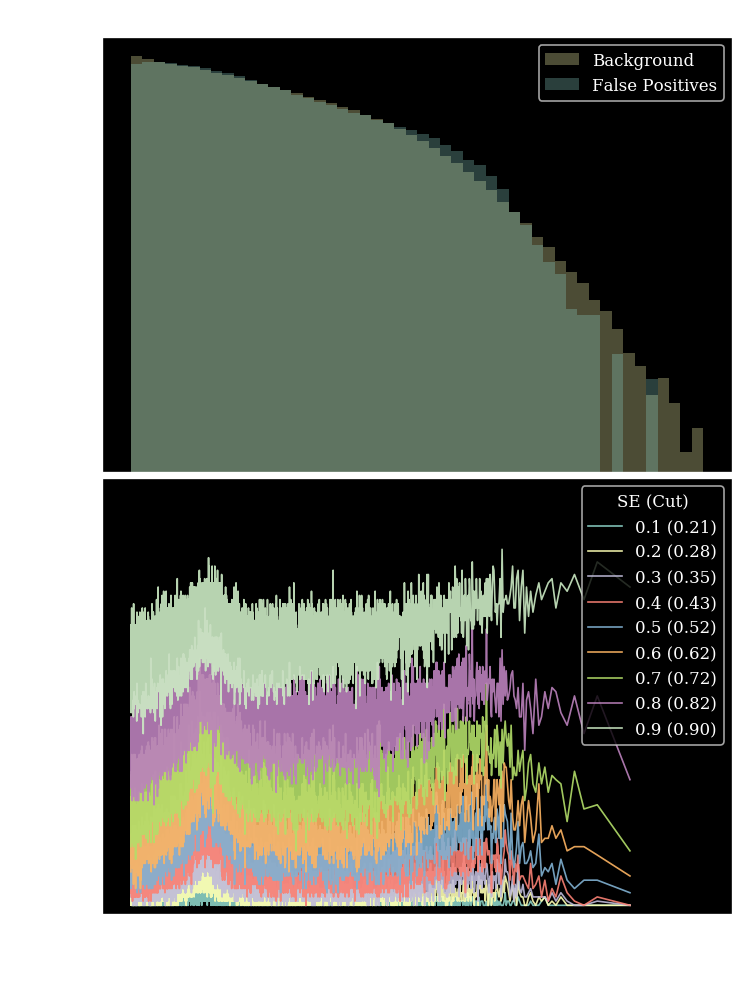

strength 80
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (187.5s)
 Train: loss:0.5118, acc:50% || Val: loss: 0.1017, acc:81%, R50: 6.6120, 1/JSD: 1151.8203
Epoch:0200/0200  (367.8s)
 Train: loss:0.4890, acc:56% || Val: loss: 0.0976, acc:82%, R50: 7.7387, 1/JSD: 618.1929


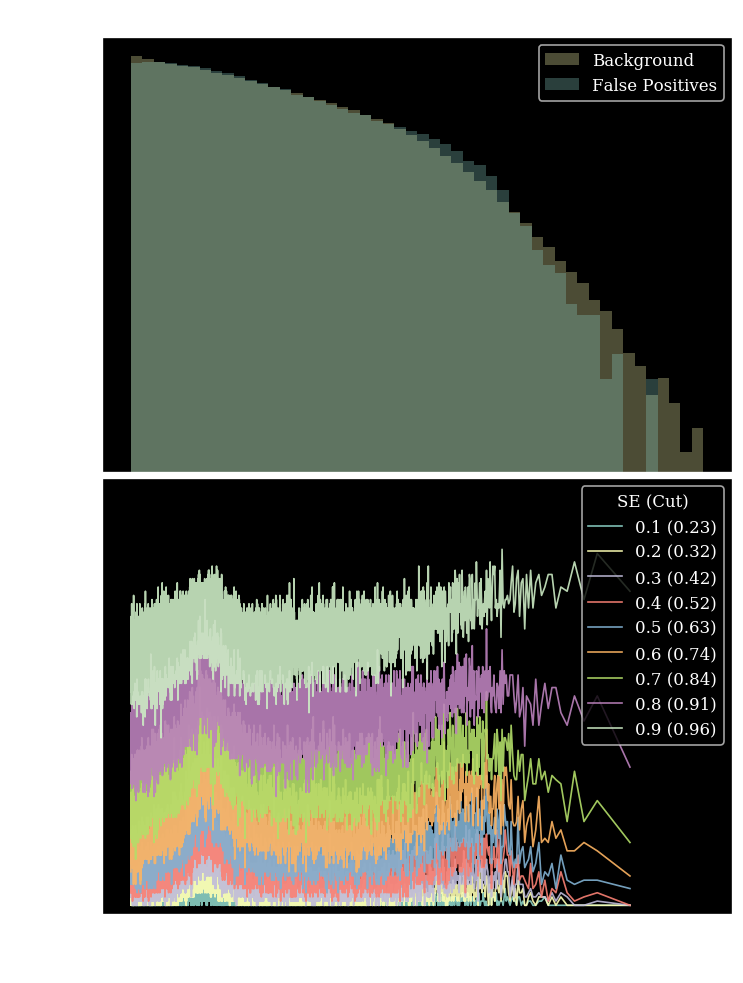

strength 100
Entering Training...
Epoch:0001/0200  (8.0  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (181.1s)
 Train: loss:0.5510, acc:44% || Val: loss: 0.1155, acc:82%, R50: 6.4560, 1/JSD: 1268.6724
Epoch:0200/0200  (348.2s)
 Train: loss:0.5161, acc:52% || Val: loss: 0.1071, acc:82%, R50: 7.7002, 1/JSD: 677.9871


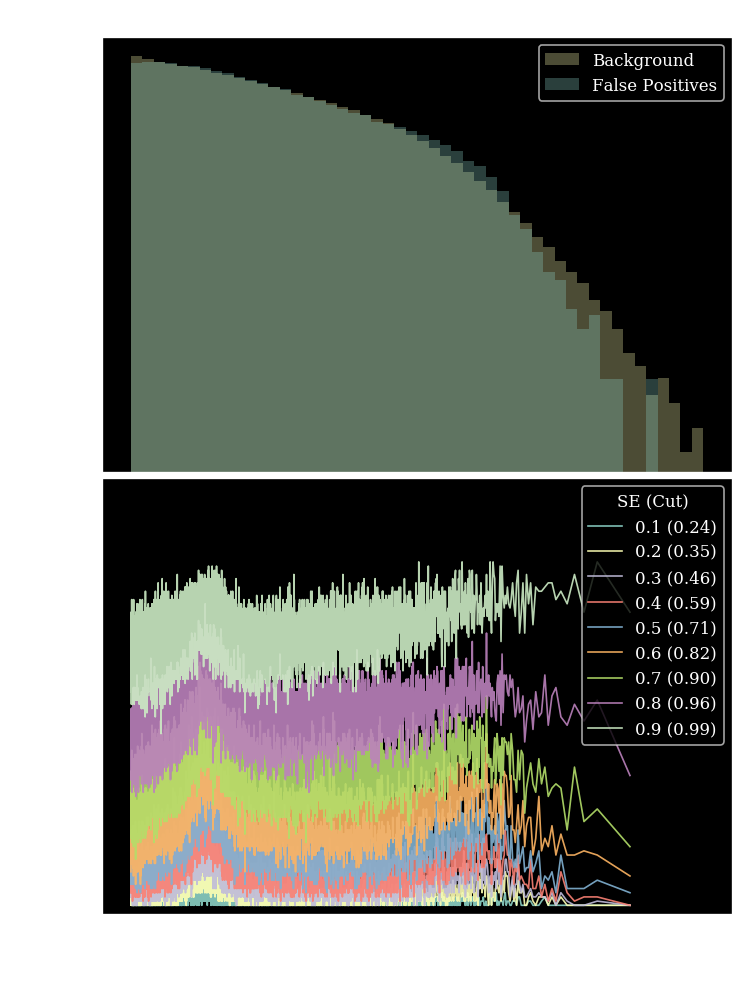

strength 110
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (189.9s)
 Train: loss:0.5677, acc:41% || Val: loss: 0.1227, acc:82%, R50: 6.3231, 1/JSD: 1173.2535
Epoch:0200/0200  (374.3s)
 Train: loss:0.5281, acc:51% || Val: loss: 0.1116, acc:82%, R50: 7.6623, 1/JSD: 686.9029


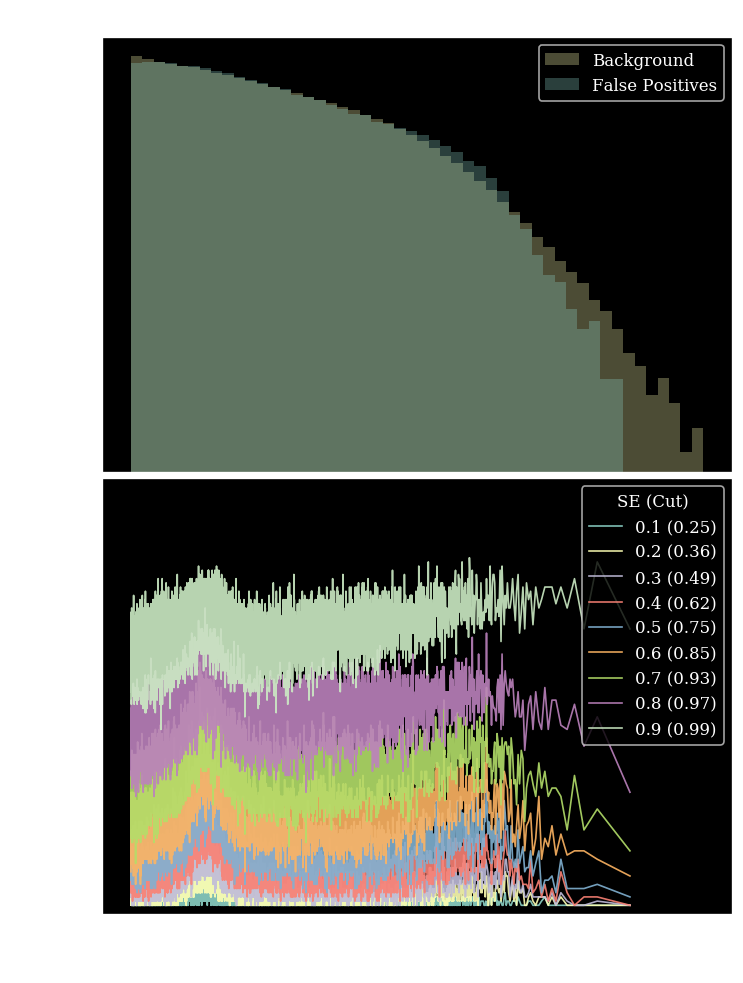

strength 115
Entering Training...
Epoch:0001/0200  (8.1  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (175.0s)
 Train: loss:0.5792, acc:40% || Val: loss: 0.1264, acc:82%, R50: 6.2196, 1/JSD: 1174.7801
Epoch:0200/0200  (357.7s)
 Train: loss:0.5341, acc:50% || Val: loss: 0.1138, acc:82%, R50: 7.6461, 1/JSD: 687.3995


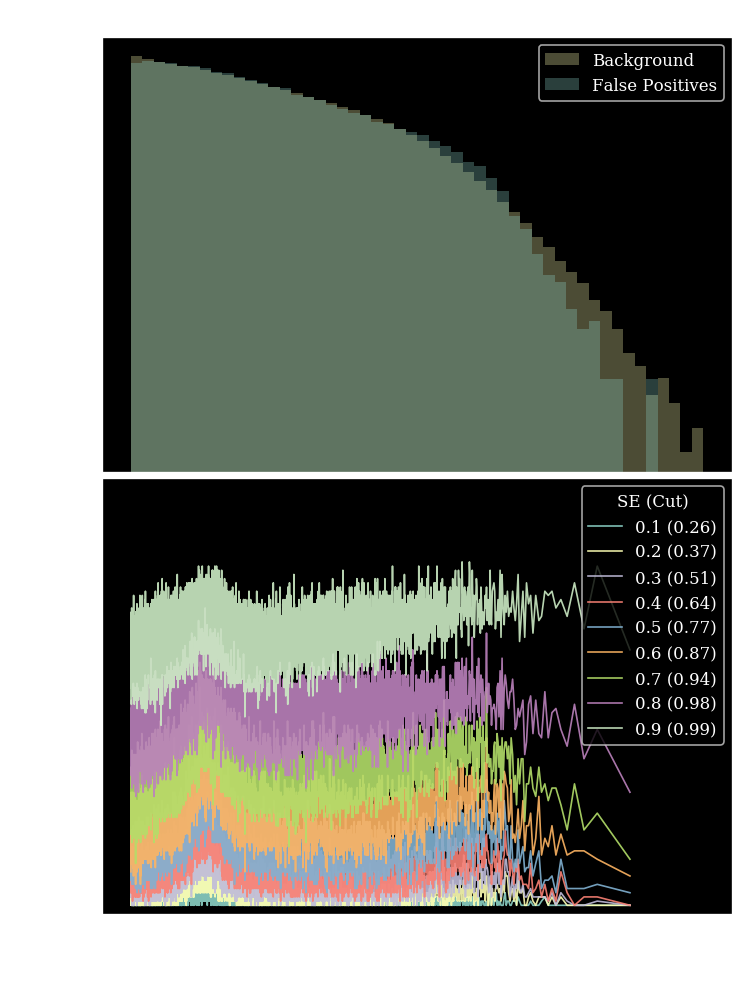

strength 120
Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (182.1s)
 Train: loss:0.5877, acc:38% || Val: loss: 0.1302, acc:82%, R50: 6.0989, 1/JSD: 1146.1236
Epoch:0200/0200  (349.2s)
 Train: loss:0.5422, acc:50% || Val: loss: 0.1159, acc:83%, R50: 7.6028, 1/JSD: 684.6760


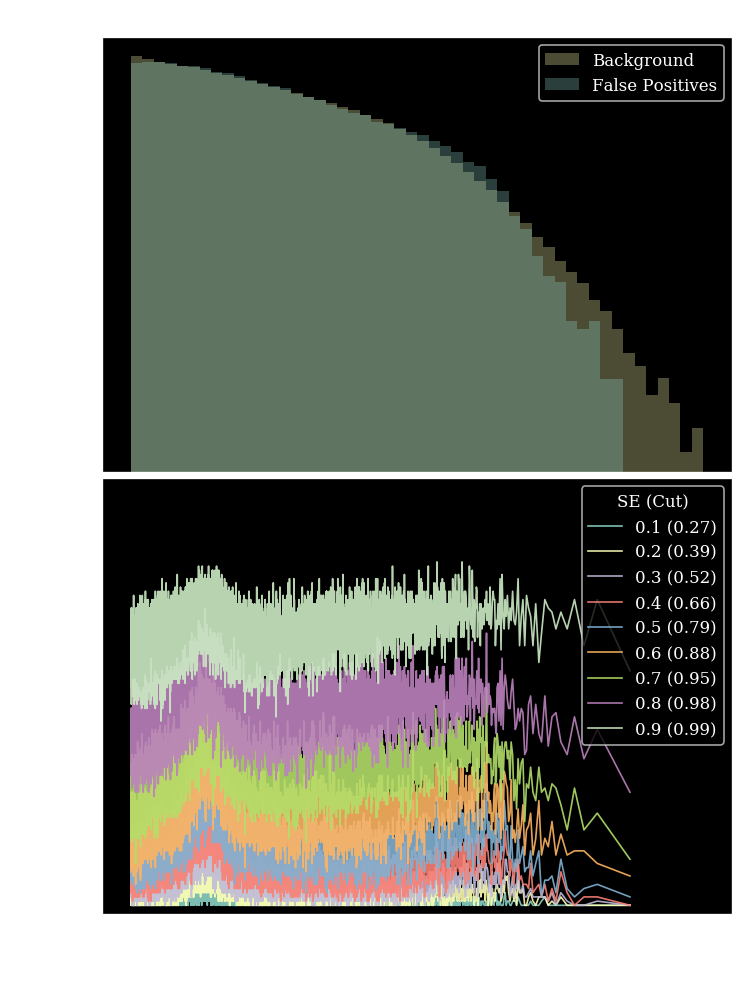

strength 125
Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (189.3s)
 Train: loss:0.5973, acc:35% || Val: loss: 0.1345, acc:81%, R50: 5.9139, 1/JSD: 1118.7066
Epoch:0200/0200  (376.1s)
 Train: loss:0.5492, acc:49% || Val: loss: 0.1180, acc:83%, R50: 7.5322, 1/JSD: 671.3645


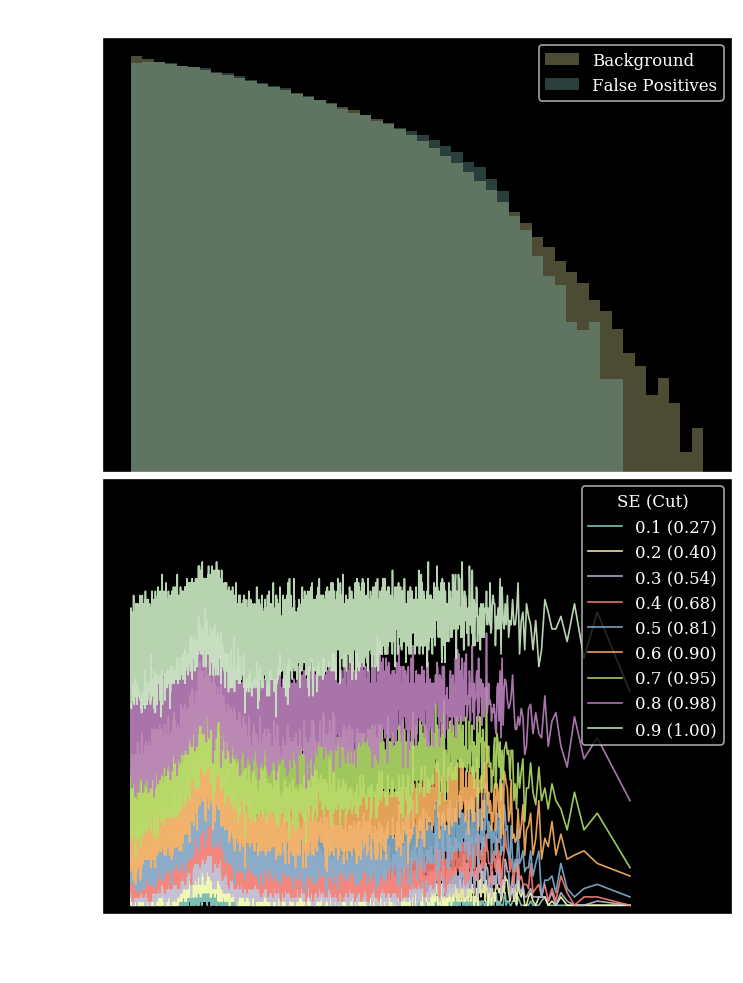

strength 128
Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (190.7s)
 Train: loss:0.6044, acc:31% || Val: loss: 0.1379, acc:81%, R50: 5.7898, 1/JSD: 1134.4981
Epoch:0200/0200  (358.5s)
 Train: loss:0.5541, acc:48% || Val: loss: 0.1192, acc:82%, R50: 7.4524, 1/JSD: 669.9367


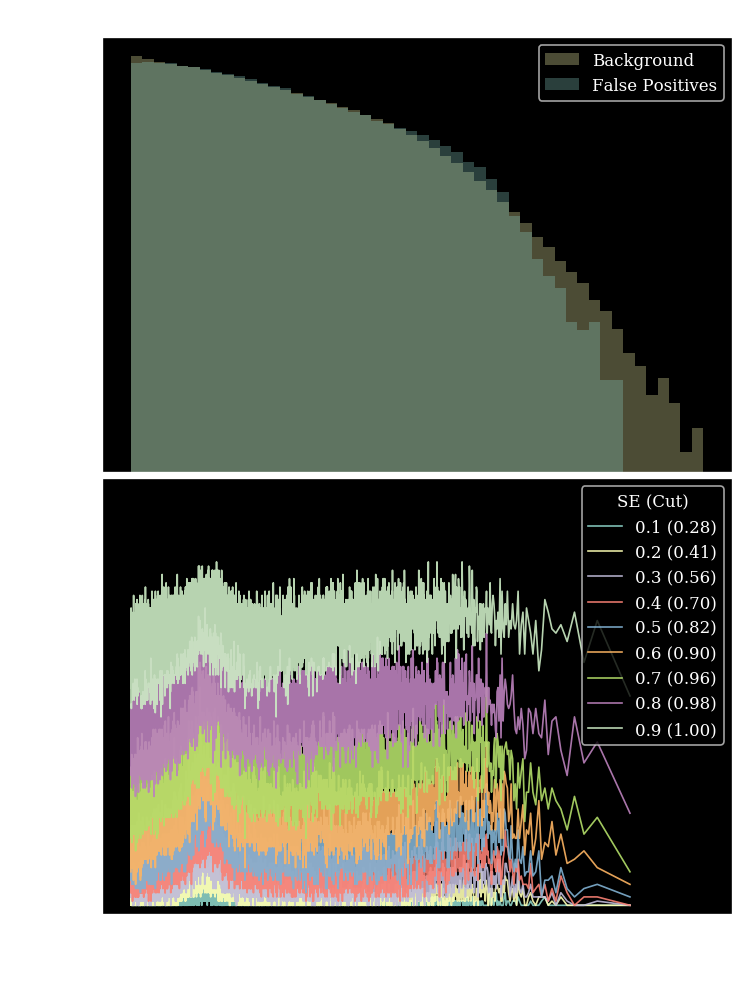

strength 130
Entering Training...
Epoch:0001/0200  (8.0  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (187.5s)
 Train: loss:0.6136, acc:30% || Val: loss: 0.1404, acc:80%, R50: 5.6964, 1/JSD: 1163.3876
Epoch:0200/0200  (366.9s)
 Train: loss:0.5574, acc:48% || Val: loss: 0.1201, acc:82%, R50: 7.4081, 1/JSD: 662.4009


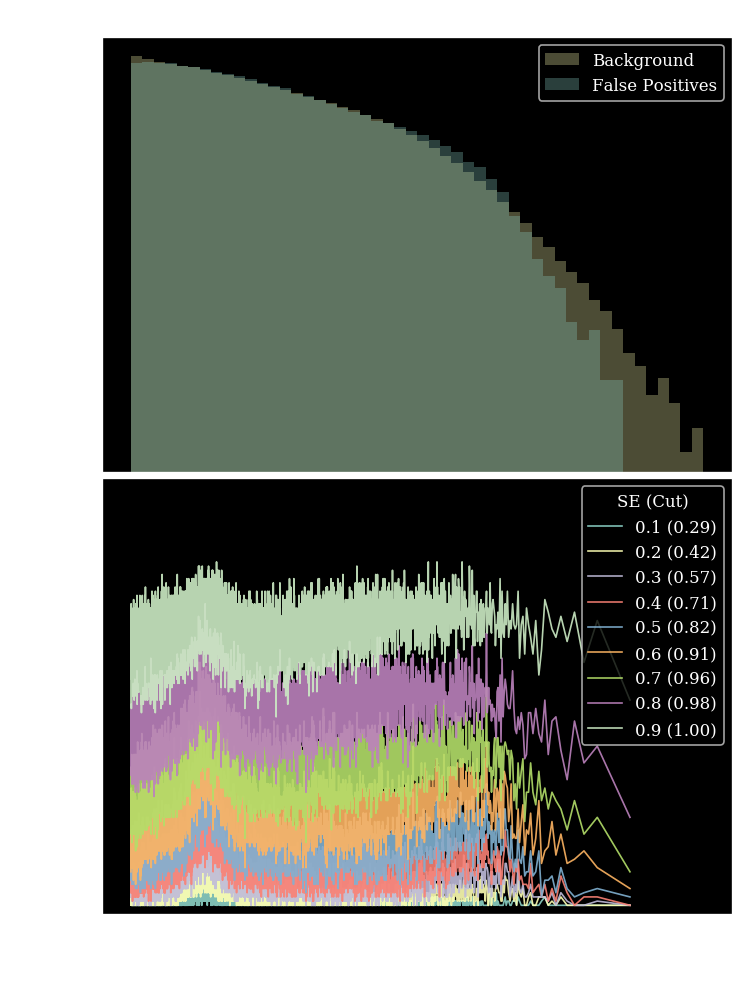

strength 135
Entering Training...
Epoch:0001/0200  (8.1  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (188.9s)
 Train: loss:0.6354, acc:30% || Val: loss: 0.1522, acc:80%, R50: 5.3989, 1/JSD: 1309.0398
Epoch:0200/0200  (369.2s)
 Train: loss:0.5682, acc:47% || Val: loss: 0.1229, acc:82%, R50: 7.2368, 1/JSD: 640.4144


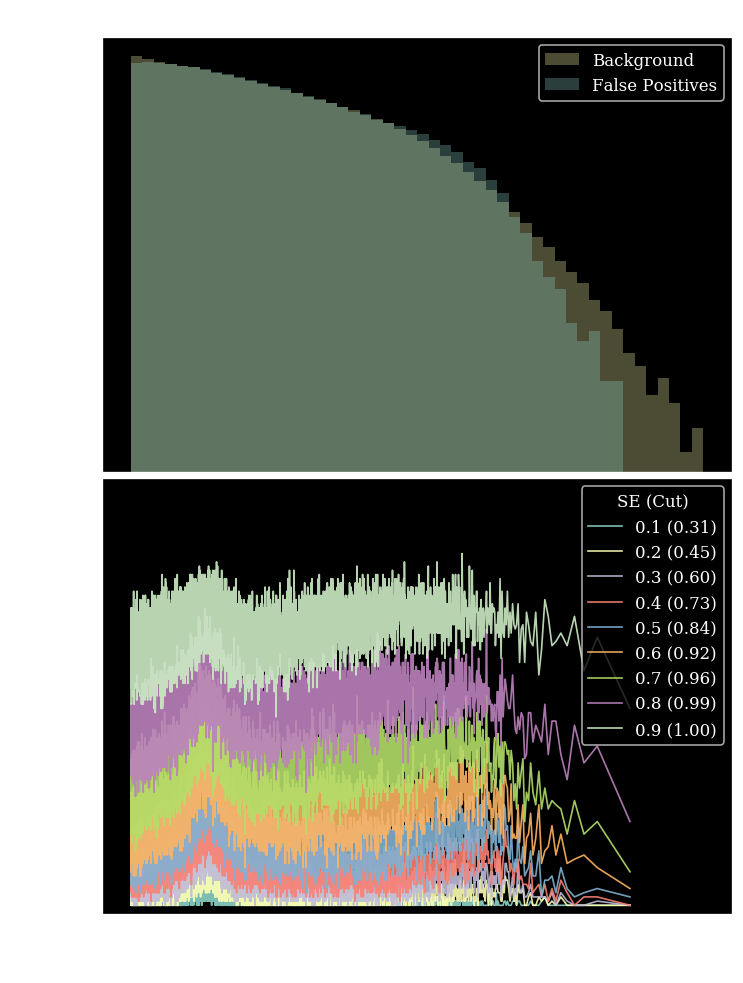

strength 140
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (181.5s)
 Train: loss:0.6733, acc:30% || Val: loss: 0.1767, acc:80%, R50: 5.1125, 1/JSD: 1073.0784
Epoch:0200/0200  (349.0s)
 Train: loss:0.5837, acc:45% || Val: loss: 0.1273, acc:82%, R50: 6.8540, 1/JSD: 645.5490


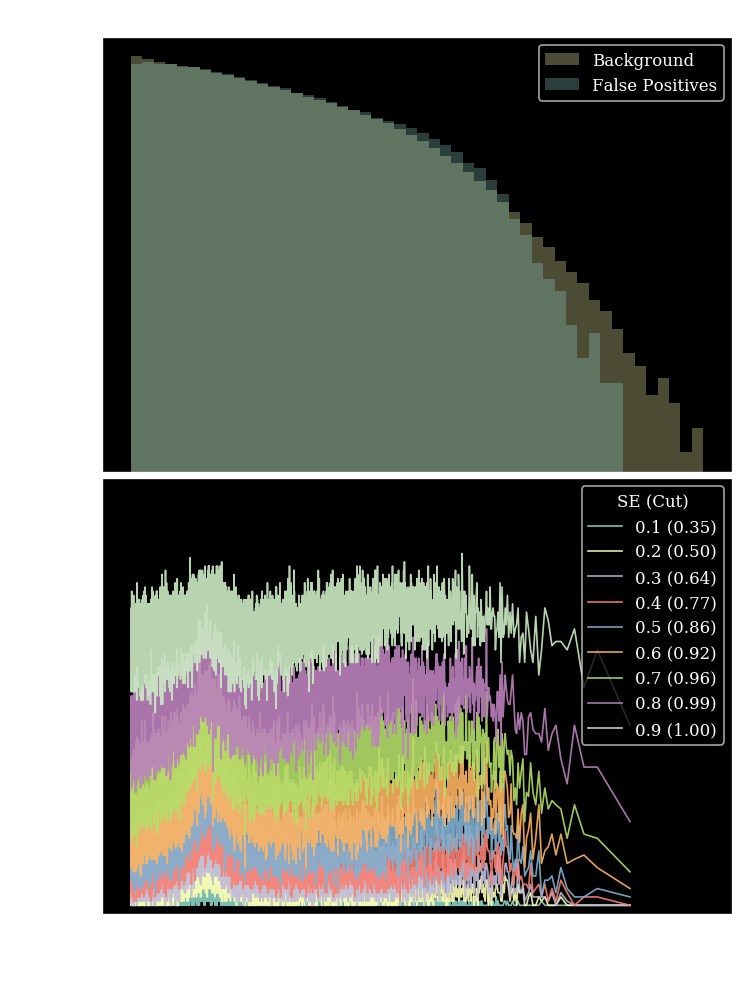

strength 200
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (180.9s)
 Train: loss:0.6968, acc:30% || Val: loss: 0.1949, acc:80%, R50: 3.8007, 1/JSD: 656.2703
Epoch:0200/0200  (348.5s)
 Train: loss:0.6948, acc:30% || Val: loss: 0.1950, acc:80%, R50: 3.9316, 1/JSD: 628.8141


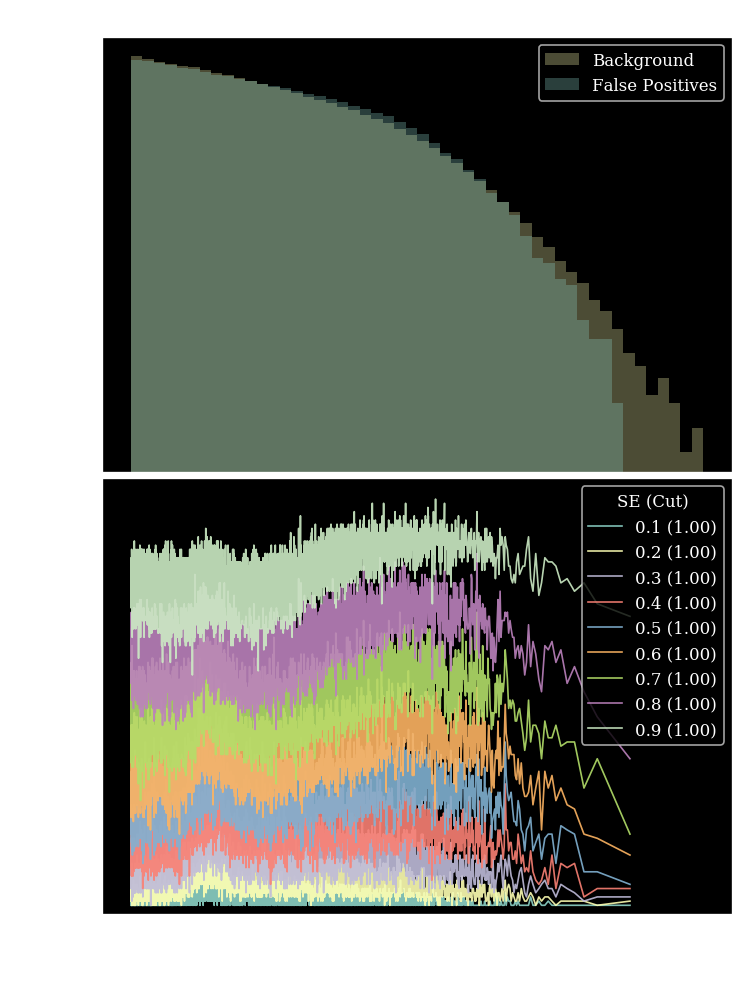

strength 300
Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (181.5s)
 Train: loss:0.6975, acc:30% || Val: loss: 0.1950, acc:80%, R50: 3.2332, 1/JSD: 637.0618
Epoch:0200/0200  (349.0s)
 Train: loss:0.6952, acc:30% || Val: loss: 0.1951, acc:80%, R50: 3.2983, 1/JSD: 629.2655


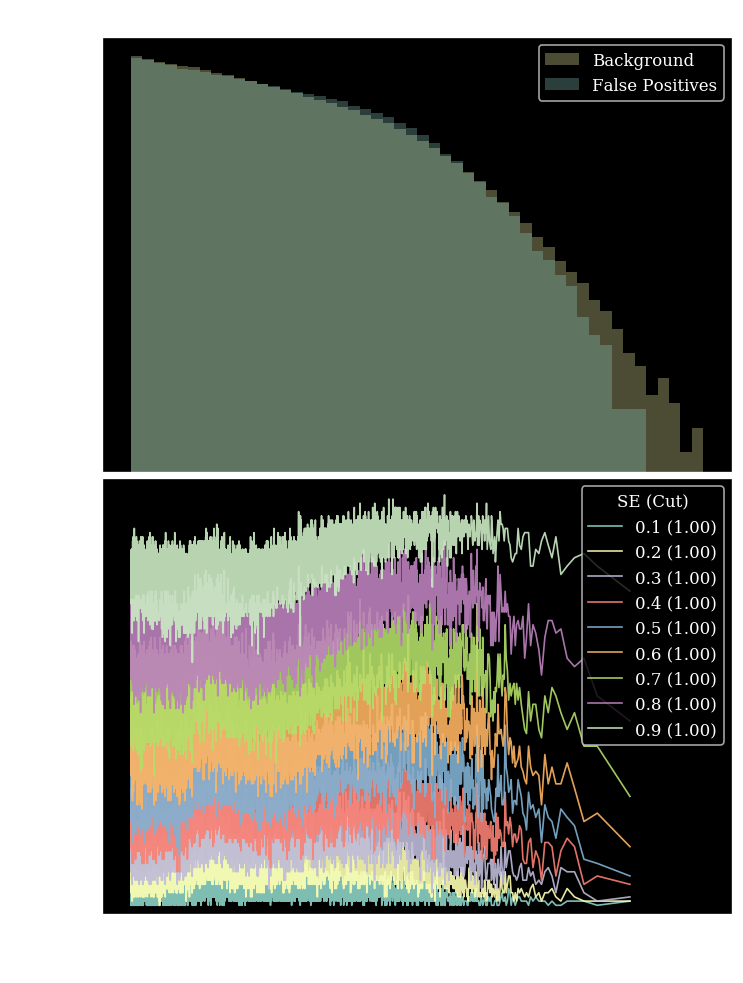

strength 1000
Entering Training...
Epoch:0001/0200  (8.0  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (181.8s)
 Train: loss:0.6978, acc:30% || Val: loss: 0.1951, acc:80%, R50: 2.8763, 1/JSD: 37.6071
Epoch:0200/0200  (348.9s)
 Train: loss:0.6953, acc:30% || Val: loss: 0.1951, acc:80%, R50: 2.8835, 1/JSD: 38.5297


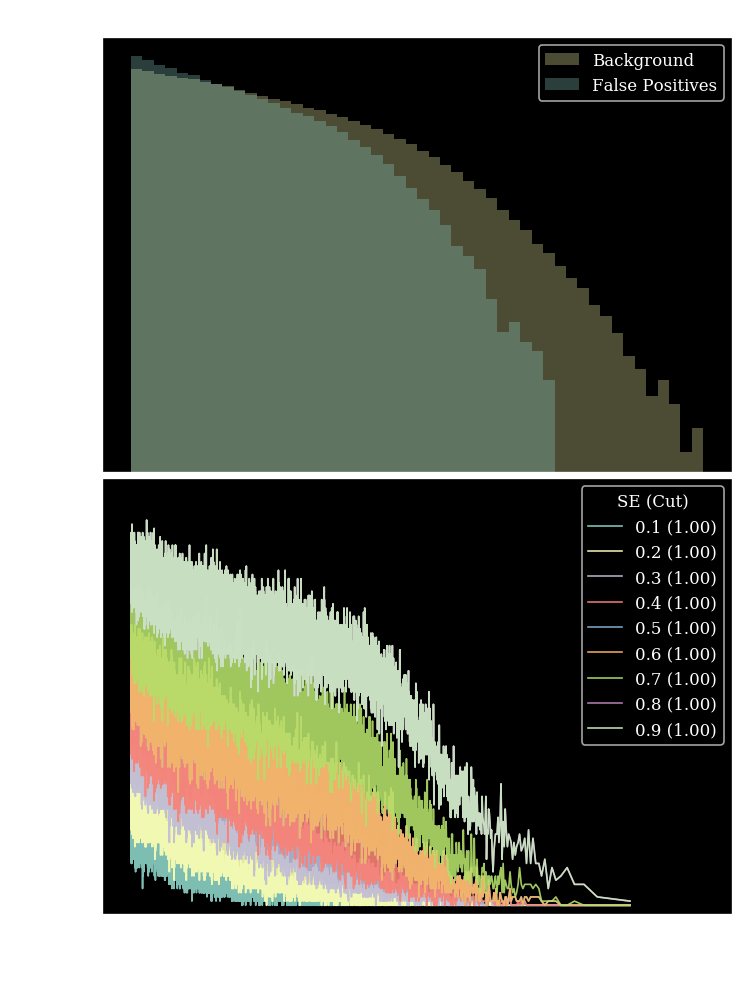

In [11]:
#as a function of bins
jsd_r50str = list()
for i,frac in enumerate([1e-1,1,10,20,30,50,80,100,110,115,120,125,128,130,135,140,200,300,1000]):
    print("strength",frac)
    metrics_train_L = Metrics()
    metrics_val_L = Metrics(validation=True)

    torch.manual_seed(777)
    model_L = Classifier().to(device)
    optimizer = torch.optim.SGD(model_L.parameters(),lr=8e-2,momentum=0.)
    loss =  FlatLoss(labels=traindataset.labels,frac=frac,sbins=128,bins=135)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=200, gamma=0.9)
    log=Logger("./logs/logWFCNFlatLossBintest.txt",overwrite=False)
    model_L.fit(traindataset=traindataset,
                valdataset=valdataset,
                optimizer=optimizer,
                loss=loss,
                **params,
                log=log,
              #scheduler=scheduler,
              metrics=[metrics_train_L,metrics_val_L])
    model_L.train(False)
    out=plot_stuff(model=model_L,name=f"Flat DNN str:{frac}",X=X,y=test_labels,x_biased=test[:,0])
    jsd_r50str.append(out)

# As a function of bins

In [ ]:
#as a function of bins
jsd_r50bins = list()
for i,bins in enumerate([10,20,30,50,80,100,110,115,120,125,128,130,135,140,150,200,300,400,500,600]): #add more
    frac = 75
    print("strength",frac)
    metrics_train_L = Metrics()
    metrics_val_L = Metrics(validation=True)

    torch.manual_seed(777)
    model_L = Classifier().to(device)
    optimizer = torch.optim.SGD(model_L.parameters(),lr=8e-2,momentum=0.)
    loss =  FlatLoss(labels=traindataset.labels,frac=frac,sbins=128,bins=bins)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=200, gamma=0.9)
    log=Logger("./logs/logWFCNFlatLossBintest.txt",overwrite=False)
    model_L.fit(traindataset=traindataset,
                valdataset=valdataset,
                optimizer=optimizer,
                loss=loss,
                **params,
                log=log,
              #scheduler=scheduler,
              metrics=[metrics_train_L,metrics_val_L])
    model_L.train(False)
    out=plot_stuff(model=model_L,name=f"Flat DNN str:{frac}",X=X,y=test_labels,x_biased=test[:,0])

    del model_L
    torch.cuda.empty_cache()
    jsd_r50bins.append(out)

# As a function of str

strength 101
Entering Training...
Epoch:0001/0400  (9.2  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (196.7s)
 Train: loss:0.6940, acc:30% || Val: loss: 0.1888, acc:80%, R50: 5.1517, 1/JSD: 763.6421
Epoch:0200/0400  (378.5s)
 Train: loss:0.6885, acc:30% || Val: loss: 0.1686, acc:80%, R50: 5.6779, 1/JSD: 576.4671
Epoch:0300/0400  (574.7s)
 Train: loss:0.6258, acc:36% || Val: loss: 0.1462, acc:82%, R50: 7.2772, 1/JSD: 512.9268
Epoch:0400/0400  (753.5s)
 Train: loss:0.5959, acc:43% || Val: loss: 0.1416, acc:83%, R50: 7.8605, 1/JSD: 370.2471


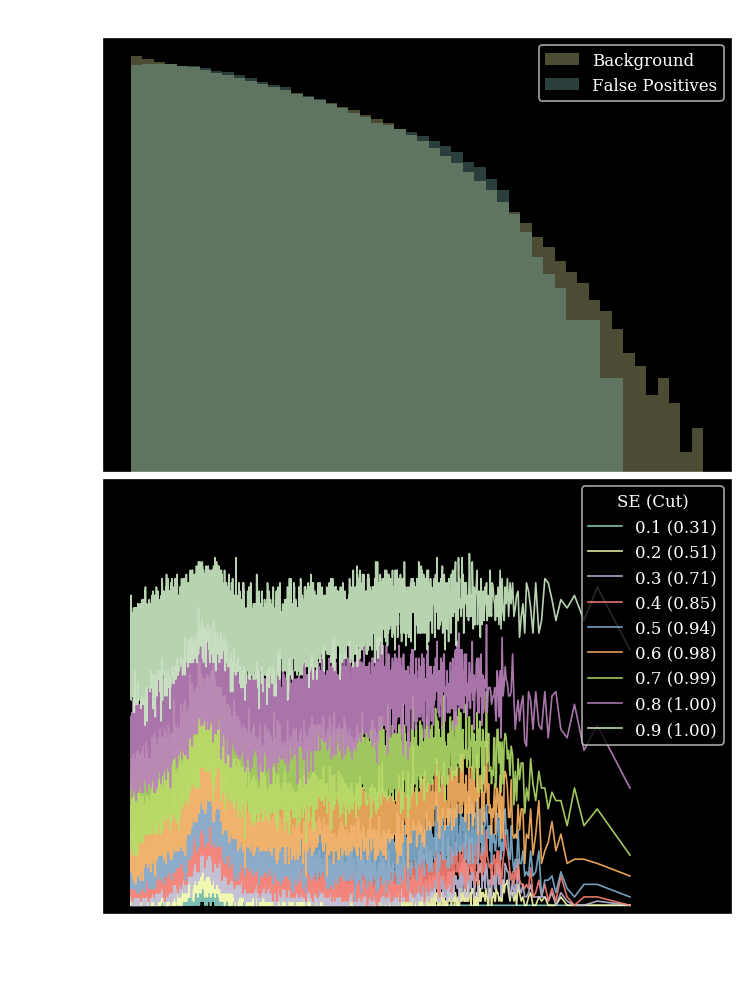

strength 110
Entering Training...
Epoch:0001/0400  (9.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (199.9s)
 Train: loss:0.6980, acc:30% || Val: loss: 0.1935, acc:80%, R50: 4.7590, 1/JSD: 838.5263
Epoch:0200/0400  (409.2s)
 Train: loss:0.6926, acc:30% || Val: loss: 0.1941, acc:80%, R50: 4.9902, 1/JSD: 726.8240
Epoch:0300/0400  (590.8s)
 Train: loss:0.6945, acc:30% || Val: loss: 0.1941, acc:80%, R50: 5.1253, 1/JSD: 642.4240
Epoch:0400/0400  (782.0s)
 Train: loss:0.6939, acc:30% || Val: loss: 0.1940, acc:80%, R50: 5.2329, 1/JSD: 648.4592


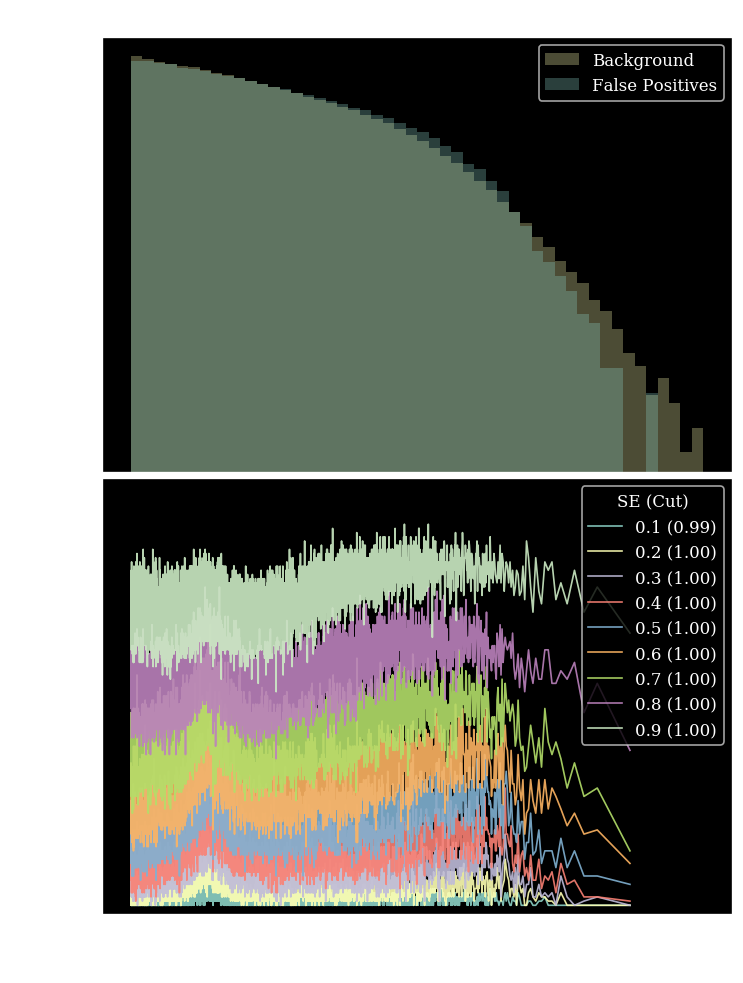

strength 120
Entering Training...
Epoch:0001/0400  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (221.8s)
 Train: loss:0.6953, acc:30% || Val: loss: 0.1944, acc:80%, R50: 4.4426, 1/JSD: 825.5282
Epoch:0200/0400  (413.0s)
 Train: loss:0.6941, acc:30% || Val: loss: 0.1948, acc:80%, R50: 4.6029, 1/JSD: 743.2238
Epoch:0300/0400  (610.7s)
 Train: loss:0.6965, acc:30% || Val: loss: 0.1949, acc:80%, R50: 4.6849, 1/JSD: 744.6625
Epoch:0400/0400  (874.8s)
 Train: loss:0.6958, acc:30% || Val: loss: 0.1950, acc:80%, R50: 4.7521, 1/JSD: 728.0389


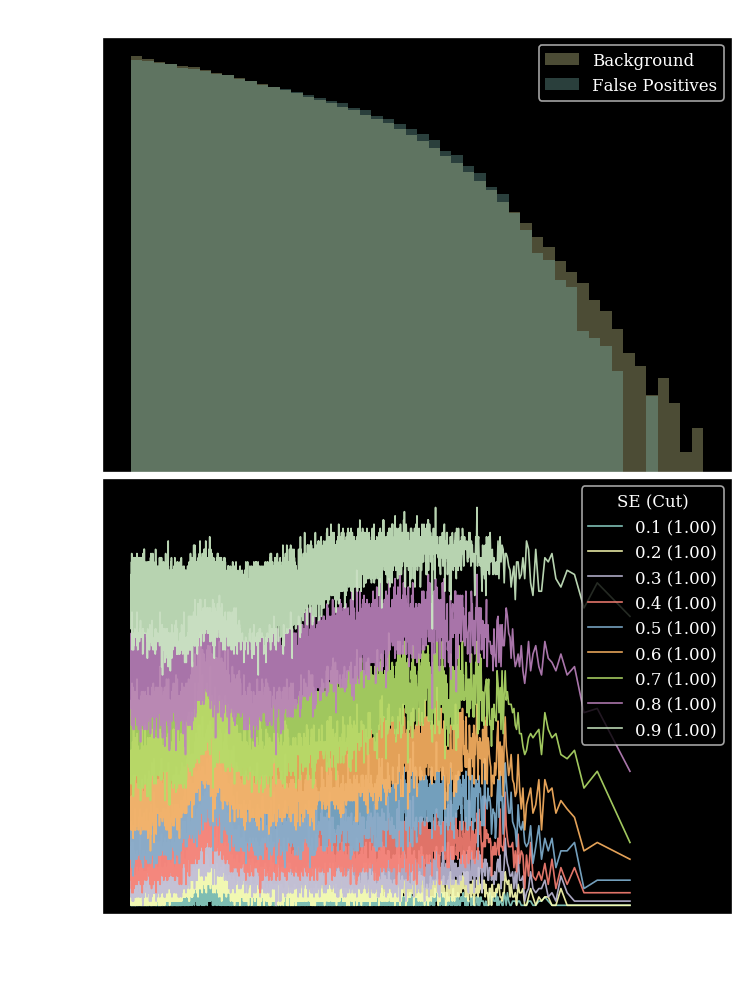

In [27]:
for i,frac in enumerate([101,110,120]):
    print("strength",frac)
    torch.manual_seed(777)
    model_L = Classifier().to(device)
    optimizer = torch.optim.SGD(model_L.parameters(),lr=8e-2,momentum=0.)
    loss =  FlatLoss(labels=traindataset.labels,frac=frac,sbins=135,bins=300)
    log=Logger("./logs/logWFCNflatLoss(135bins).txt")
    model_L.fit(traindataset=traindataset,
                valdataset=valdataset,
                optimizer=optimizer,
                loss=loss,
                **params,
                log=log,)
    out=plot_stuff(model=model_L,name=f"Flat DNN str:{frac}",X=X,y=test_labels,x_biased=test[:,0])
    #jsd_r50.append(out)

In [29]:
jsd_r50Disco

[(7.044400654176942, 17.077714691270405),
 (7.345588781336469, 16.162209814869232),
 (39.65022060408894, 10.378057820607857),
 (377.4909269506062, 8.444927011702257),
 (981.5628056431593, 8.215173532204547),
 (1162.20110599138, 8.208692685734997),
 (1069.143164124408, 8.00931993592544),
 (840.8202267332115, 7.515714676141022),
 (47.11794239508234, 964.9122807017545),
 (nan, inf)]

strength 0.1
Entering Training...
Epoch:0001/0400  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (176.7s)
 Train: loss:0.2698, acc:71% || Val: loss: 0.0749, acc:73%, R50: 8.9555, 1/JSD: 49.3788
Epoch:0200/0400  (358.4s)
 Train: loss:0.2484, acc:74% || Val: loss: 0.0691, acc:77%, R50: 11.4831, 1/JSD: 10.4333
Epoch:0300/0400  (523.9s)
 Train: loss:0.2311, acc:76% || Val: loss: 0.0646, acc:79%, R50: 13.2914, 1/JSD: 8.5604
Epoch:0400/0400  (703.8s)
 Train: loss:0.2213, acc:77% || Val: loss: 0.0611, acc:80%, R50: 15.9590, 1/JSD: 6.8652


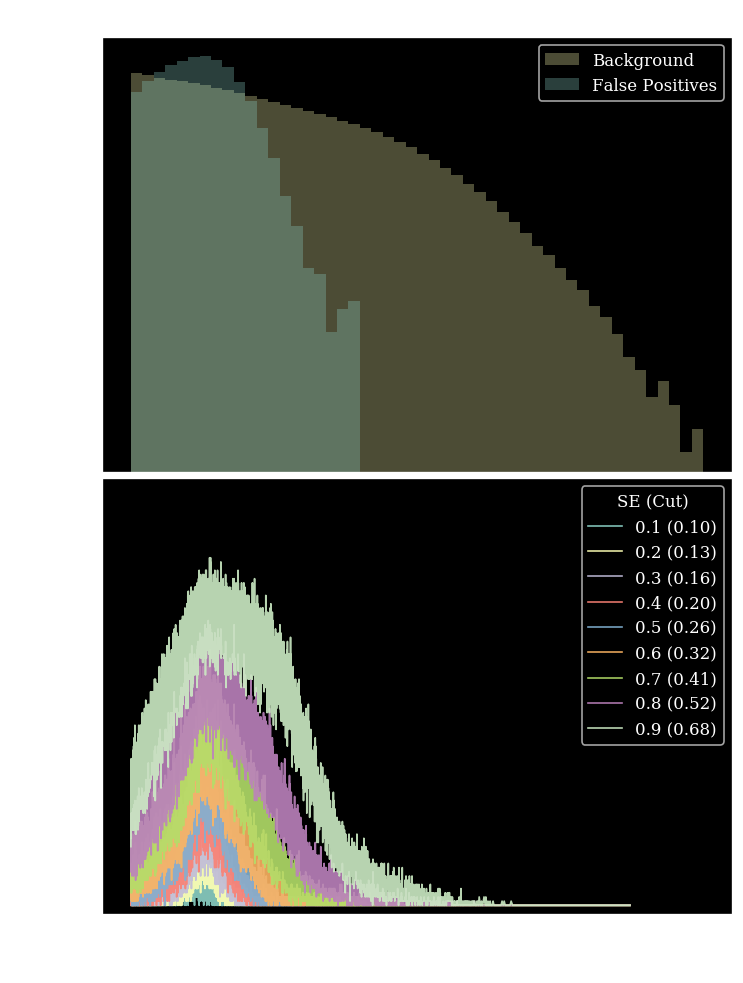

strength 1
Entering Training...
Epoch:0001/0400  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (172.4s)
 Train: loss:0.2825, acc:69% || Val: loss: 0.0765, acc:72%, R50: 7.7964, 1/JSD: 146.1955
Epoch:0200/0400  (345.9s)
 Train: loss:0.2668, acc:72% || Val: loss: 0.0720, acc:76%, R50: 10.5752, 1/JSD: 19.1225
Epoch:0300/0400  (515.2s)
 Train: loss:0.2477, acc:74% || Val: loss: 0.0678, acc:78%, R50: 12.5194, 1/JSD: 11.6357
Epoch:0400/0400  (695.6s)
 Train: loss:0.2365, acc:75% || Val: loss: 0.0642, acc:79%, R50: 14.2192, 1/JSD: 8.3603


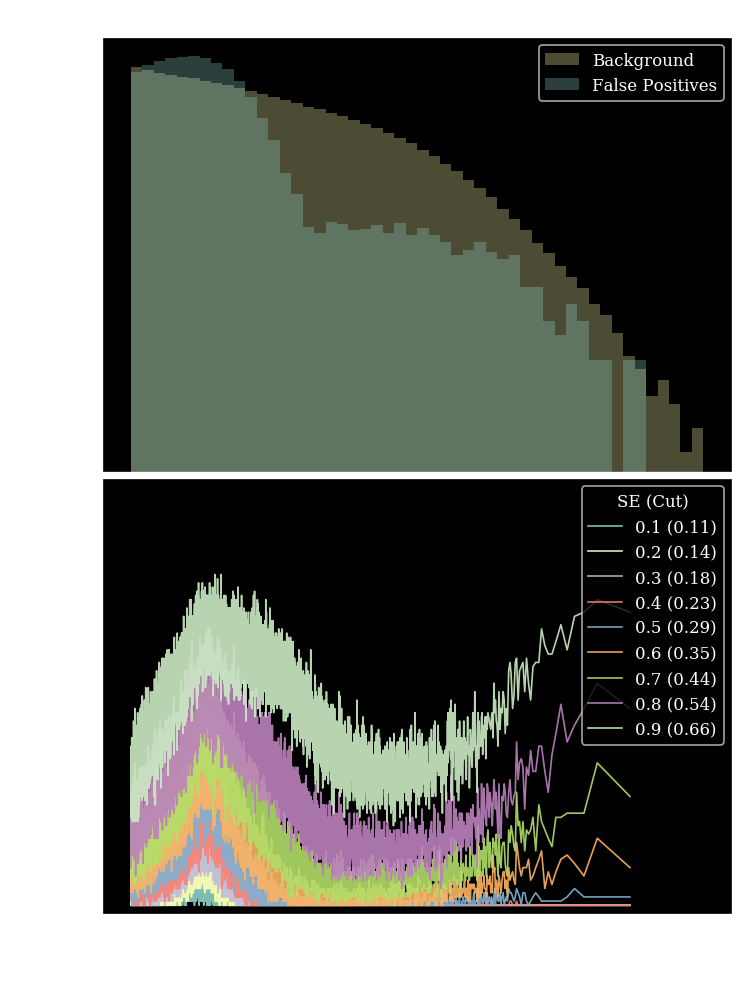

strength 5
Entering Training...
Epoch:0001/0400  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (171.7s)
 Train: loss:0.3072, acc:69% || Val: loss: 0.0771, acc:73%, R50: 7.4094, 1/JSD: 294.8826
Epoch:0200/0400  (345.3s)
 Train: loss:0.2948, acc:71% || Val: loss: 0.0733, acc:75%, R50: 9.6644, 1/JSD: 54.5911
Epoch:0300/0400  (515.7s)
 Train: loss:0.2736, acc:72% || Val: loss: 0.0691, acc:76%, R50: 11.5940, 1/JSD: 23.2017
Epoch:0400/0400  (696.7s)
 Train: loss:0.2662, acc:73% || Val: loss: 0.0670, acc:78%, R50: 12.7128, 1/JSD: 27.4575


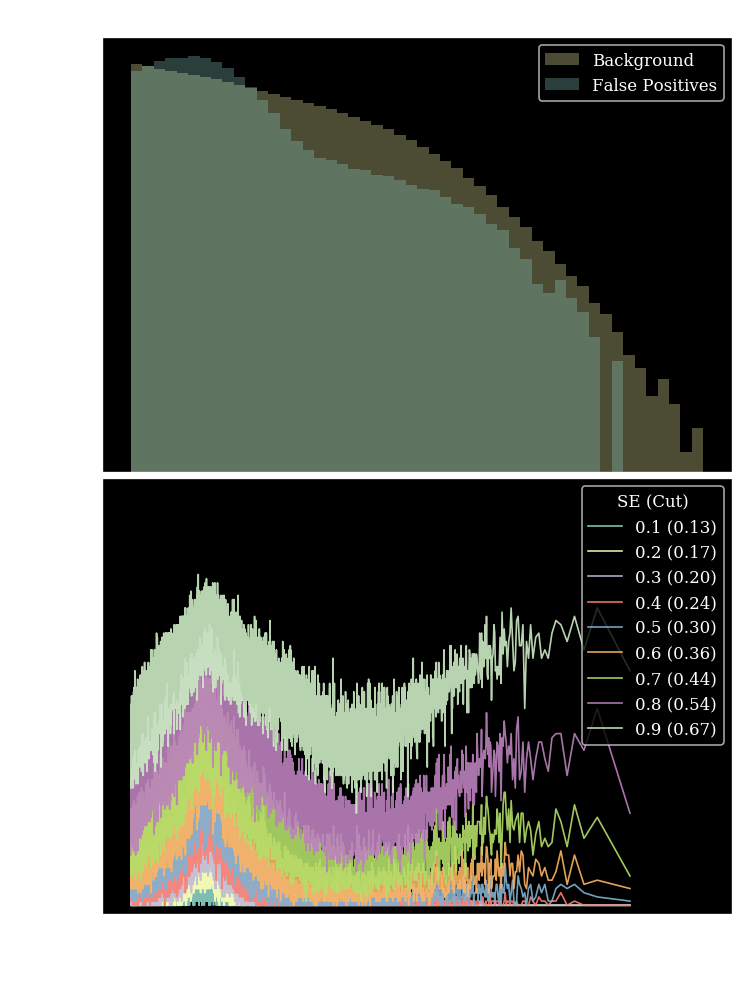

strength 10
Entering Training...
Epoch:0001/0400  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (171.5s)
 Train: loss:0.3349, acc:68% || Val: loss: 0.0778, acc:74%, R50: 7.2713, 1/JSD: 482.6119
Epoch:0200/0400  (344.5s)
 Train: loss:0.3295, acc:70% || Val: loss: 0.0746, acc:77%, R50: 9.1491, 1/JSD: 117.0553
Epoch:0300/0400  (515.9s)
 Train: loss:0.3026, acc:70% || Val: loss: 0.0703, acc:77%, R50: 10.7931, 1/JSD: 38.3696
Epoch:0400/0400  (696.9s)
 Train: loss:0.2965, acc:71% || Val: loss: 0.0695, acc:78%, R50: 11.2302, 1/JSD: 62.7250


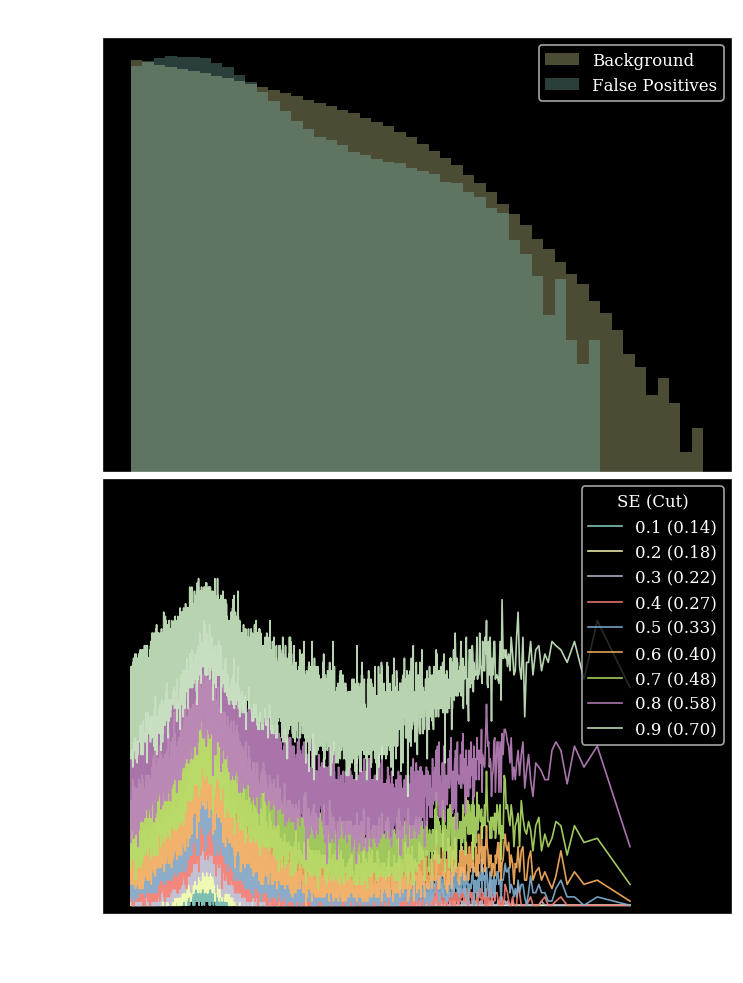

strength 12
Entering Training...
Epoch:0001/0400  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (172.5s)
 Train: loss:0.3459, acc:67% || Val: loss: 0.0782, acc:75%, R50: 7.2281, 1/JSD: 540.7595
Epoch:0200/0400  (345.9s)
 Train: loss:0.3431, acc:70% || Val: loss: 0.0752, acc:77%, R50: 8.9509, 1/JSD: 148.7988
Epoch:0300/0400  (516.8s)
 Train: loss:0.3141, acc:69% || Val: loss: 0.0710, acc:77%, R50: 10.5069, 1/JSD: 45.9819
Epoch:0400/0400  (696.8s)
 Train: loss:0.3080, acc:70% || Val: loss: 0.0705, acc:79%, R50: 10.8236, 1/JSD: 81.9119


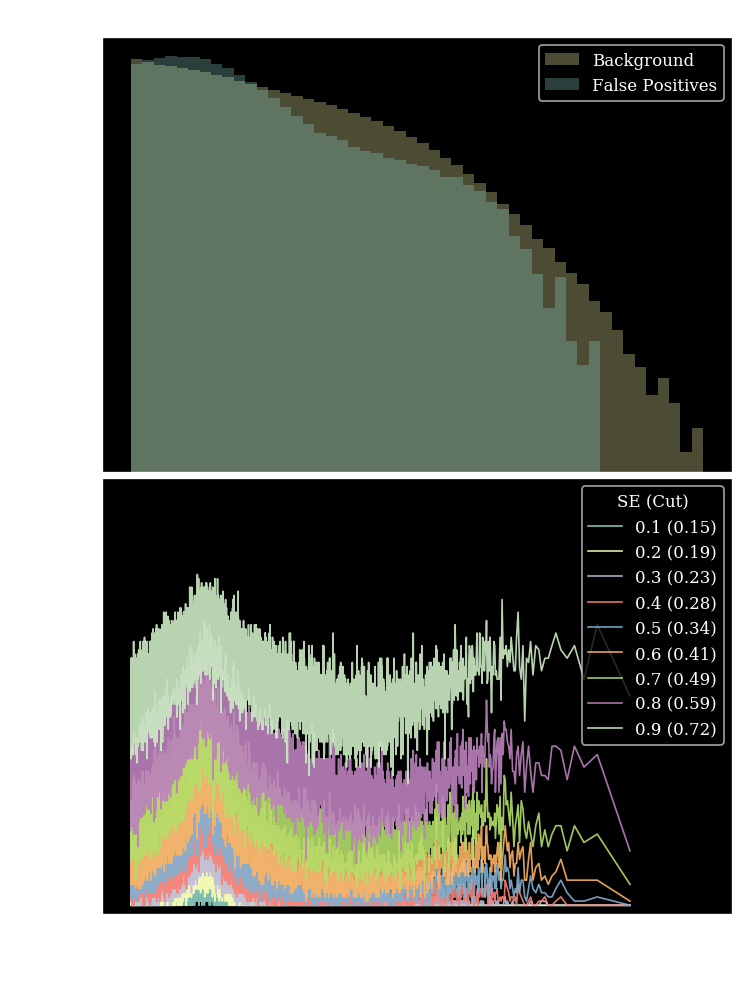

strength 15
Entering Training...
Epoch:0001/0400  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (172.5s)
 Train: loss:0.3626, acc:66% || Val: loss: 0.0789, acc:76%, R50: 7.1450, 1/JSD: 633.1133
Epoch:0200/0400  (344.8s)
 Train: loss:0.3626, acc:69% || Val: loss: 0.0765, acc:78%, R50: 8.5998, 1/JSD: 227.2663
Epoch:0300/0400  (515.5s)
 Train: loss:0.3331, acc:67% || Val: loss: 0.0726, acc:78%, R50: 10.0213, 1/JSD: 62.3846
Epoch:0400/0400  (696.1s)
 Train: loss:0.3261, acc:68% || Val: loss: 0.0726, acc:79%, R50: 10.1667, 1/JSD: 113.8388


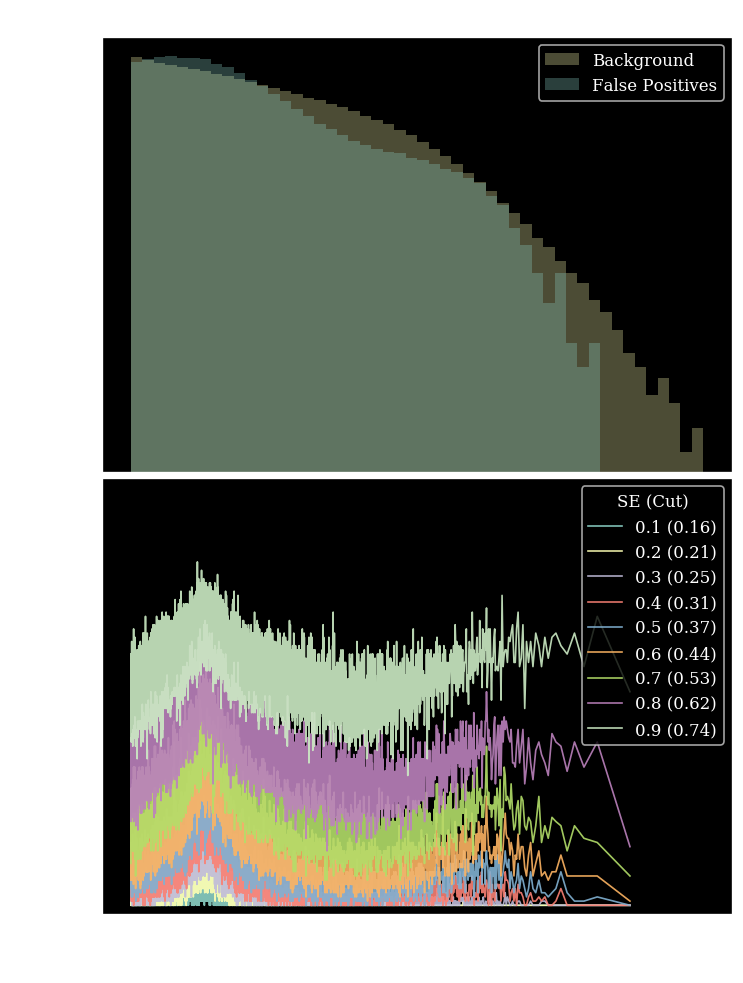

strength 20
Entering Training...
Epoch:0001/0400  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (186.3s)
 Train: loss:0.3897, acc:64% || Val: loss: 0.0804, acc:77%, R50: 6.9775, 1/JSD: 747.6522
Epoch:0200/0400  (365.7s)
 Train: loss:0.3906, acc:67% || Val: loss: 0.0783, acc:79%, R50: 8.2979, 1/JSD: 409.5328
Epoch:0300/0400  (545.3s)
 Train: loss:0.3629, acc:65% || Val: loss: 0.0747, acc:79%, R50: 9.2025, 1/JSD: 151.3857
Epoch:0400/0400  (724.4s)
 Train: loss:0.3514, acc:65% || Val: loss: 0.0753, acc:80%, R50: 9.2269, 1/JSD: 337.2192


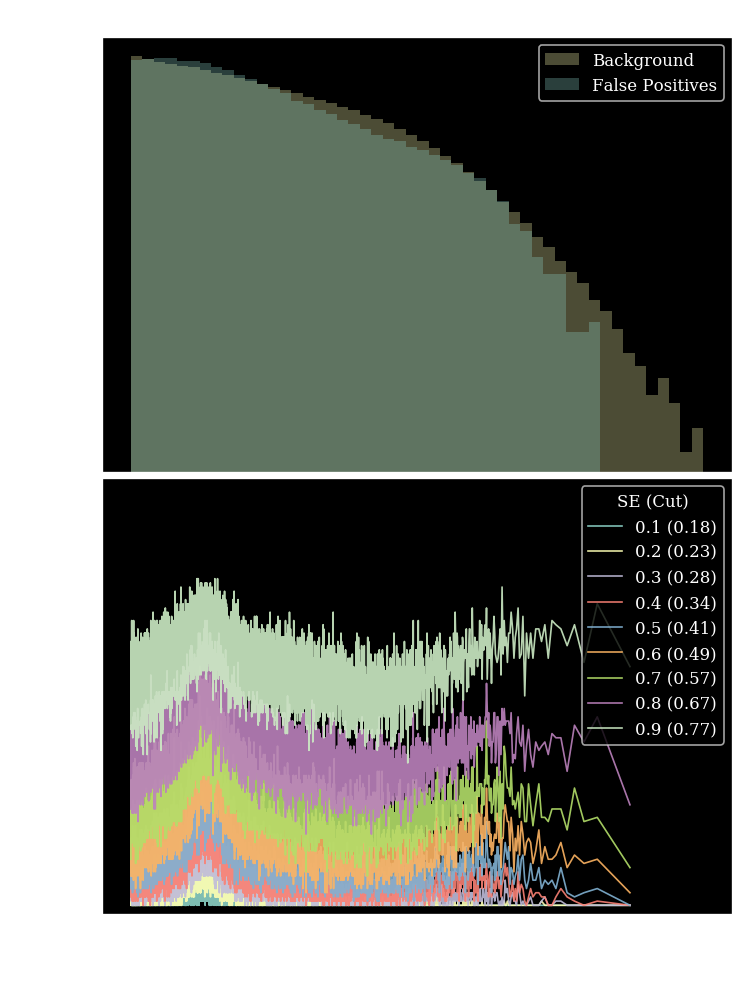

strength 50
Entering Training...
Epoch:0001/0400  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (178.8s)
 Train: loss:0.5223, acc:45% || Val: loss: 0.0983, acc:82%, R50: 6.6983, 1/JSD: 751.5520
Epoch:0200/0400  (345.0s)
 Train: loss:0.5105, acc:51% || Val: loss: 0.0986, acc:83%, R50: 7.8951, 1/JSD: 620.2729
Epoch:0300/0400  (510.9s)
 Train: loss:0.4986, acc:51% || Val: loss: 0.0975, acc:83%, R50: 8.5452, 1/JSD: 424.0006
Epoch:0400/0400  (676.4s)
 Train: loss:0.4832, acc:52% || Val: loss: 0.0982, acc:83%, R50: 8.4194, 1/JSD: 589.5269


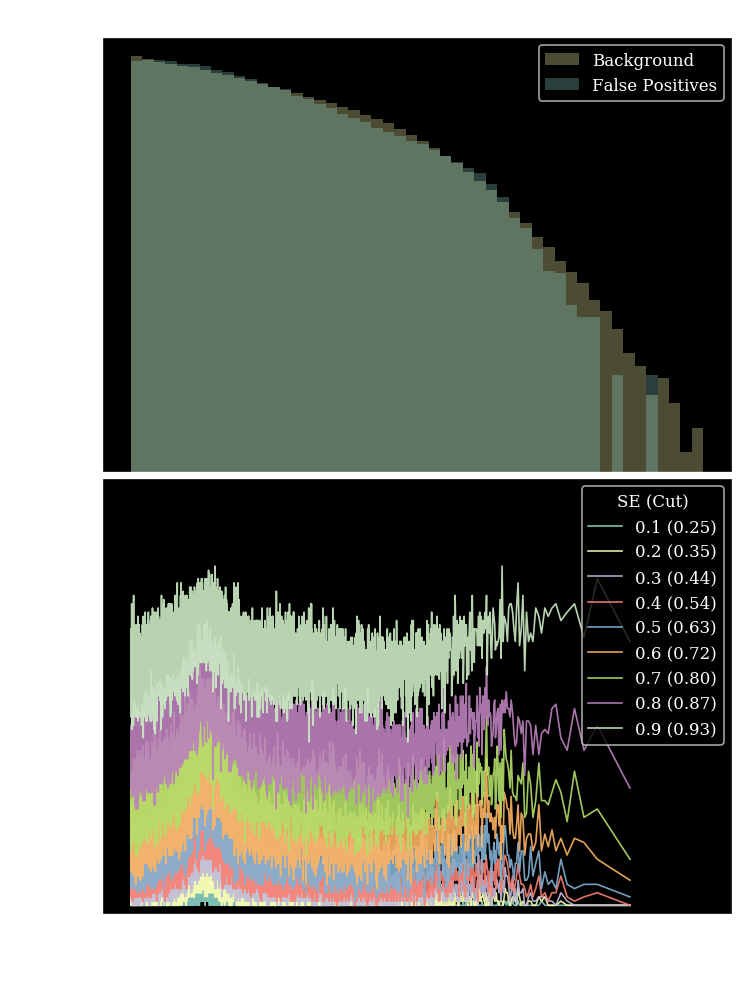

strength 100
Entering Training...
Epoch:0001/0400  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (176.1s)
 Train: loss:0.6912, acc:30% || Val: loss: 0.1874, acc:80%, R50: 5.1986, 1/JSD: 781.6303
Epoch:0200/0400  (341.9s)
 Train: loss:0.6803, acc:30% || Val: loss: 0.1599, acc:80%, R50: 5.8672, 1/JSD: 580.2782
Epoch:0300/0400  (520.0s)
 Train: loss:0.6187, acc:38% || Val: loss: 0.1440, acc:82%, R50: 7.4755, 1/JSD: 487.2067
Epoch:0400/0400  (693.5s)
 Train: loss:0.5934, acc:43% || Val: loss: 0.1412, acc:83%, R50: 7.8995, 1/JSD: 372.4786


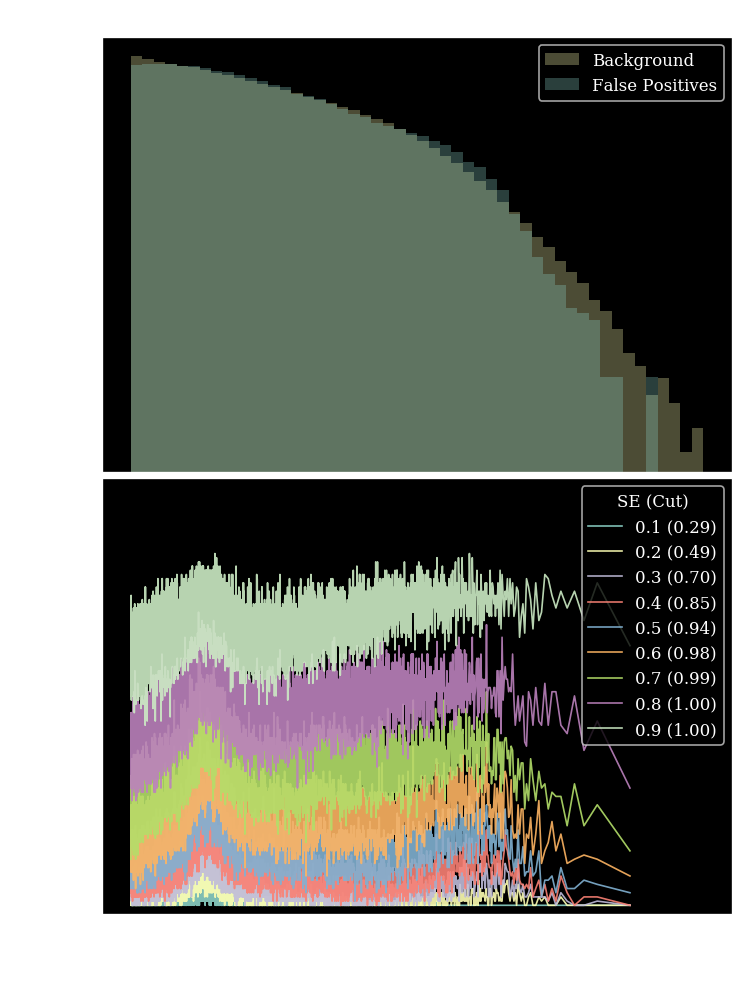

strength 200
Entering Training...
Epoch:0001/0400  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (186.5s)
 Train: loss:0.6975, acc:30% || Val: loss: 0.1950, acc:80%, R50: 3.5448, 1/JSD: 701.4697
Epoch:0200/0400  (366.1s)
 Train: loss:0.6952, acc:30% || Val: loss: 0.1951, acc:80%, R50: 3.6134, 1/JSD: 696.2363
Epoch:0300/0400  (546.5s)
 Train: loss:0.6972, acc:30% || Val: loss: 0.1951, acc:80%, R50: 3.6675, 1/JSD: 688.9782
Epoch:0400/0400  (726.3s)
 Train: loss:0.6963, acc:30% || Val: loss: 0.1951, acc:80%, R50: 3.6869, 1/JSD: 673.1950


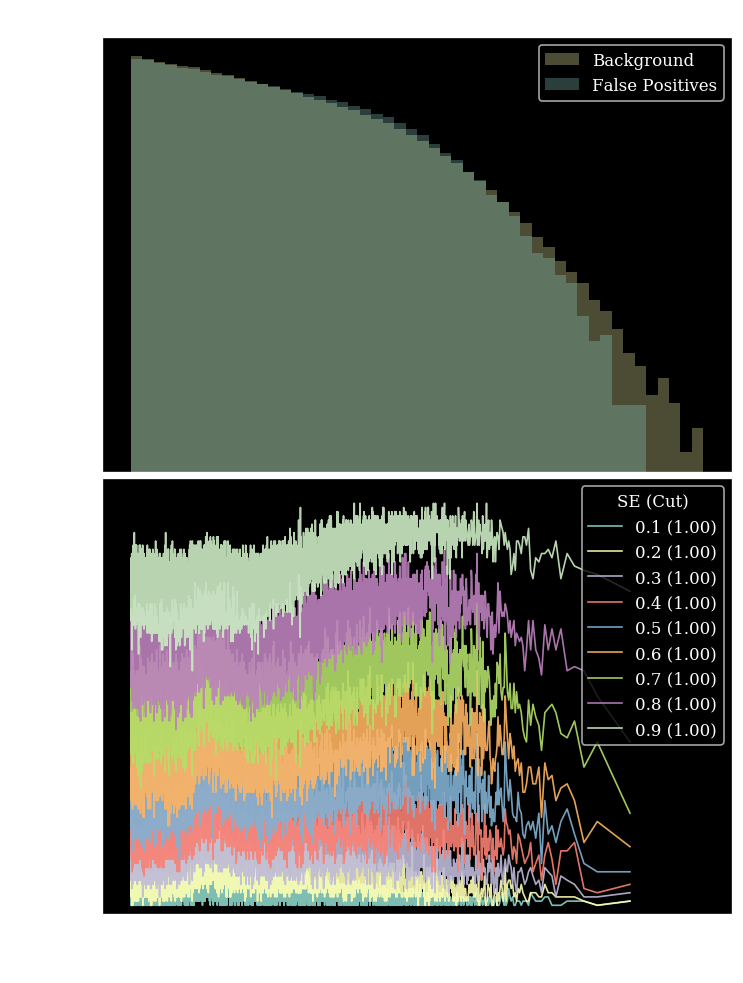

strength 500
Entering Training...
Epoch:0001/0400  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (171.2s)
 Train: loss:0.6978, acc:30% || Val: loss: 0.1951, acc:80%, R50: 2.7349, 1/JSD: 666.3605
Epoch:0200/0400  (343.3s)
 Train: loss:0.6953, acc:30% || Val: loss: 0.1951, acc:80%, R50: 2.7803, 1/JSD: 674.5129
Epoch:0300/0400  (513.5s)
 Train: loss:0.6973, acc:30% || Val: loss: 0.1951, acc:80%, R50: 2.8187, 1/JSD: 669.9626
Epoch:0400/0400  (694.4s)
 Train: loss:0.6964, acc:30% || Val: loss: 0.1951, acc:80%, R50: 2.8391, 1/JSD: 672.9132


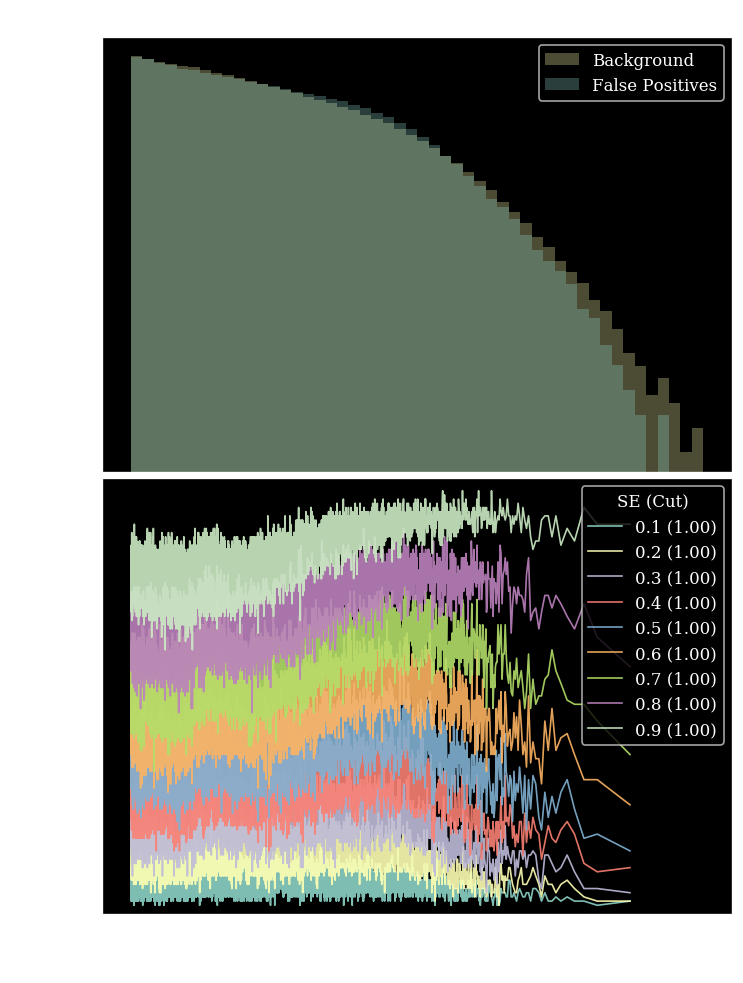

strength 1000
Entering Training...
Epoch:0001/0400  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (185.4s)
 Train: loss:0.6978, acc:30% || Val: loss: 0.1951, acc:80%, R50: 3.0466, 1/JSD: 15.4126
Epoch:0200/0400  (359.6s)
 Train: loss:0.6953, acc:30% || Val: loss: 0.1951, acc:80%, R50: 3.1929, 1/JSD: 15.0633
Epoch:0300/0400  (530.0s)
 Train: loss:0.6973, acc:30% || Val: loss: 0.1951, acc:80%, R50: 2.9252, 1/JSD: 16.6493
Epoch:0400/0400  (711.7s)
 Train: loss:0.6964, acc:30% || Val: loss: 0.1951, acc:80%, R50: 4.1040, 1/JSD: 11.3377


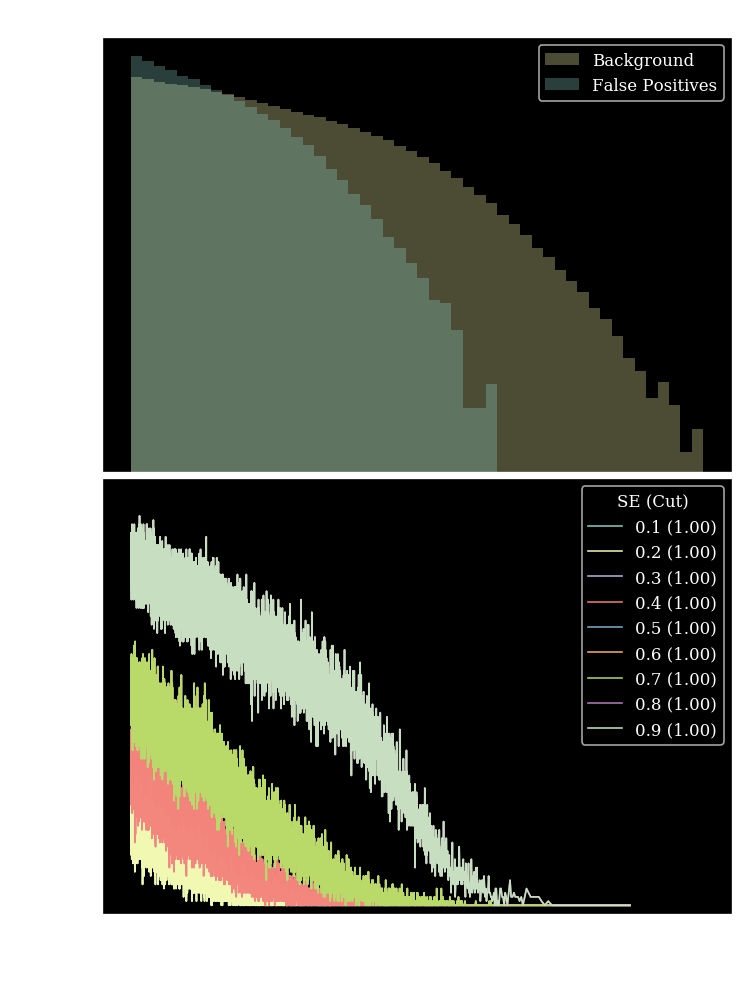

In [23]:
params['epochs'] = 400
jsd_r50 = list()
for i,frac in enumerate([1e-1,1,5,10,12,15,20,50,100,200,500,1000]):
    print("strength",frac)
    torch.manual_seed(777)
    model_L = Classifier().to(device)
    optimizer = torch.optim.SGD(model_L.parameters(),lr=8e-2,momentum=0.)
    loss =  FlatLoss(labels=traindataset.labels,frac=frac,sbins=135,bins=300)
    log=Logger("./logs/logWFCNflatLoss(135bins).txt")
    model_L.fit(traindataset=traindataset,
                valdataset=valdataset,
                optimizer=optimizer,
                loss=loss,
                **params,
                log=log,)
    out=plot_stuff(model=model_L,name=f"Flat DNN str:{frac}",X=X,y=test_labels,x_biased=test[:,0])
    jsd_r50.append(out)

In [ ]:
# JSD,R50 = zip(*[#(4.41,21.78),
#  (10.818966928718535, 11.456798940618071),
#  (22.13809094076523, 10.293842410630731),
#  (191.77903999676036, 8.886631966484703),
#  (497.1336850302751, 8.29437490574574),
#  (638.1813898496383, 7.997839544642486),
#  (688.1655040279177, 7.72378927095454),
#  (779.950754450987, 7.7517038647780705),
#  (827.2273806057531, 7.763427200225846),
#  (871.1888003565248, 7.762331522122644),
#  (900.6323875792986, 7.746712677444992),
#  (898.5053633409754, 7.7103318446718605),
#  (893.9363739686756, 7.656358755095953),
#  (880.9883955570202, 7.601109564565009),
#  (851.8436119220329, 7.559692114357525),
#  (797.8332146968906, 7.3601804678016),
#  (667.7521374075037, 6.961081227681599),
#  (852.5188675615033, 3.989554620629624),
#  (919.9630236692708, 3.3175212515241213),
#                ])

JSD,R50 = zip(*[(7.855173568822371, 16.35270881559666),
 (7.788252605260958, 14.312799732332056),
 (16.612881776069457, 13.383855941041508),
 (30.28072967200202, 11.953923060204303),
 (37.117897083774494, 11.514018691588786),
 (53.61261739364956, 10.782048589231954),
 (188.1309405620305, 9.608305569073734),
 (579.3826074171753, 8.758958025253099),
 (535.844348639505, 8.091635140815468),
 (1291.1461492574706, 4.86000656416471),
 (1224.5092433973684, 4.182782147668506),
 (1147.4025964013497, 3.8551466207386857)])

JSD2,R502 = zip(*[(7.044400654176942, 17.077714691270405),
 (7.345588781336469, 16.162209814869232),
 (39.65022060408894, 10.378057820607857),
 (377.4909269506062, 8.444927011702257),
 (981.5628056431593, 8.215173532204547),
 (1162.20110599138, 8.208692685734997),
 (1069.143164124408, 8.00931993592544),
 (840.8202267332115, 7.515714676141022),])
 
JSD3 = [4,25,1.6e3,1.5e3,3e3,8e3]
R503 = [23,15,9.5,8.5,4,3.6]
JSD4 = [4,9,90,300,310,240,740]
R504 = [20,17,11,7.4,4.9,3.7,3.1]
    
fig, ax= plt.subplots(1,1,figsize=(8,8),dpi=150)
plt.errorbar(R50,JSD,fmt='-o',label='Flat',c='tab:blue')
plt.errorbar(R502,JSD2,fmt='-o',label='DisCo',c='orange')
plt.errorbar(R503,JSD3,fmt='--',label='DisCo(paper)',c='orange',ls='--')
plt.errorbar(R504,JSD4,fmt='--',label='Adaboost(paper)',c='C3',ls='--')
plt.xscale('log')
plt.yscale('log')
plt.xlim([2,100])
plt.ylim([1,1.3e5])
plt.legend(loc='upper left')
plt.xlabel('R50')
plt.ylabel('1/JSD')

# DisCo

In [ ]:
jsd_r50Disco

strength 0
Entering Training...
Epoch:0001/0400  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (286.0s)
 Train: loss:0.2661, acc:71% || Val: loss: 0.0745, acc:73%, R50: 9.2984, 1/JSD: 31.1203
Epoch:0200/0400  (559.8s)
 Train: loss:0.2415, acc:74% || Val: loss: 0.0685, acc:77%, R50: 11.4128, 1/JSD: 9.8818
Epoch:0300/0400  (849.1s)
 Train: loss:0.2244, acc:77% || Val: loss: 0.0640, acc:79%, R50: 13.3787, 1/JSD: 7.8266
Epoch:0400/0400  (1137.4s)
 Train: loss:0.2144, acc:78% || Val: loss: 0.0607, acc:80%, R50: 16.4819, 1/JSD: 7.2032


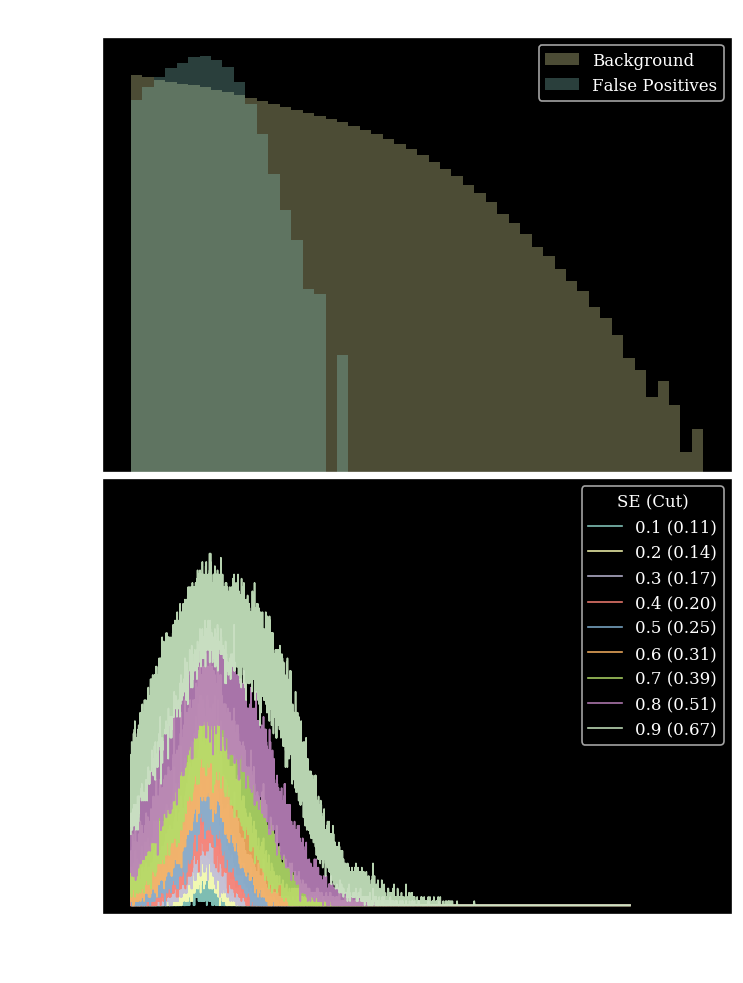

strength 0.1
Entering Training...
Epoch:0001/0400  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (280.7s)
 Train: loss:0.2669, acc:71% || Val: loss: 0.0744, acc:73%, R50: 9.2717, 1/JSD: 37.2402
Epoch:0200/0400  (568.7s)
 Train: loss:0.2487, acc:74% || Val: loss: 0.0694, acc:76%, R50: 11.7188, 1/JSD: 12.7649
Epoch:0300/0400  (858.0s)
 Train: loss:0.2322, acc:76% || Val: loss: 0.0647, acc:78%, R50: 13.8591, 1/JSD: 10.5702
Epoch:0400/0400  (1145.9s)
 Train: loss:0.2241, acc:77% || Val: loss: 0.0616, acc:80%, R50: 16.1322, 1/JSD: 7.4979


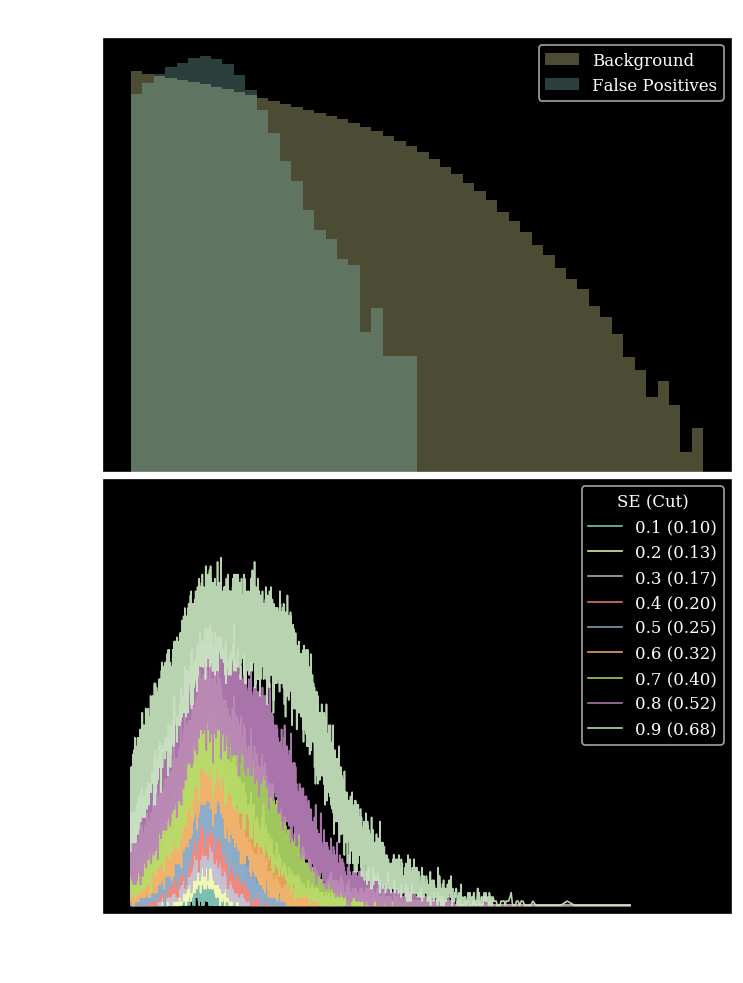

strength 1
Entering Training...
Epoch:0001/0400  (7.6  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (292.4s)
 Train: loss:0.2709, acc:70% || Val: loss: 0.0754, acc:72%, R50: 8.4177, 1/JSD: 87.3299
Epoch:0200/0400  (578.1s)
 Train: loss:0.2609, acc:71% || Val: loss: 0.0727, acc:74%, R50: 9.2574, 1/JSD: 54.0738
Epoch:0300/0400  (865.7s)
 Train: loss:0.2531, acc:72% || Val: loss: 0.0708, acc:76%, R50: 9.9662, 1/JSD: 40.5147
Epoch:0400/0400  (1152.0s)
 Train: loss:0.2517, acc:72% || Val: loss: 0.0691, acc:77%, R50: 10.6476, 1/JSD: 33.6591


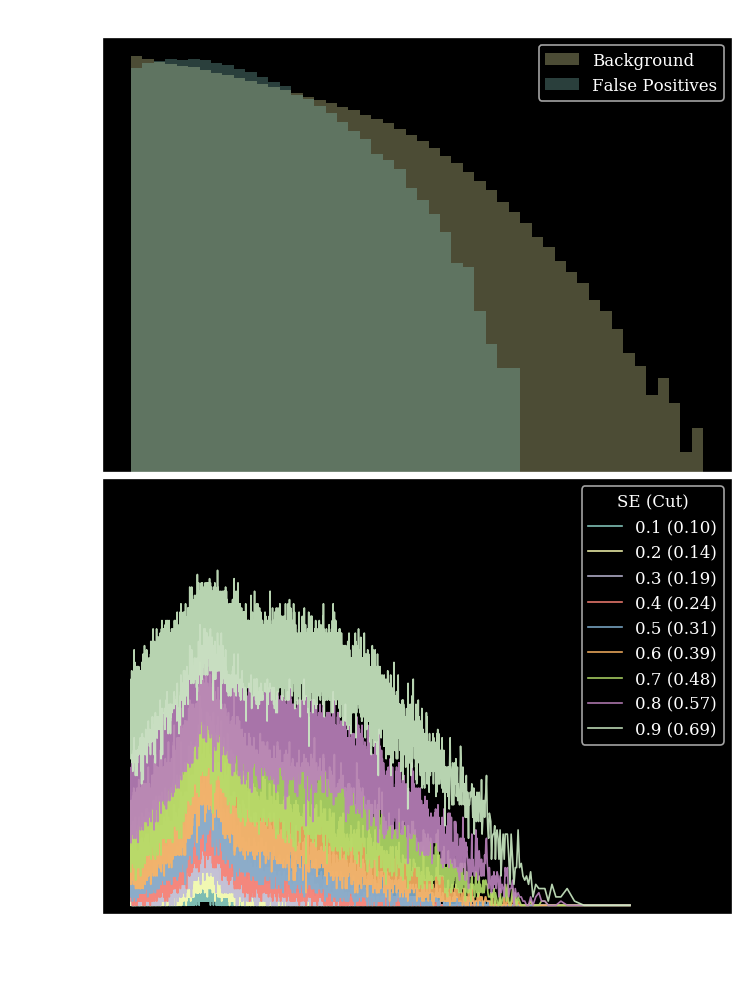

strength 5
Entering Training...
Epoch:0001/0400  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (288.1s)
 Train: loss:0.2959, acc:69% || Val: loss: 0.0815, acc:71%, R50: 6.8173, 1/JSD: 231.8478
Epoch:0200/0400  (564.0s)
 Train: loss:0.2697, acc:71% || Val: loss: 0.0751, acc:72%, R50: 8.0437, 1/JSD: 299.5845
Epoch:0300/0400  (839.0s)
 Train: loss:0.2656, acc:71% || Val: loss: 0.0741, acc:73%, R50: 8.2692, 1/JSD: 338.7500
Epoch:0400/0400  (1114.0s)
 Train: loss:0.2640, acc:71% || Val: loss: 0.0732, acc:74%, R50: 8.4925, 1/JSD: 411.0605


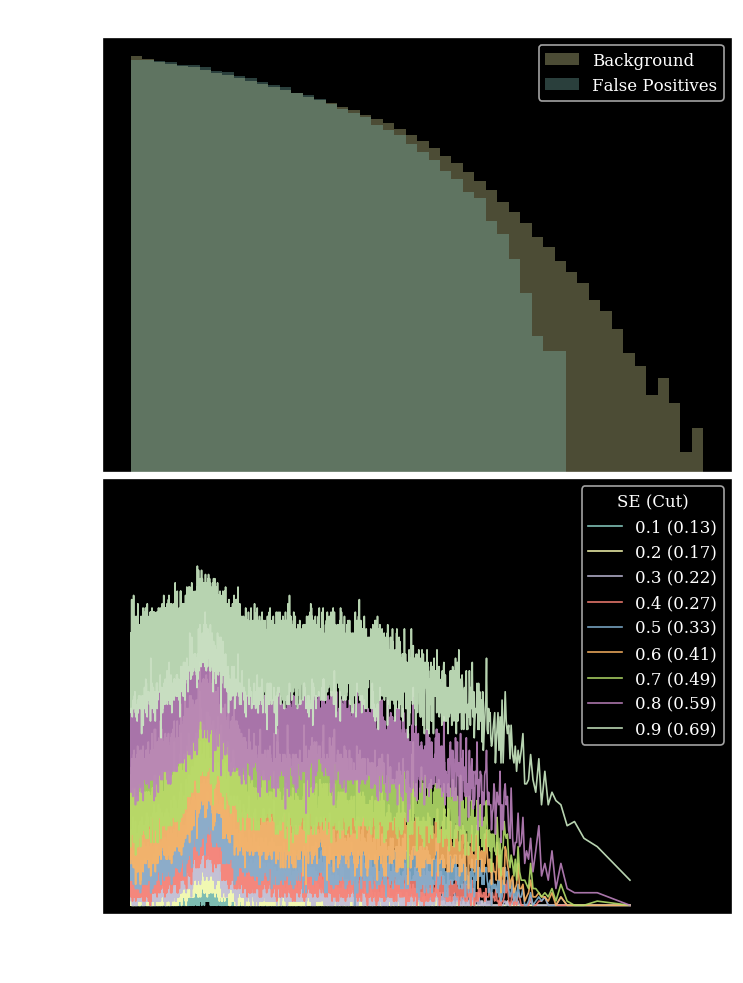

strength 10
Entering Training...
Epoch:0001/0400  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (283.6s)
 Train: loss:0.3234, acc:66% || Val: loss: 0.0886, acc:68%, R50: 5.6497, 1/JSD: 418.2779
Epoch:0200/0400  (558.1s)
 Train: loss:0.2724, acc:71% || Val: loss: 0.0757, acc:71%, R50: 7.6318, 1/JSD: 813.2484
Epoch:0300/0400  (847.5s)
 Train: loss:0.2692, acc:71% || Val: loss: 0.0745, acc:73%, R50: 8.0212, 1/JSD: 949.0975
Epoch:0400/0400  (1128.3s)
 Train: loss:0.2729, acc:71% || Val: loss: 0.0736, acc:74%, R50: 8.2247, 1/JSD: 1183.8350


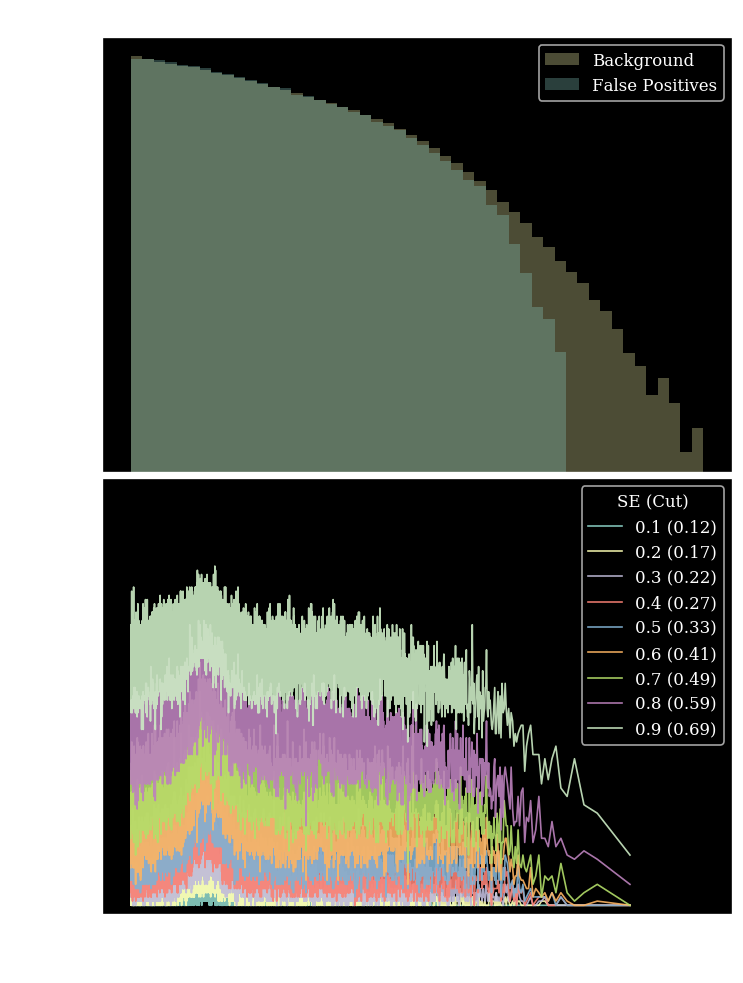

strength 12
Entering Training...
Epoch:0001/0400  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (294.7s)
 Train: loss:0.3190, acc:67% || Val: loss: 0.0868, acc:68%, R50: 6.0114, 1/JSD: 362.6395
Epoch:0200/0400  (581.5s)
 Train: loss:0.2730, acc:70% || Val: loss: 0.0758, acc:71%, R50: 7.5524, 1/JSD: 830.4391
Epoch:0300/0400  (871.9s)
 Train: loss:0.2689, acc:71% || Val: loss: 0.0746, acc:72%, R50: 7.9950, 1/JSD: 1072.3495
Epoch:0400/0400  (1158.5s)
 Train: loss:0.2783, acc:71% || Val: loss: 0.0736, acc:73%, R50: 8.2840, 1/JSD: 1170.0311


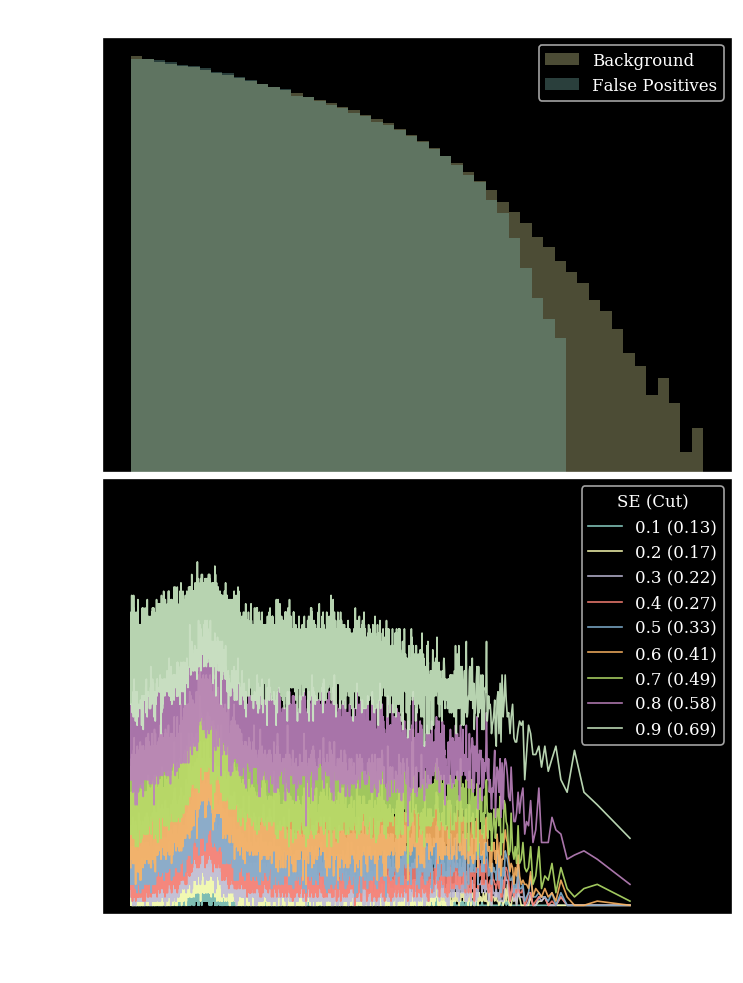

strength 15
Entering Training...
Epoch:0001/0400  (7.5  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (291.2s)
 Train: loss:0.3428, acc:66% || Val: loss: 0.0933, acc:62%, R50: 5.1370, 1/JSD: 717.8622
Epoch:0200/0400  (577.2s)
 Train: loss:0.2752, acc:70% || Val: loss: 0.0764, acc:71%, R50: 7.4034, 1/JSD: 907.6981
Epoch:0300/0400  (865.9s)
 Train: loss:0.2731, acc:70% || Val: loss: 0.0751, acc:73%, R50: 7.8010, 1/JSD: 986.3326
Epoch:0400/0400  (1151.3s)
 Train: loss:0.2773, acc:70% || Val: loss: 0.0744, acc:74%, R50: 7.9946, 1/JSD: 1163.4346


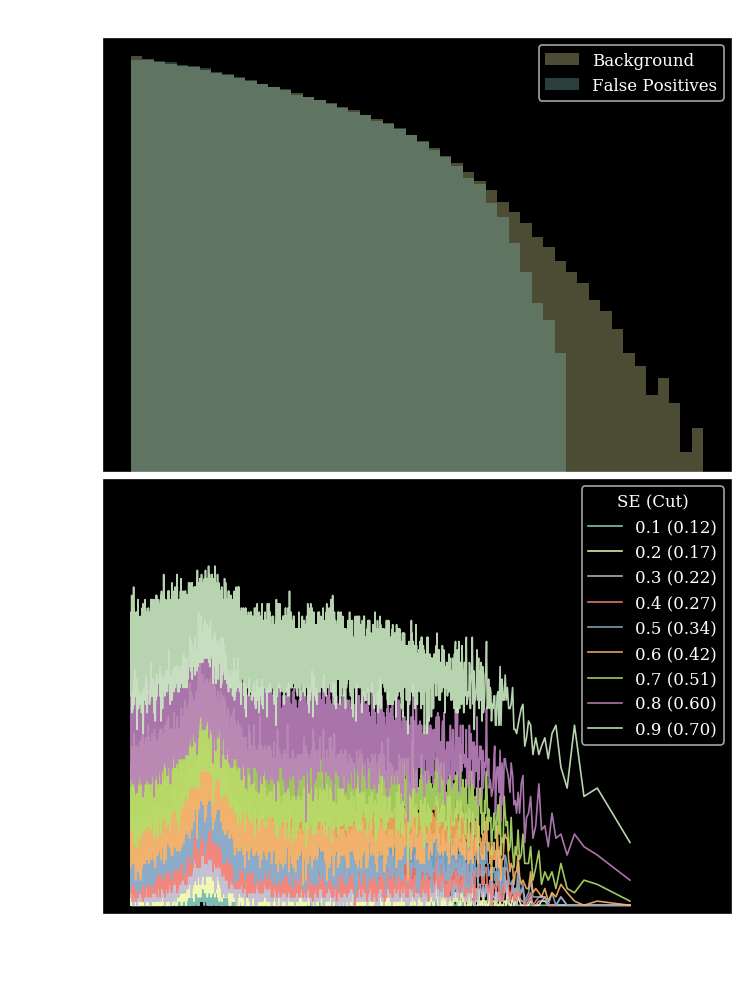

strength 20
Entering Training...
Epoch:0001/0400  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (288.1s)
 Train: loss:0.3527, acc:52% || Val: loss: 0.0980, acc:40%, R50: 1.8337, 1/JSD: 11970.6937
Epoch:0200/0400  (563.2s)
 Train: loss:0.3478, acc:61% || Val: loss: 0.0964, acc:41%, R50: 3.4787, 1/JSD: 6633.0343
Epoch:0300/0400  (837.7s)
 Train: loss:0.2908, acc:70% || Val: loss: 0.0773, acc:70%, R50: 7.2134, 1/JSD: 817.8822
Epoch:0400/0400  (1112.7s)
 Train: loss:0.2789, acc:69% || Val: loss: 0.0764, acc:72%, R50: 7.4534, 1/JSD: 918.0568


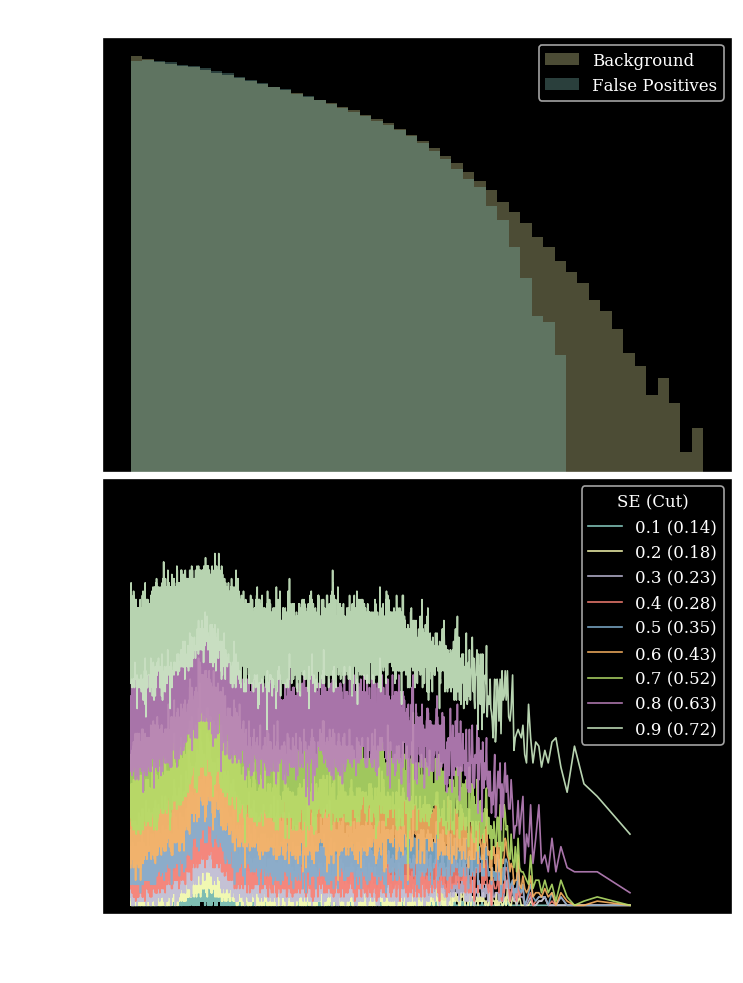

strength 50
Entering Training...
Epoch:0001/0400  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (282.7s)
 Train: loss:0.7199, acc:30% || Val: loss: 0.1951, acc:80%, R50: 329.0130, 1/JSD: 20.3745
Epoch:0200/0400  (556.9s)
 Train: loss:0.7046, acc:30% || Val: loss: 0.1951, acc:80%, R50: 367.0745, 1/JSD: 24.7623
Epoch:0300/0400  (843.1s)
 Train: loss:0.7043, acc:30% || Val: loss: 0.1951, acc:80%, R50: 535.7143, 1/JSD: 25.2580
Epoch:0400/0400  (1130.2s)
 Train: loss:0.7038, acc:30% || Val: loss: 0.1951, acc:80%, R50: 658.6826, 1/JSD: 34.4540


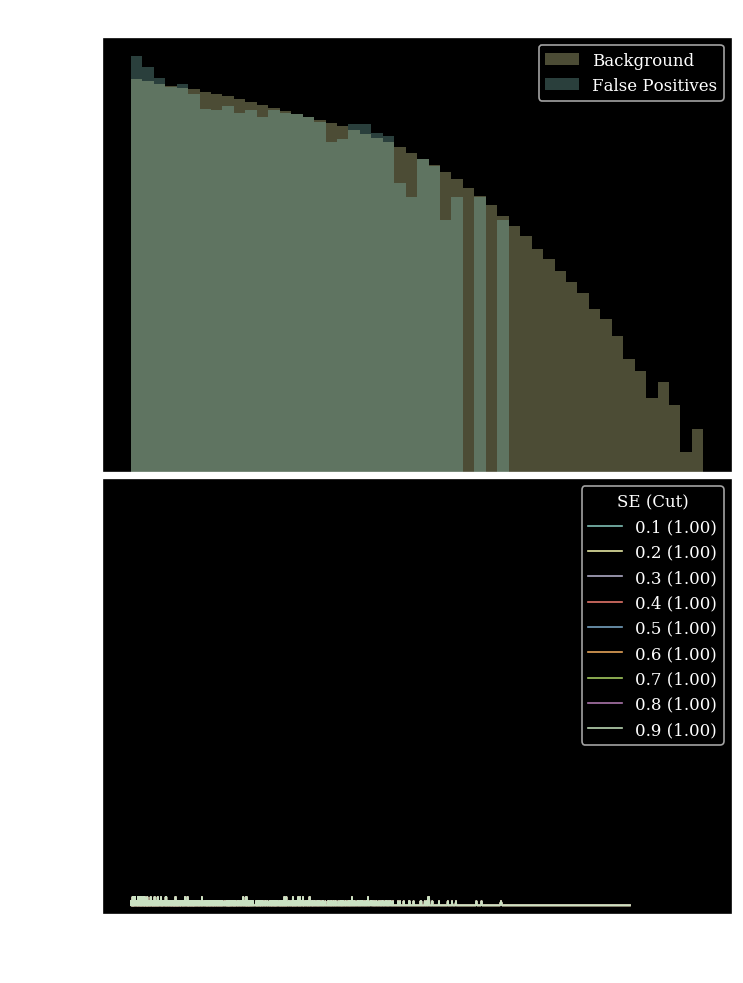

strength 100
Entering Training...
Epoch:0001/0400  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (291.0s)
 Train: loss:nan, acc:0% || Val: loss: nan, acc:0%, R50: inf, 1/JSD: nan
Epoch:0200/0400  (569.1s)
 Train: loss:nan, acc:0% || Val: loss: nan, acc:0%, R50: inf, 1/JSD: nan
Epoch:0300/0400  (843.7s)
 Train: loss:nan, acc:0% || Val: loss: nan, acc:0%, R50: inf, 1/JSD: nan
Epoch:0400/0400  (1125.4s)
 Train: loss:nan, acc:0% || Val: loss: nan, acc:0%, R50: inf, 1/JSD: nan


/home/kitouni/anaconda3/envs/root3.7/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in less
  if sys.path[0] == '':
/home/kitouni/anaconda3/envs/root3.7/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide
/home/kitouni/anaconda3/envs/root3.7/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in less


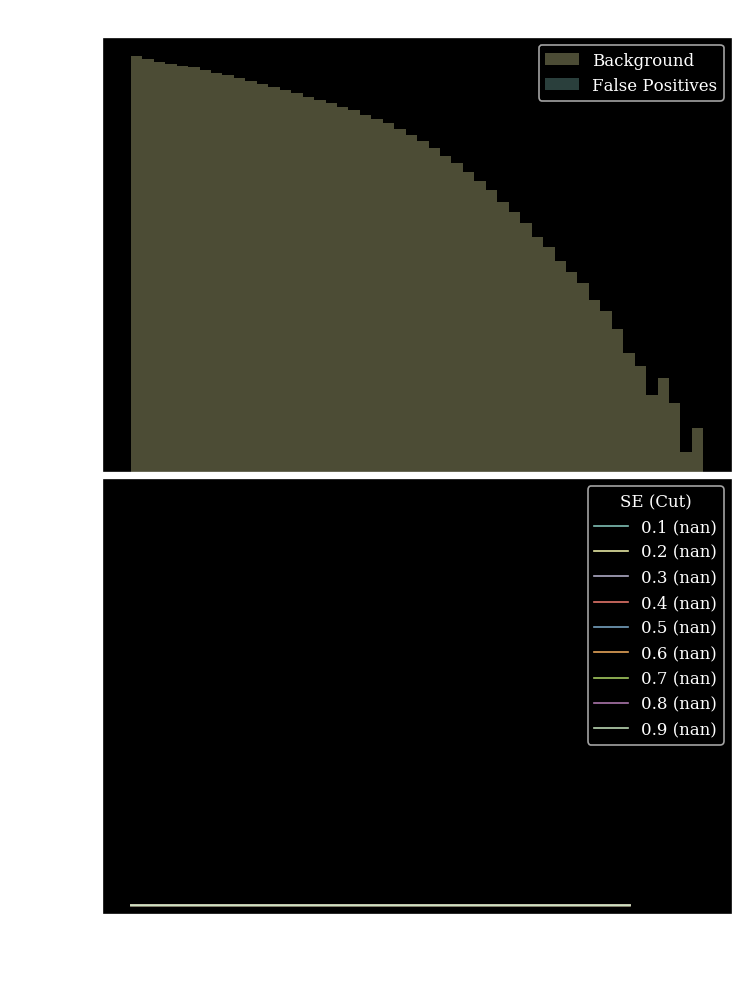

strength 200
Entering Training...
Epoch:0001/0400  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0400  (290.2s)
 Train: loss:nan, acc:0% || Val: loss: nan, acc:0%, R50: inf, 1/JSD: nan


KeyboardInterrupt: 

In [22]:
params['epochs'] = 400
jsd_r50Disco = list()
for i,frac in enumerate([0,1e-1,1,5,10,12,15,20,50,100,200,500]):
    print("strength",frac)
    metrics_train_L = Metrics()
    metrics_val_L = Metrics(validation=True)

    torch.manual_seed(777)
    model_L = Classifier().to(device)
    optimizer = torch.optim.SGD(model_L.parameters(),lr=8e-2,momentum=0.)
    loss =  Disco(frac=frac,labels=traindataset.labels,background_only=True)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=200, gamma=0.9)
    log=Logger("./logs/logWFCNDisLoss({:.2f}).txt".format(frac))
    model_L.fit(traindataset=traindataset,
                valdataset=valdataset,
                optimizer=optimizer,
                loss=loss,
                **params,
                log=log,
              #scheduler=scheduler,
              metrics=[metrics_train_L,metrics_val_L])
    out=plot_stuff(model=model_L,name=f"DisCo DNN str{frac}",X=X,y=test_labels,x_biased=test[:,0])
    jsd_r50Disco.append(out)

# No mse

strength 1
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (195.6s)
 Train: loss:0.0031, acc:30% || Val: loss: 0.1015, acc:80%, R50: 2.7239, 1/JSD: 576.6080
Epoch:0200/0200  (382.9s)
 Train: loss:0.0039, acc:30% || Val: loss: 0.1203, acc:80%, R50: 3.0801, 1/JSD: 559.6772


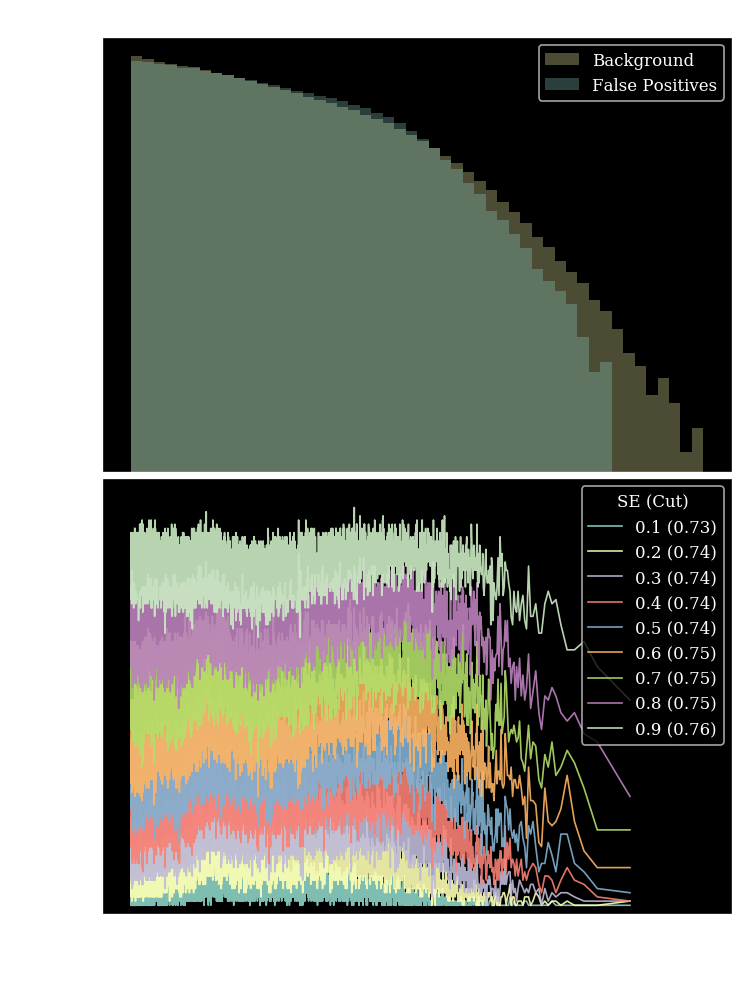

strength 1
Entering Training...
Epoch:0001/0200  (7.8  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (188.5s)
 Train: loss:0.0031, acc:30% || Val: loss: 0.1016, acc:80%, R50: 2.6332, 1/JSD: 676.3765
Epoch:0200/0200  (362.3s)
 Train: loss:0.0040, acc:30% || Val: loss: 0.1205, acc:80%, R50: 2.9306, 1/JSD: 683.8381


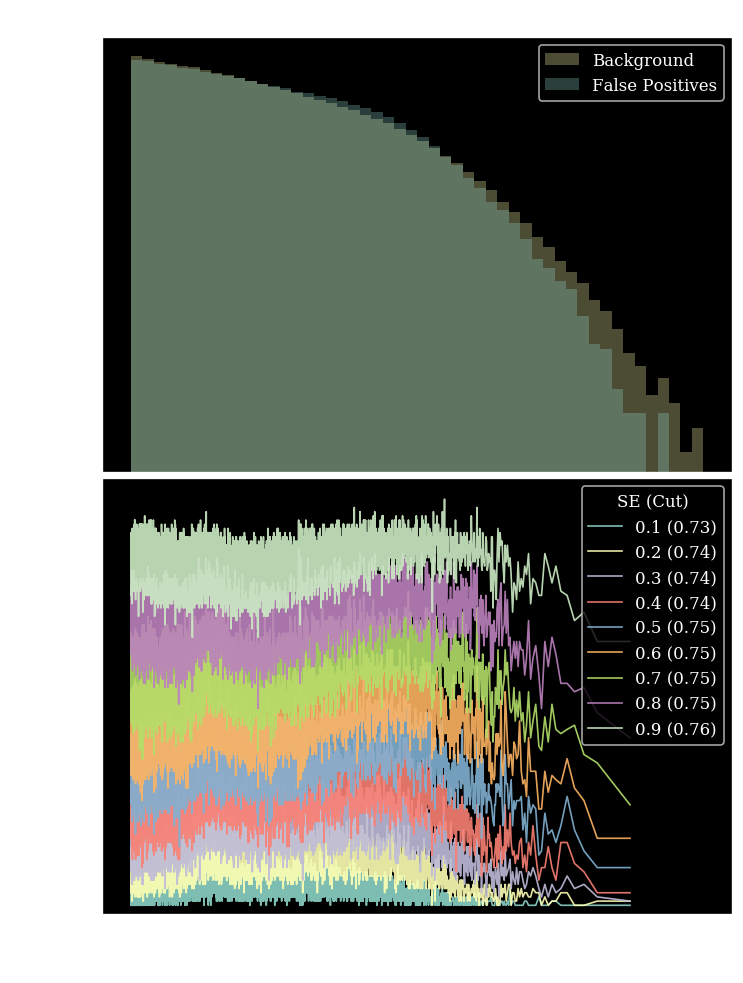

strength 1
Entering Training...
Epoch:0001/0200  (8.2  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (196.3s)
 Train: loss:0.0032, acc:30% || Val: loss: 0.1017, acc:80%, R50: 2.6007, 1/JSD: 679.3504
Epoch:0200/0200  (388.8s)
 Train: loss:0.0040, acc:30% || Val: loss: 0.1209, acc:80%, R50: 2.8876, 1/JSD: 703.2285


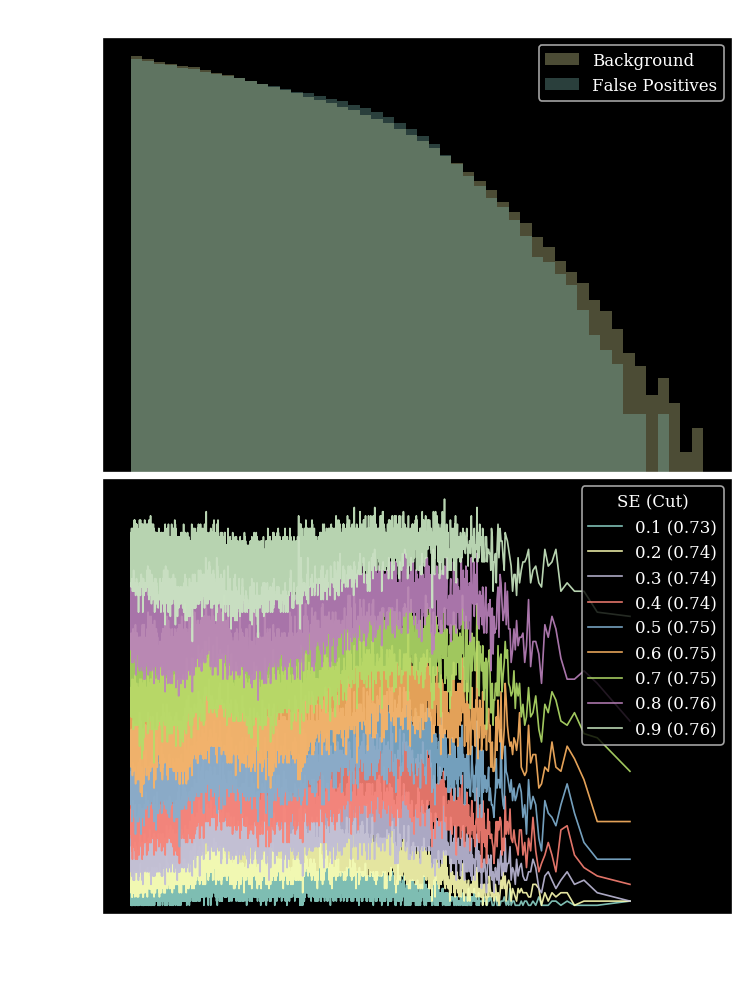

strength 1
Entering Training...
Epoch:0001/0200  (8.2  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (179.9s)
 Train: loss:0.0033, acc:30% || Val: loss: 0.1020, acc:80%, R50: 2.5566, 1/JSD: 732.5758
Epoch:0200/0200  (376.5s)
 Train: loss:0.0040, acc:30% || Val: loss: 0.1225, acc:80%, R50: 2.8465, 1/JSD: 730.2794


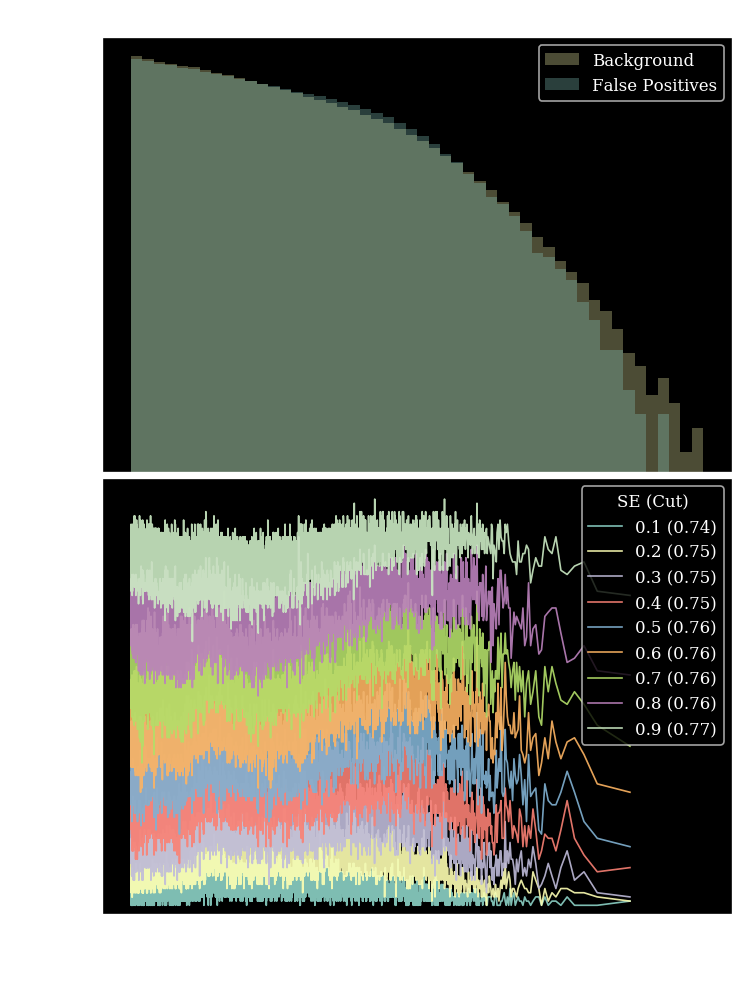

strength 1
Entering Training...
Epoch:0001/0200  (7.7  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (188.4s)
 Train: loss:0.0034, acc:30% || Val: loss: 0.1022, acc:80%, R50: 2.5596, 1/JSD: 736.6722
Epoch:0200/0200  (362.1s)
 Train: loss:0.0040, acc:30% || Val: loss: 0.1235, acc:80%, R50: 2.8576, 1/JSD: 716.3177


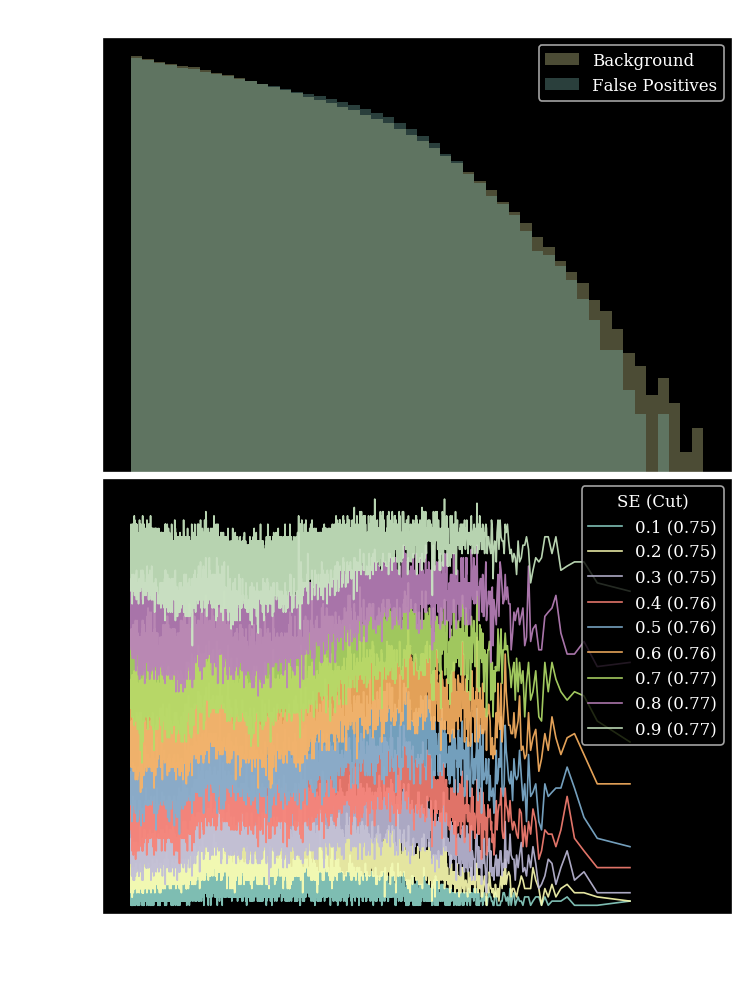

strength 1
Entering Training...
Epoch:0001/0200  (8.0  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (197.4s)
 Train: loss:0.0035, acc:30% || Val: loss: 0.1025, acc:80%, R50: 2.5652, 1/JSD: 739.5890
Epoch:0200/0200  (388.3s)
 Train: loss:0.0039, acc:30% || Val: loss: 0.1247, acc:80%, R50: 2.8643, 1/JSD: 720.1842


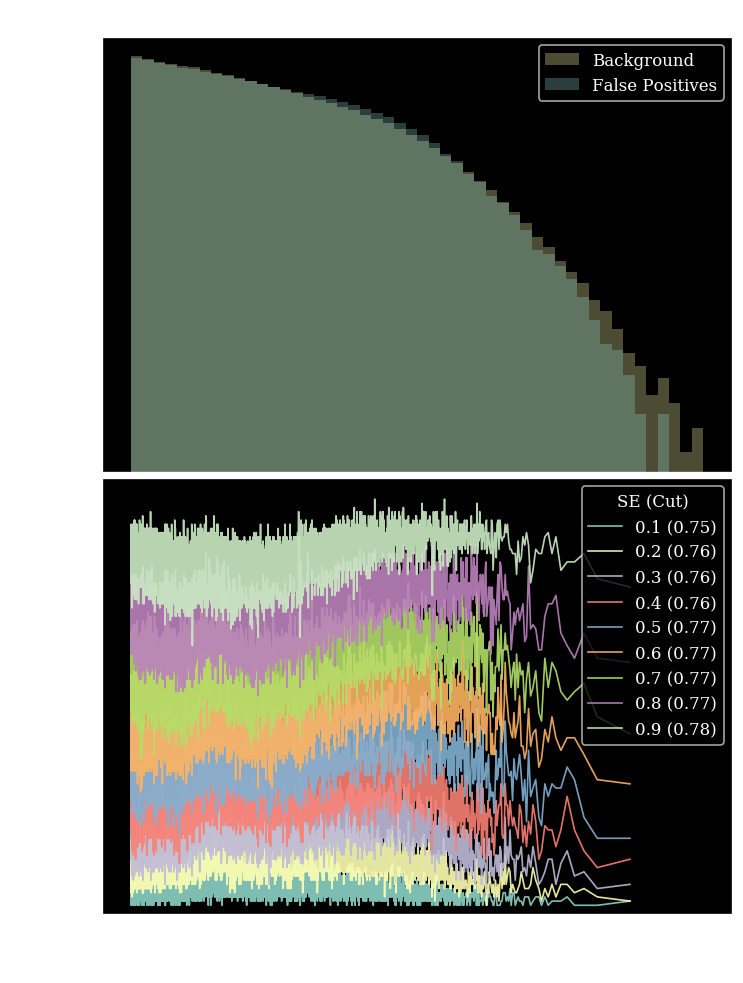

strength 1
Entering Training...
Epoch:0001/0200  (8.0  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0200/0200  (366.1s)
 Train: loss:0.0040, acc:30% || Val: loss: 0.1267, acc:80%, R50: 2.8749, 1/JSD: 719.4059


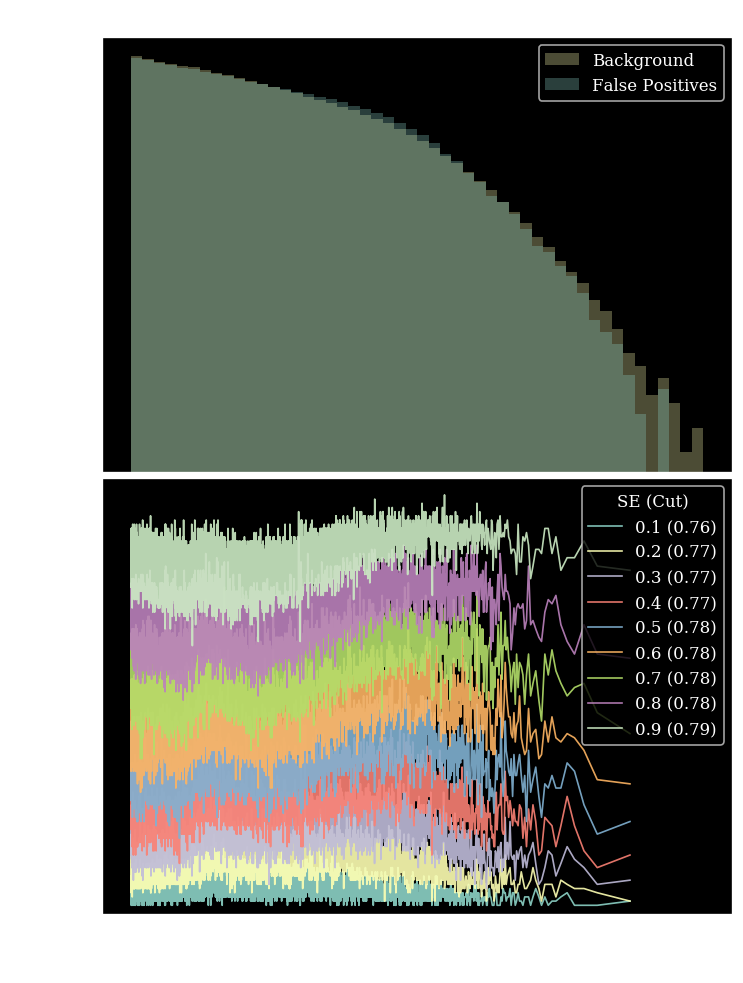

strength 1
Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (192.4s)
 Train: loss:0.0035, acc:30% || Val: loss: 0.1033, acc:80%, R50: 2.5740, 1/JSD: 770.4534
Epoch:0200/0200  (364.9s)
 Train: loss:0.0038, acc:30% || Val: loss: 0.1282, acc:80%, R50: 2.8806, 1/JSD: 766.2130


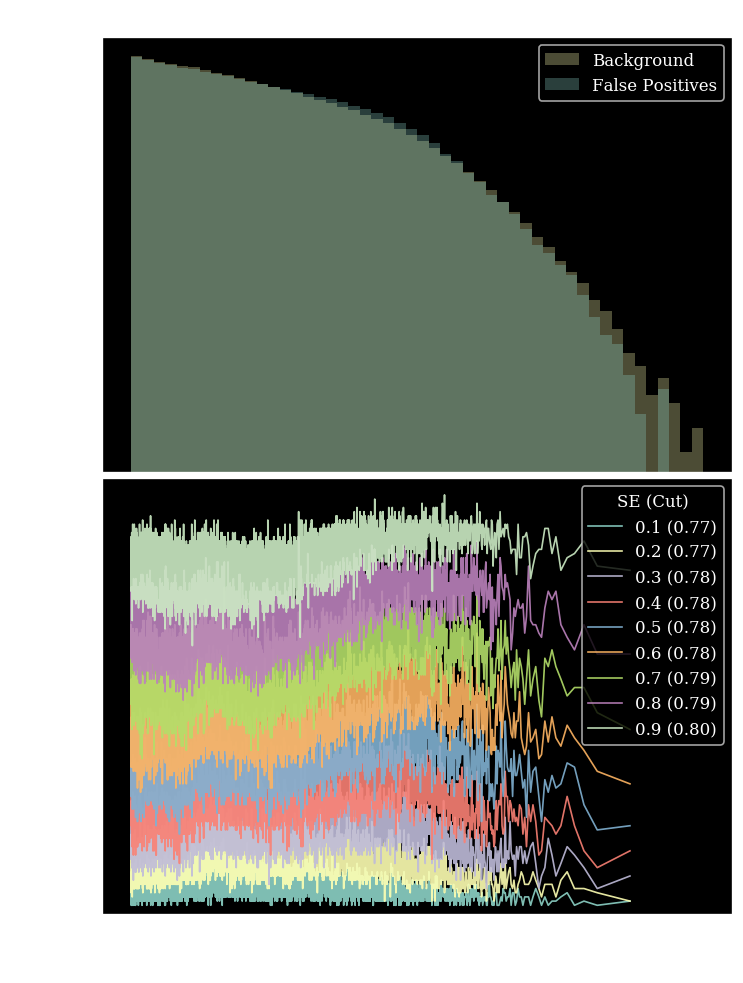

strength 1
Entering Training...
Epoch:0001/0200  (7.9  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (194.8s)
 Train: loss:0.0050, acc:30% || Val: loss: 0.1432, acc:80%, R50: 3.1683, 1/JSD: 1063.7484
Epoch:0200/0200  (383.4s)
 Train: loss:0.0014, acc:30% || Val: loss: 0.1830, acc:80%, R50: 3.3192, 1/JSD: 1126.8554


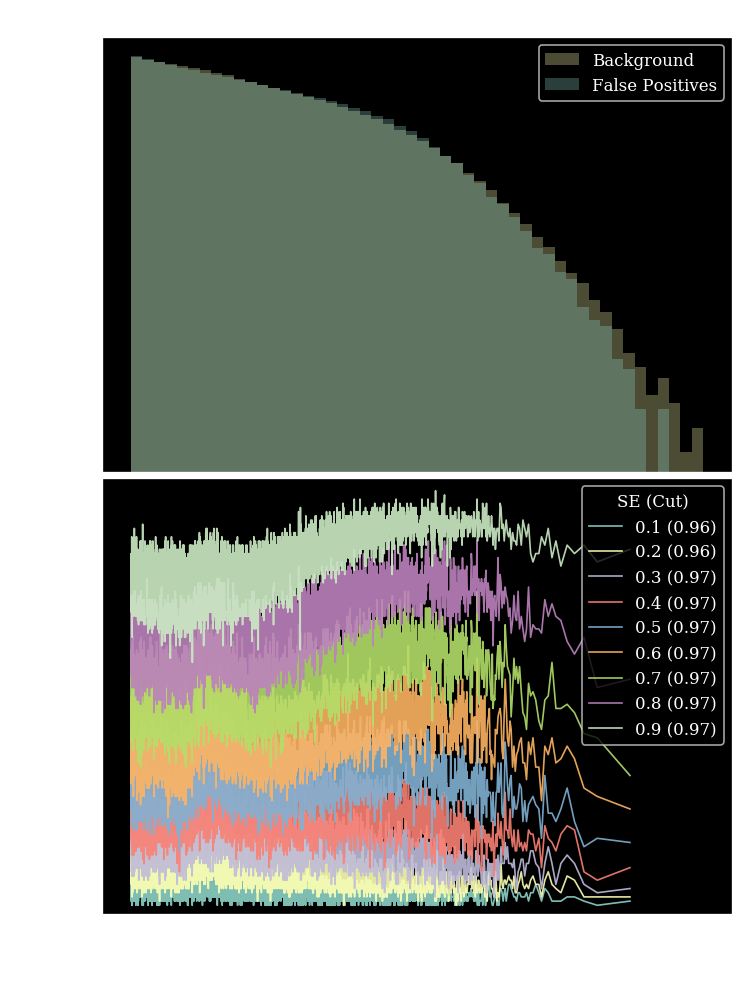

In [9]:
for i,bins in enumerate([10,20,32,64,80,100,128,150,1000]):
    frac = 1
    print("strength",frac)
    torch.manual_seed(777)
    model_L = Classifier().to(device)
    optimizer = torch.optim.SGD(model_L.parameters(),lr=8e-2,momentum=0.)
    loss =  FlatLoss(labels=traindataset.labels,frac=frac,sbins=135,bins=bins,msefrac=0)
    log=Logger("./logs/logWFCNflatLoss(NoMSE).txt")
    model_L.fit(traindataset=traindataset,
                valdataset=valdataset,
                optimizer=optimizer,
                loss=loss,
                **params,
                log=log,)
    out=plot_stuff(model=model_L,name=f"Flat DNN str:{frac}",X=X,y=test_labels,x_biased=test[:,0])

# DisCo No MSE 

strength 1
Entering Training...
Epoch:0001/0200  (8.2  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (278.4s)
 Train: loss:0.0015, acc:45% || Val: loss: 0.0989, acc:43%, R50: 1.6390, 1/JSD: 25962.8259
Epoch:0200/0200  (550.8s)
 Train: loss:0.0023, acc:44% || Val: loss: 0.0993, acc:42%, R50: 1.5987, 1/JSD: 25757.7645


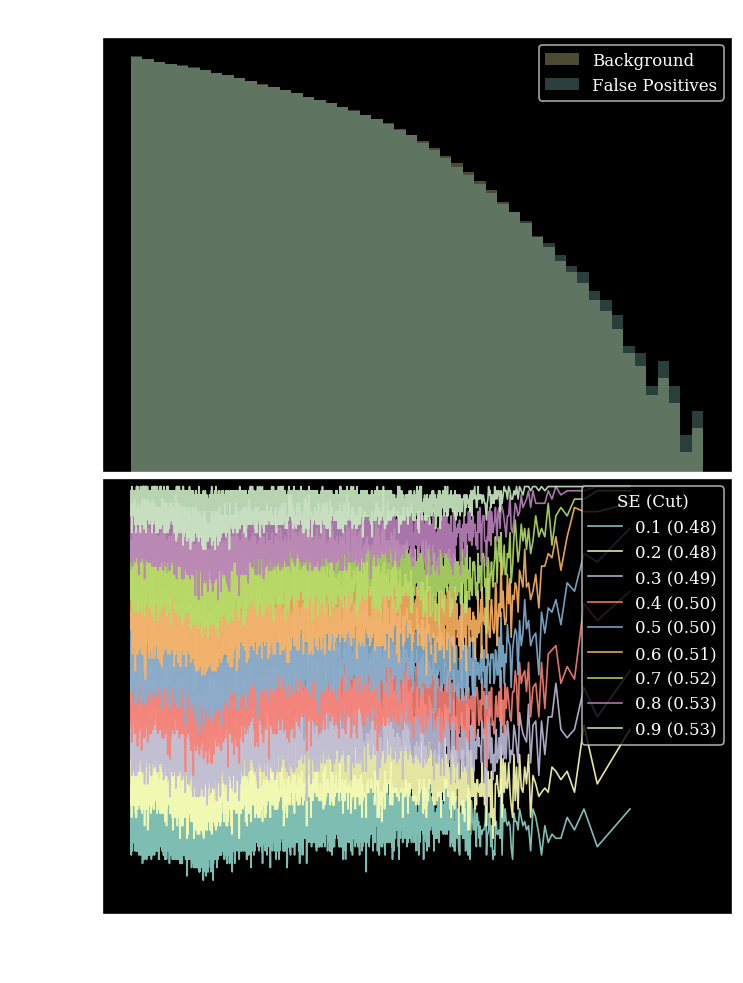

strength 10
Entering Training...
Epoch:0001/0200  (8.1  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (281.2s)
 Train: loss:0.0145, acc:38% || Val: loss: 0.1102, acc:42%, R50: 1.4447, 1/JSD: 26133.6990
Epoch:0200/0200  (556.6s)
 Train: loss:0.0119, acc:47% || Val: loss: 0.1047, acc:31%, R50: 1.4096, 1/JSD: 23638.7498


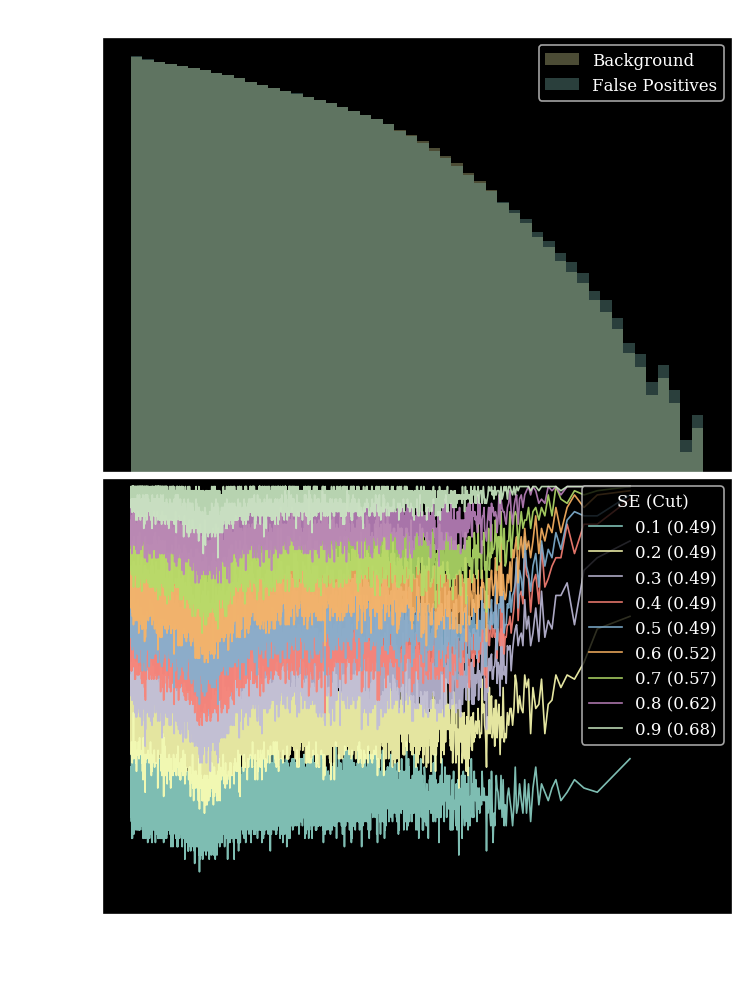

strength 20
Entering Training...
Epoch:0001/0200  (8.2  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (277.2s)
 Train: loss:0.0200, acc:29% || Val: loss: 0.1576, acc:63%, R50: 1.4123, 1/JSD: 26773.5368
Epoch:0200/0200  (547.8s)
 Train: loss:0.0112, acc:30% || Val: loss: 0.1467, acc:80%, R50: 1.4016, 1/JSD: 29921.6912


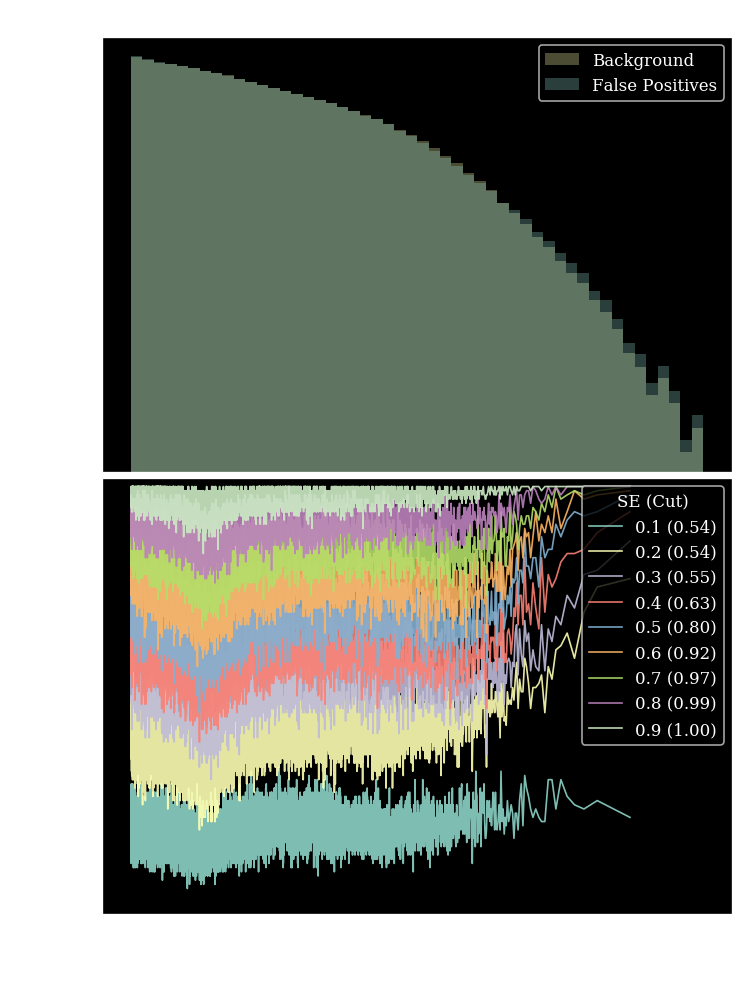

strength 100
Entering Training...
Epoch:0001/0200  (8.2  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (281.4s)
 Train: loss:nan, acc:0% || Val: loss: nan, acc:0%, R50: inf, 1/JSD: nan


../utils.py:261: RuntimeWarning: invalid value encountered in less
  R50 = 1/((preds[targets==1]<c).sum()/(targets==1).sum())
../utils.py:261: RuntimeWarning: divide by zero encountered in double_scalars
  R50 = 1/((preds[targets==1]<c).sum()/(targets==1).sum())
../utils.py:266: RuntimeWarning: invalid value encountered in less
  q, _ = np.histogram(m[(targets==1)&(preds<c)],bins=bins,density = True)
/home/kitouni/anaconda3/envs/root3.7/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


Epoch:0200/0200  (553.1s)
 Train: loss:nan, acc:0% || Val: loss: nan, acc:0%, R50: inf, 1/JSD: nan


/home/kitouni/anaconda3/envs/root3.7/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in less
  if sys.path[0] == '':
/home/kitouni/anaconda3/envs/root3.7/lib/python3.7/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/kitouni/anaconda3/envs/root3.7/lib/python3.7/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/home/kitouni/anaconda3/envs/root3.7/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide
/home/kitouni/anaconda3/envs/root3.7/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in less


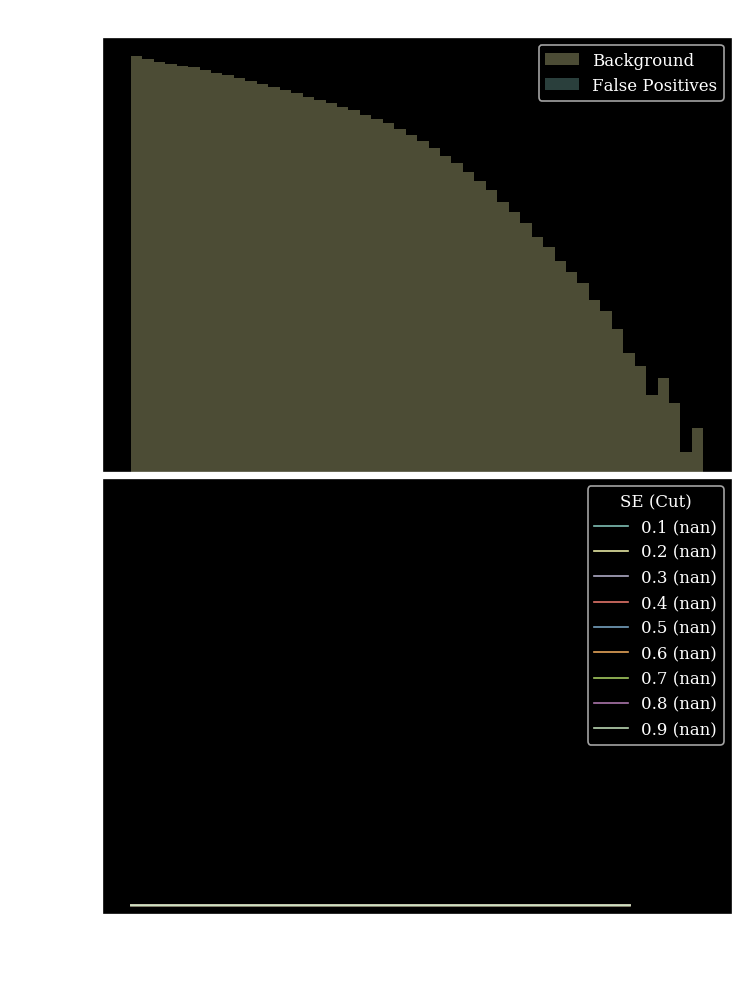

strength 1000
Entering Training...
Epoch:0001/0200  (8.3  s)
 Train: loss:0.0000, acc:0% || Val: loss: 0.0975, acc:20%, R50: 2.4155, 1/JSD: 340.5323
Epoch:0100/0200  (289.6s)
 Train: loss:nan, acc:0% || Val: loss: nan, acc:0%, R50: inf, 1/JSD: nan
Epoch:0200/0200  (561.0s)
 Train: loss:nan, acc:0% || Val: loss: nan, acc:0%, R50: inf, 1/JSD: nan


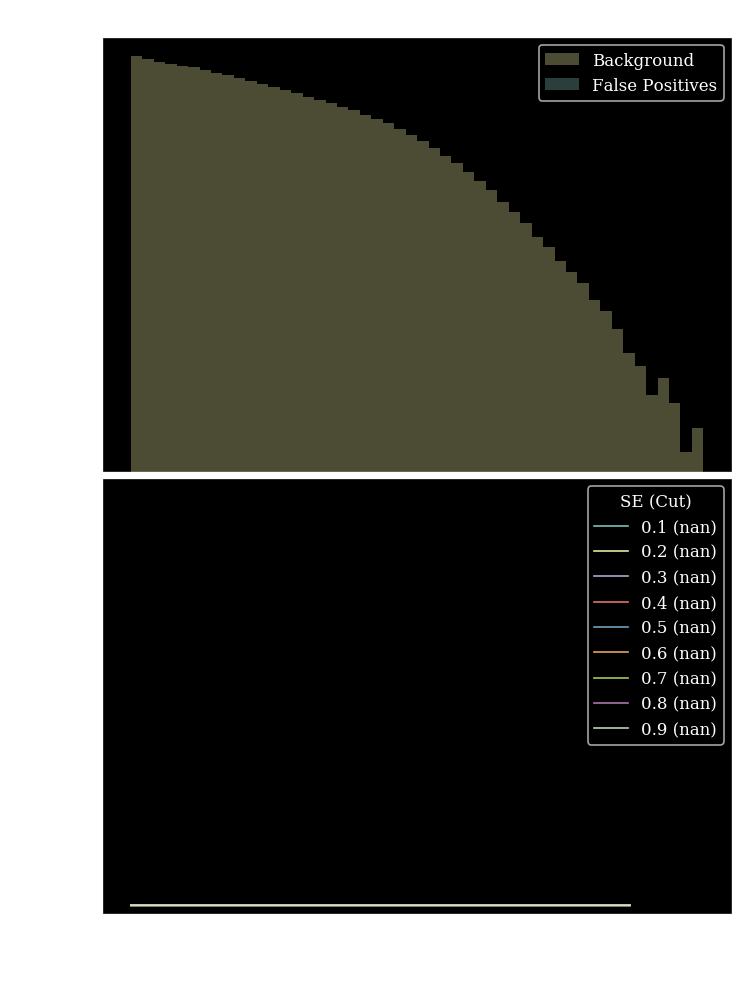

In [10]:
for i,frac in enumerate([1,10,20,100,1000]):
    print("strength",frac)
    metrics_train_L = Metrics()
    metrics_val_L = Metrics(validation=True)

    torch.manual_seed(777)
    model_L = Classifier().to(device)
    optimizer = torch.optim.SGD(model_L.parameters(),lr=8e-2,momentum=0.)
    loss =  Disco(frac=frac,labels=traindataset.labels,background_only=True,msefrac=0)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=200, gamma=0.9)
    log=Logger("./logs/logWFCNDisCoLoss(nosme).txt")
    model_L.fit(traindataset=traindataset,
                valdataset=valdataset,
                optimizer=optimizer,
                loss=loss,
                **params,
                log=log,
              #scheduler=scheduler,
              metrics=[metrics_train_L,metrics_val_L])
    plot_stuff(model=model_L,name=f"DisCo DNN str{frac}",X=X,y=test_labels,x_biased=test[:,0])